In [2]:
!pip install torchlars


/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


  Preparing metadata (setup.py) ... done
  Created wheel for torchlars: filename=torchlars-0.1.2-cp310-cp310-linux_x86_64.whl size=170489 sha256=f7f1c749a5cb67e9cbd1cc4fc5d86d403eb54711400dc2515e628c91cfd87ed7
  Stored in directory: /root/.cache/pip/wheels/b4/91/c8/c631927a6e259206b572e7461e6d049b4379d27523c1065e30
Successfully built torchlars


First Experiment : 


batch_size = 128
num_epochs = 50
learning_rate = 1e-3
temperature = 0.1

In [15]:
#imports

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter
from torchlars import LARS
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
# Device configuration

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyperparameters

batch_size = 128
num_epochs = 50
learning_rate = 1e-3
temperature = 0.1

# Data transforms to be applied to the training images

transform = transforms.Compose([
    transforms.RandomResizedCrop(32, antialias=True),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])

# CIFAR10 dataset

train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

# Select a specific image and its label from the dataset to be followed across all epochs for visualization

fixed_image, fixed_label = train_dataset[7]  
fixed_image = fixed_image.unsqueeze(0).to(device)  

In [ ]:
# SimCLR model architecture: An encoder (ResNet18) and a projector.
class SimCLRModel(nn.Module):
    def __init__(self):
        super(SimCLRModel, self).__init__()
        self.encoder = torchvision.models.resnet18(pretrained=False)
        self.encoder.fc = nn.Identity()
        self.projector = nn.Sequential(
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Linear(128, 128)
        )

    def forward(self, x):
        z = self.encoder(x)
        p = self.projector(z)
        return z, F.normalize(p, dim=1)

model = SimCLRModel().to(device)

In [ ]:
#SimCLR used  LARS optimizer as it's better for large batch sizes ( original implementation used 4096) but, here we just used 128.
base_optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9, weight_decay=1e-6)
optimizer = LARS(optimizer=base_optimizer, eps=1e-8, trust_coef=0.001)

In [ ]:
# TensorBoard setup
writer = SummaryWriter()

# Loss function of calculating the contrastive loss
def nt_xent_loss(p1, p2, temperature):
    batch_size = p1.shape[0]
    labels = torch.cat([torch.arange(batch_size) for _ in range(2)], dim=0)
    labels = (labels.unsqueeze(0) == labels.unsqueeze(1)).float().to(device)

    features = torch.cat([p1, p2], dim=0)
    similarity_matrix = F.cosine_similarity(features.unsqueeze(1), features.unsqueeze(0), dim=2)

    mask = torch.eye(labels.shape[0], dtype=torch.bool).to(device)
    labels = labels[~mask].view(labels.shape[0], -1)
    similarity_matrix = similarity_matrix[~mask].view(similarity_matrix.shape[0], -1)

    positives = similarity_matrix[labels.bool()].view(labels.shape[0], -1)
    negatives = similarity_matrix[~labels.bool()].view(labels.shape[0], -1)

    logits = torch.cat([positives, negatives], dim=1)
    labels = torch.zeros(logits.shape[0], dtype=torch.long).to(device)

    logits = logits / temperature
    return F.cross_entropy(logits, labels)

Files already downloaded and verified


100%|██████████| 391/391 [00:51<00:00,  7.57it/s]


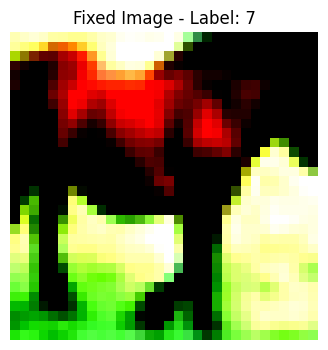

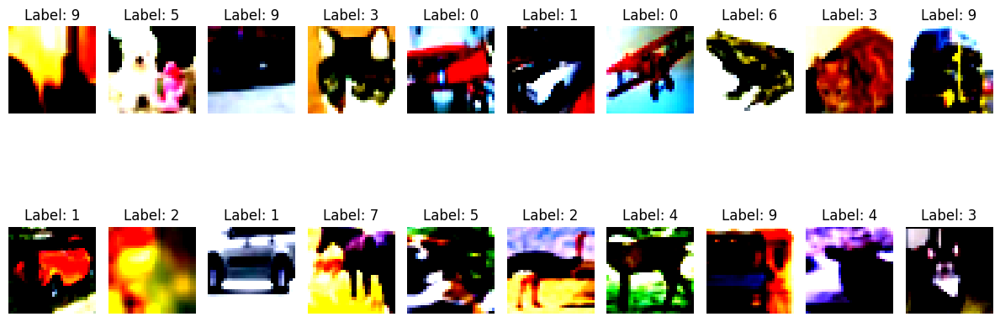

Epoch [1/50], Loss: 1.4424


100%|██████████| 391/391 [00:51<00:00,  7.56it/s]


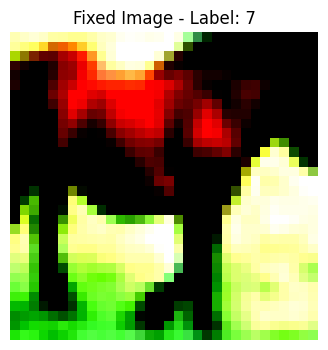

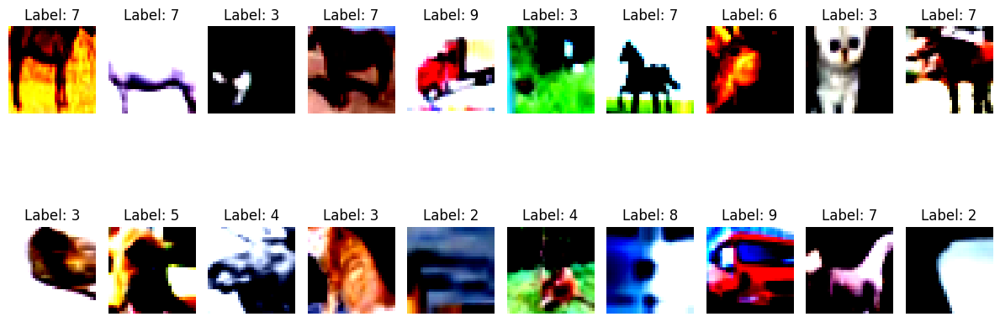

Epoch [2/50], Loss: 0.8815


100%|██████████| 391/391 [00:51<00:00,  7.56it/s]


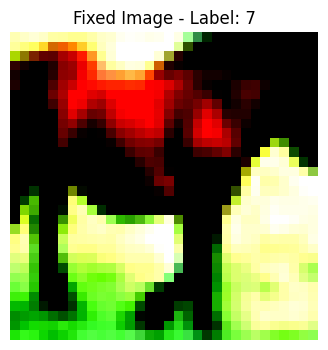

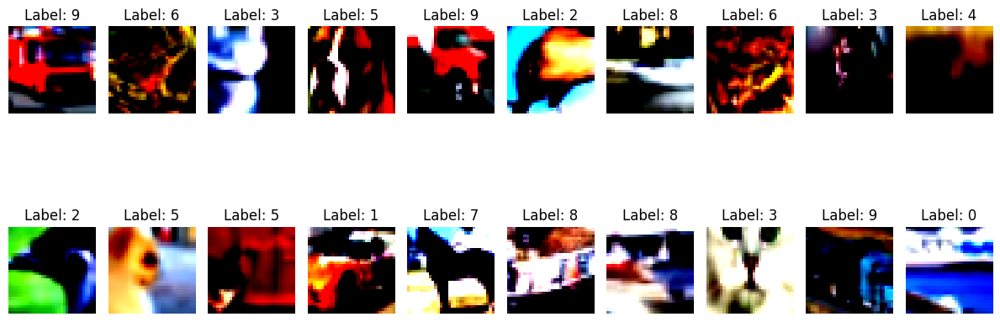

Epoch [3/50], Loss: 0.5258


100%|██████████| 391/391 [00:51<00:00,  7.59it/s]


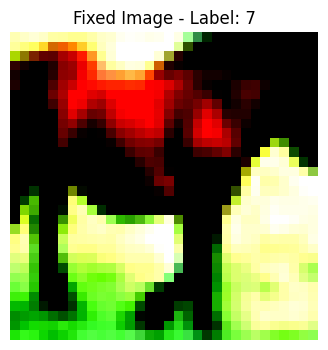

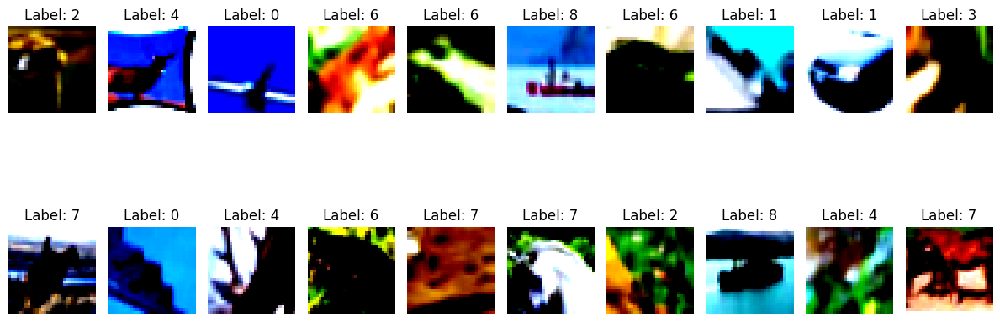

Epoch [4/50], Loss: 0.3120


100%|██████████| 391/391 [00:51<00:00,  7.59it/s]


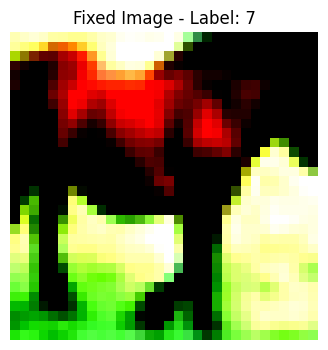

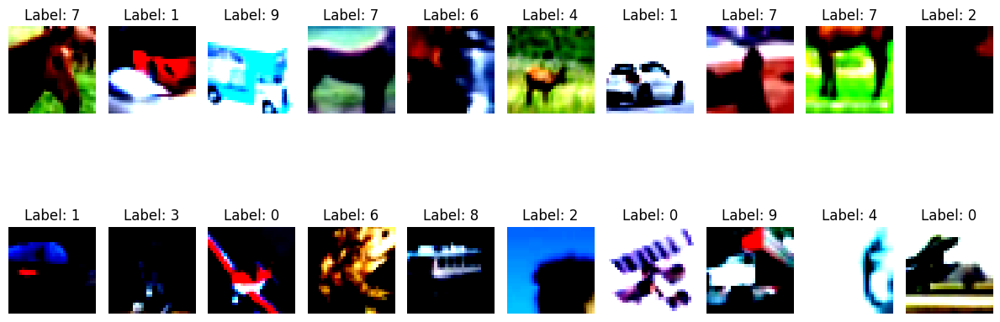

Epoch [5/50], Loss: 0.1913


100%|██████████| 391/391 [00:51<00:00,  7.56it/s]


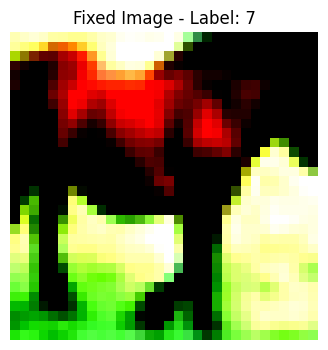

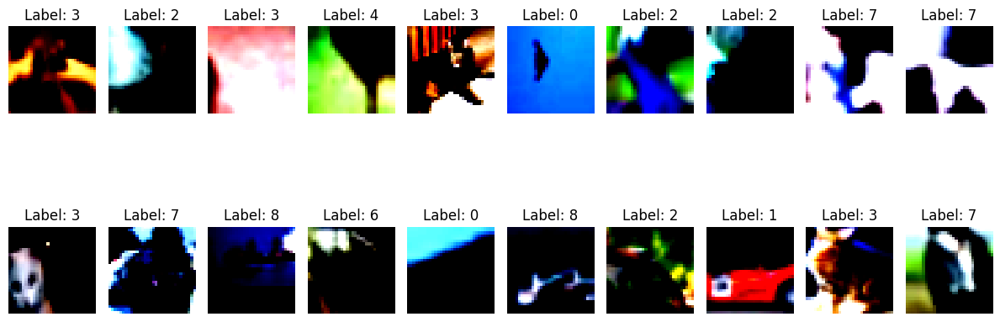

Epoch [6/50], Loss: 0.1256


100%|██████████| 391/391 [00:51<00:00,  7.54it/s]


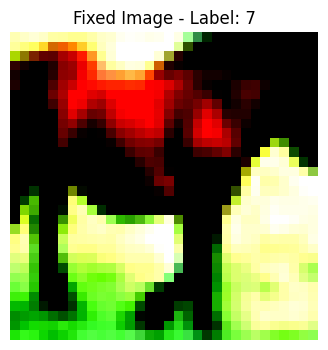

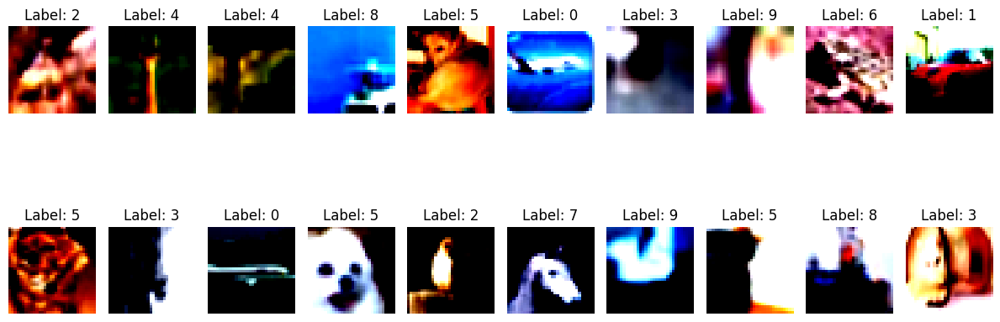

Epoch [7/50], Loss: 0.0893


100%|██████████| 391/391 [00:51<00:00,  7.58it/s]


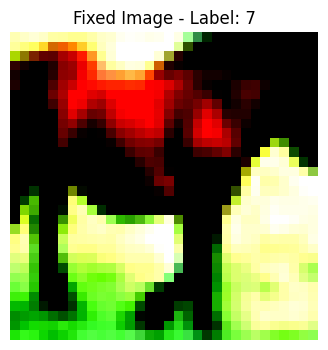

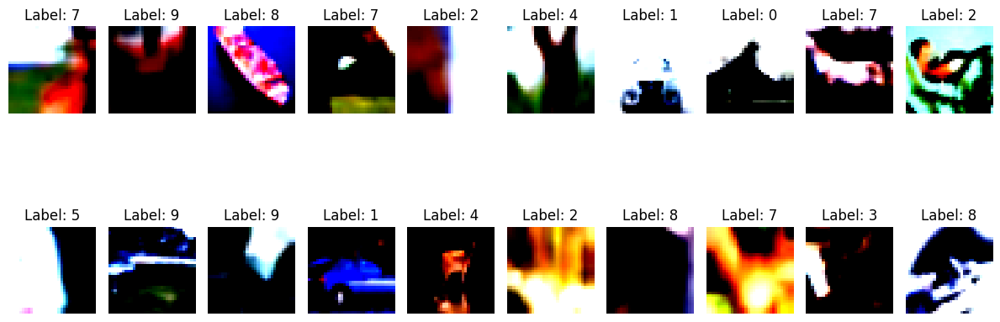

Epoch [8/50], Loss: 0.0679


100%|██████████| 391/391 [00:51<00:00,  7.55it/s]


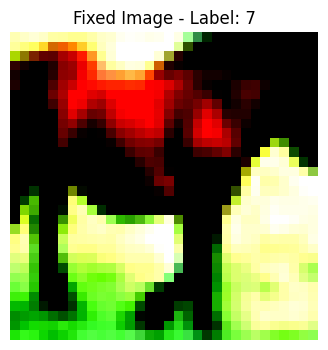

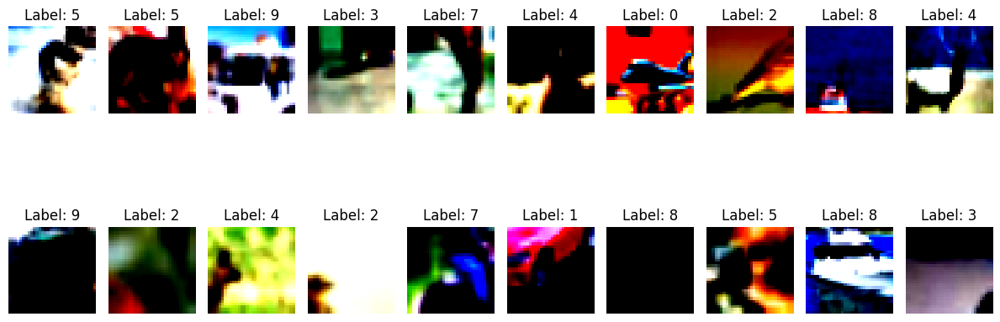

Epoch [9/50], Loss: 0.0546


100%|██████████| 391/391 [00:51<00:00,  7.57it/s]


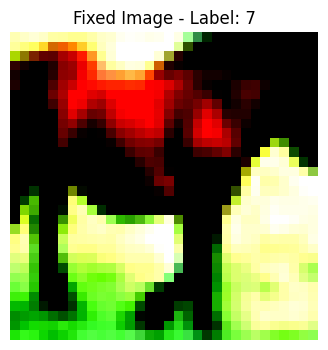

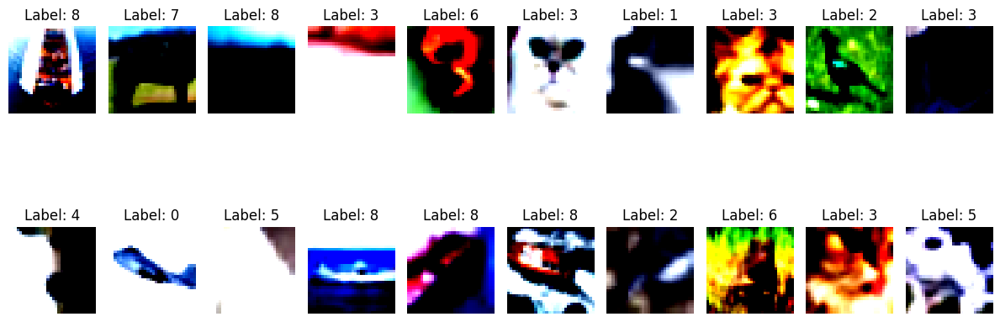

Epoch [10/50], Loss: 0.0456


100%|██████████| 391/391 [00:51<00:00,  7.58it/s]


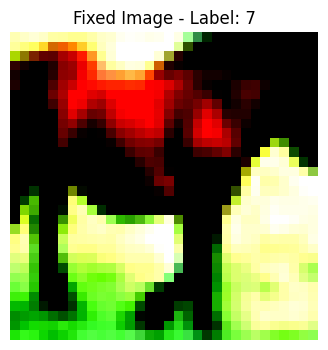

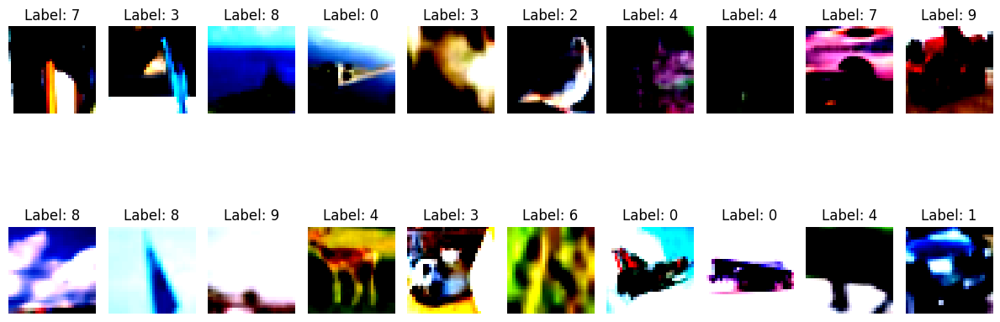

Epoch [11/50], Loss: 0.0395


100%|██████████| 391/391 [00:51<00:00,  7.54it/s]


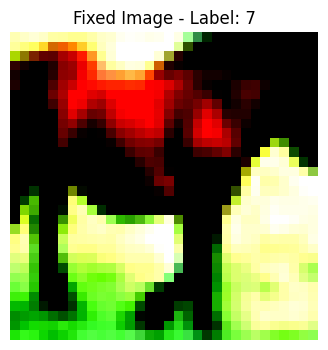

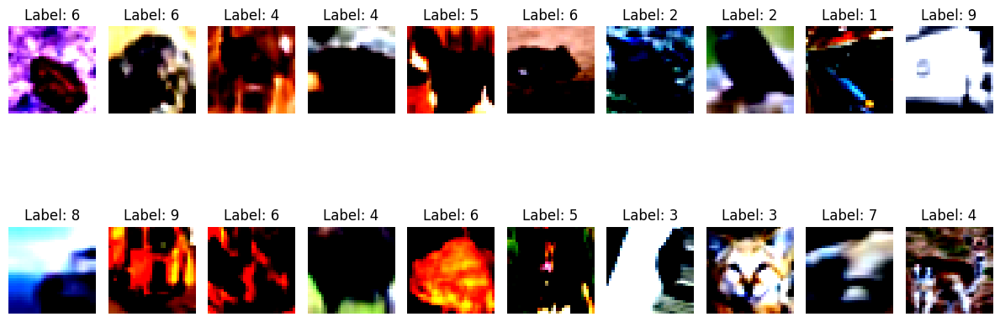

Epoch [12/50], Loss: 0.0353


100%|██████████| 391/391 [00:51<00:00,  7.56it/s]


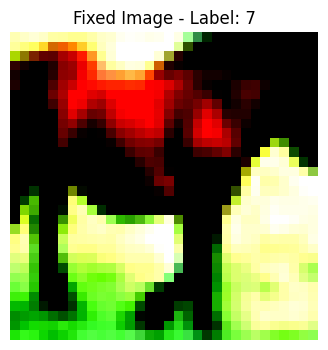

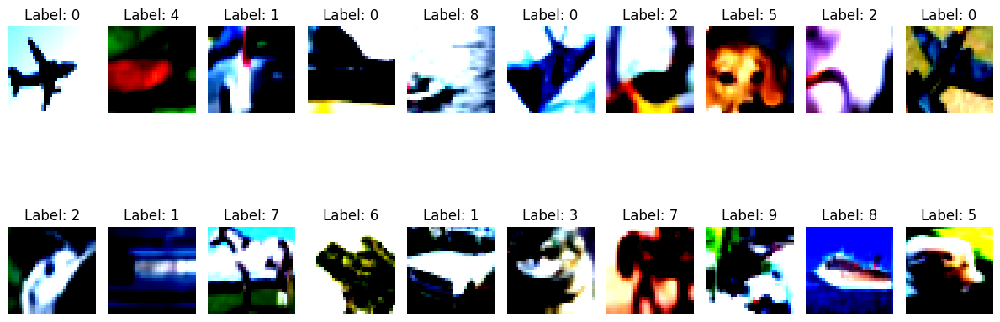

Epoch [13/50], Loss: 0.0324


100%|██████████| 391/391 [00:51<00:00,  7.60it/s]


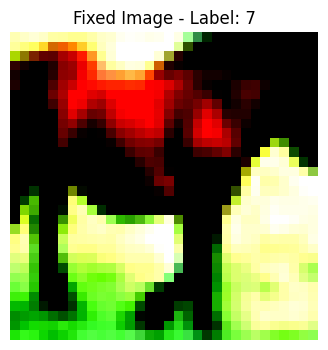

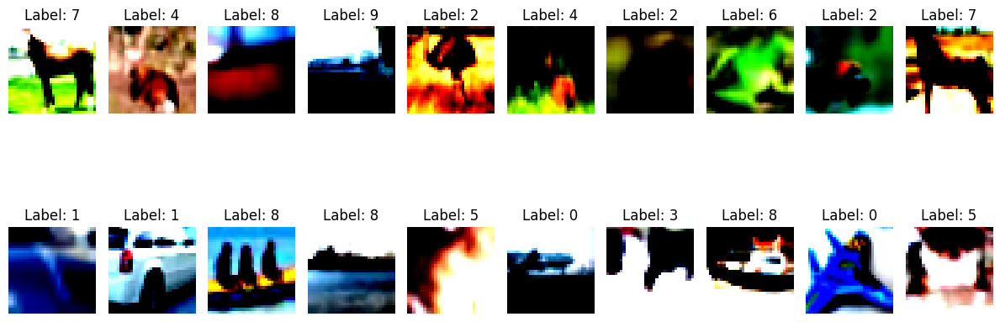

Epoch [14/50], Loss: 0.0304


100%|██████████| 391/391 [00:51<00:00,  7.56it/s]


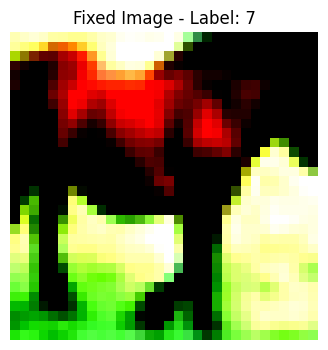

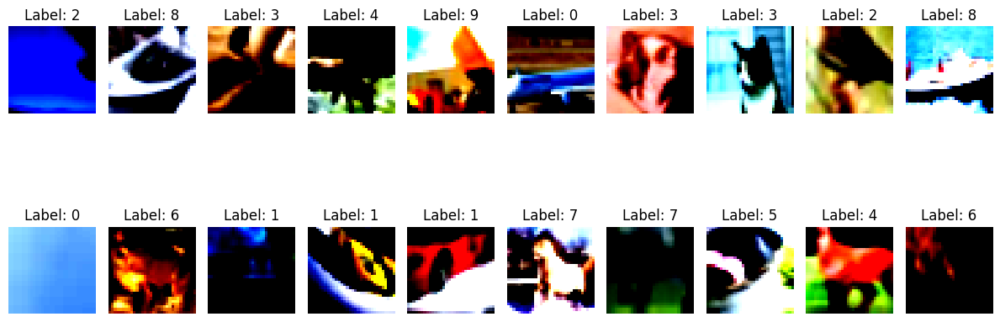

Epoch [15/50], Loss: 0.0291


100%|██████████| 391/391 [00:51<00:00,  7.57it/s]


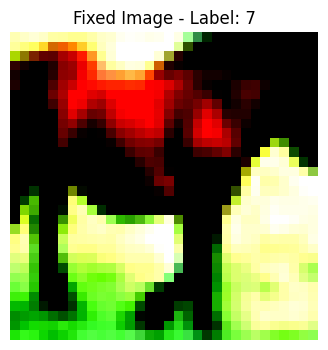

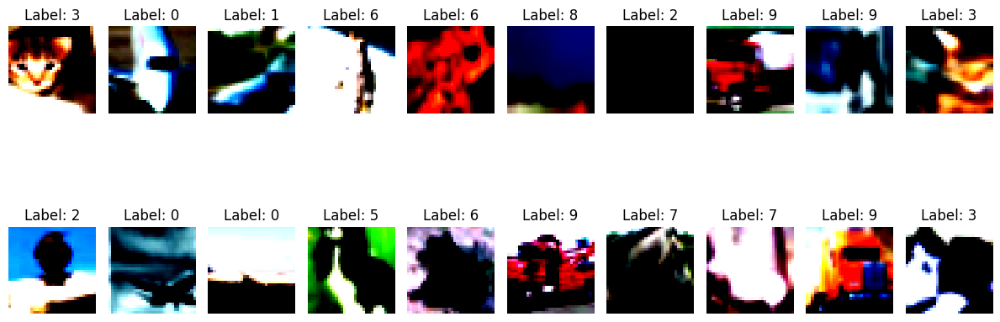

Epoch [16/50], Loss: 0.0284


100%|██████████| 391/391 [00:51<00:00,  7.57it/s]


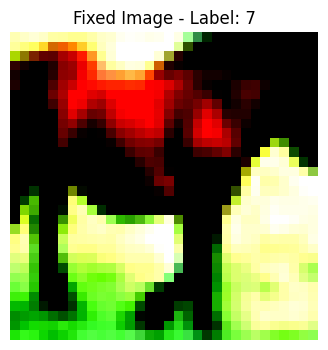

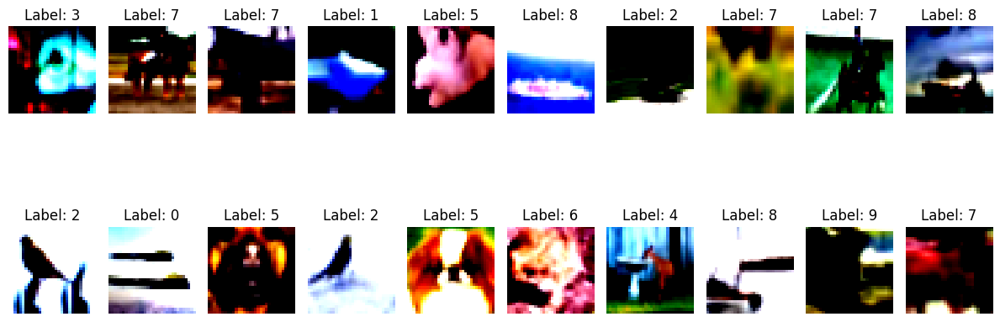

Epoch [17/50], Loss: 0.0279


100%|██████████| 391/391 [00:51<00:00,  7.56it/s]


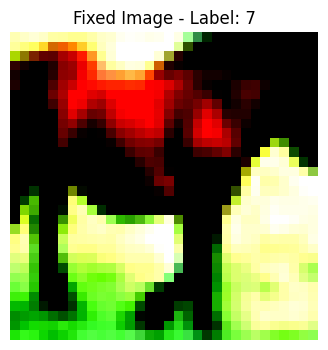

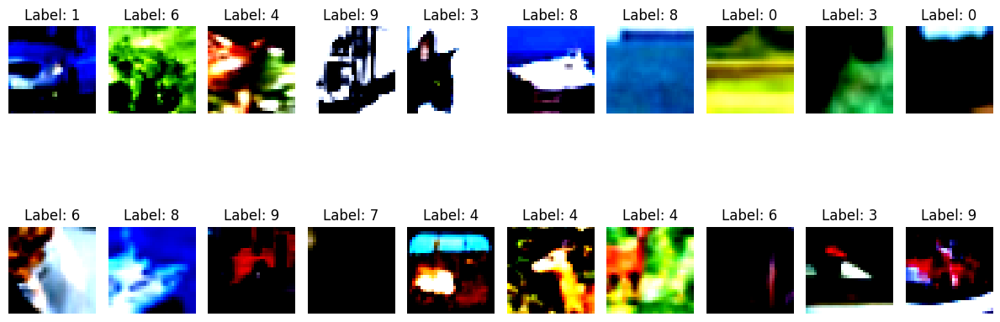

Epoch [18/50], Loss: 0.0274


100%|██████████| 391/391 [00:51<00:00,  7.54it/s]


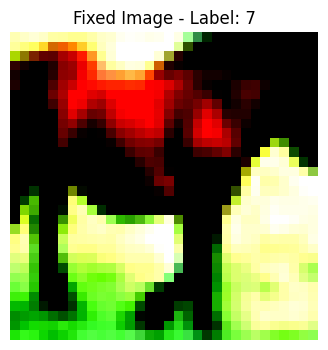

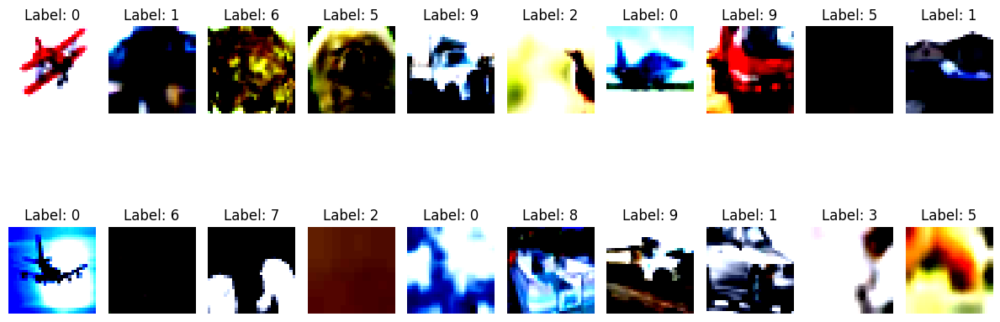

Epoch [19/50], Loss: 0.0270


100%|██████████| 391/391 [00:51<00:00,  7.59it/s]


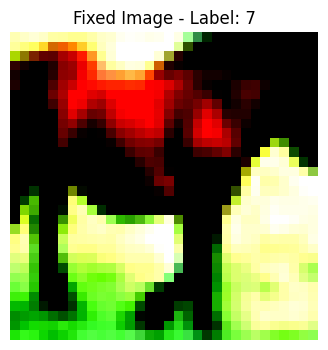

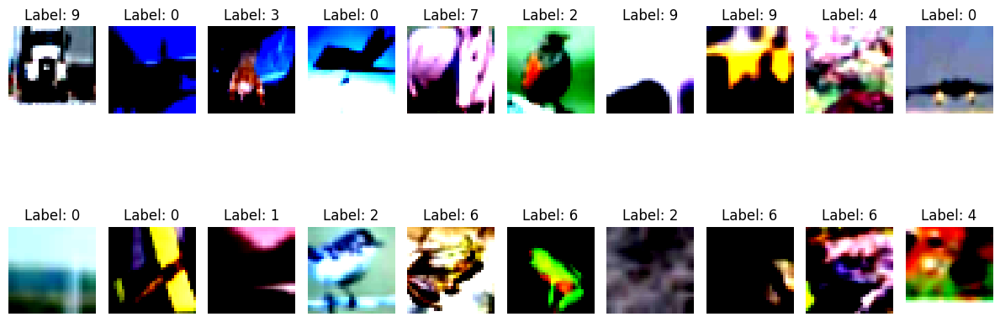

Epoch [20/50], Loss: 0.0267


100%|██████████| 391/391 [00:51<00:00,  7.58it/s]


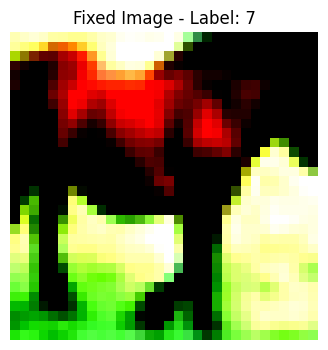

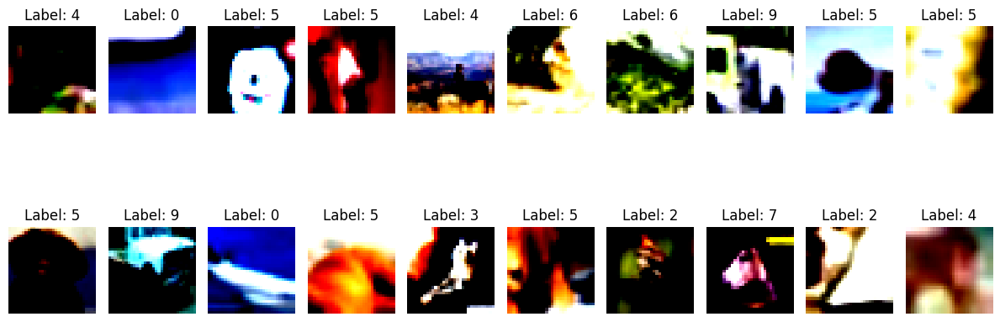

Epoch [23/50], Loss: 0.0259


100%|██████████| 391/391 [00:51<00:00,  7.56it/s]


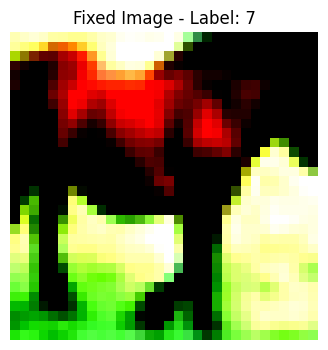

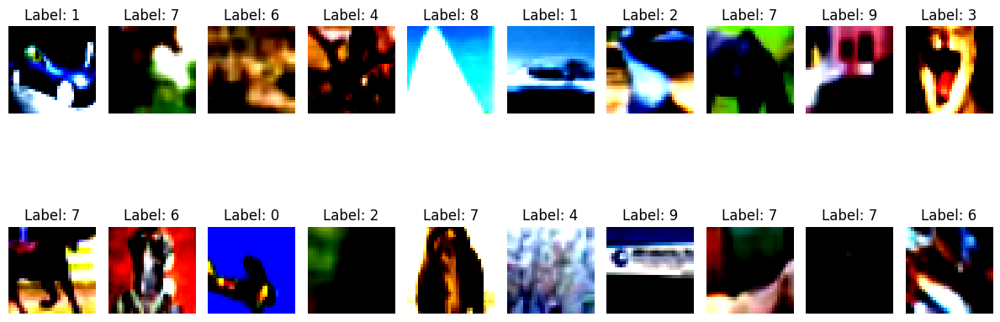

Epoch [24/50], Loss: 0.0257


100%|██████████| 391/391 [00:51<00:00,  7.56it/s]


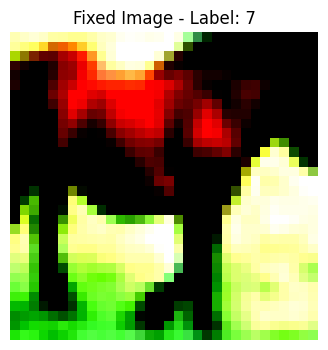

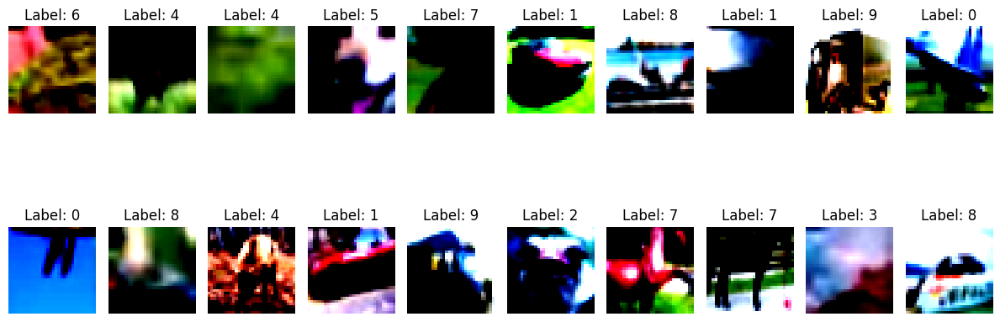

Epoch [25/50], Loss: 0.0254


100%|██████████| 391/391 [00:51<00:00,  7.60it/s]


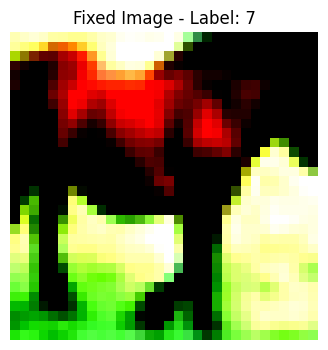

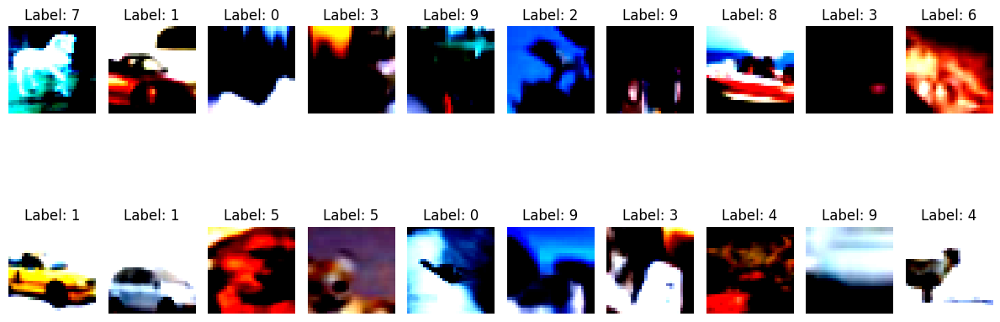

Epoch [26/50], Loss: 0.0253


100%|██████████| 391/391 [00:51<00:00,  7.62it/s]


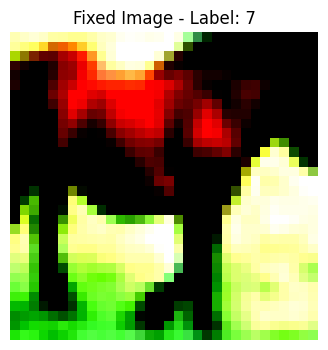

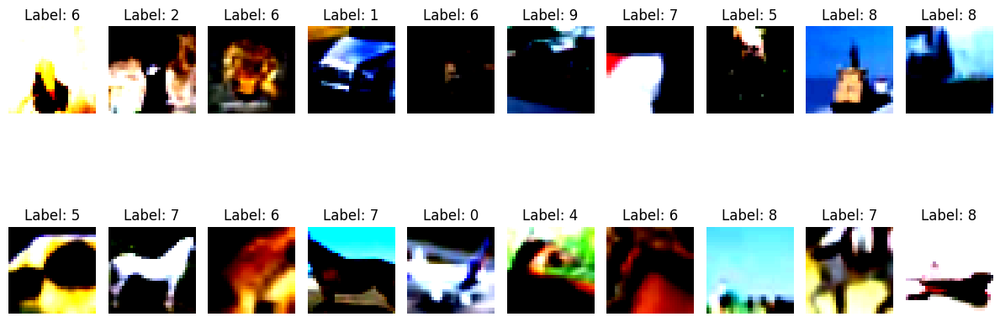

Epoch [27/50], Loss: 0.0250


100%|██████████| 391/391 [00:51<00:00,  7.61it/s]


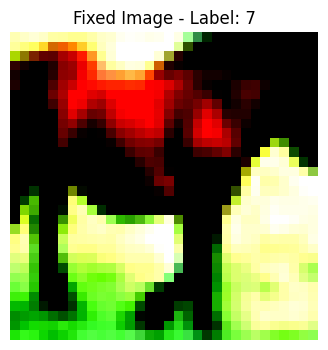

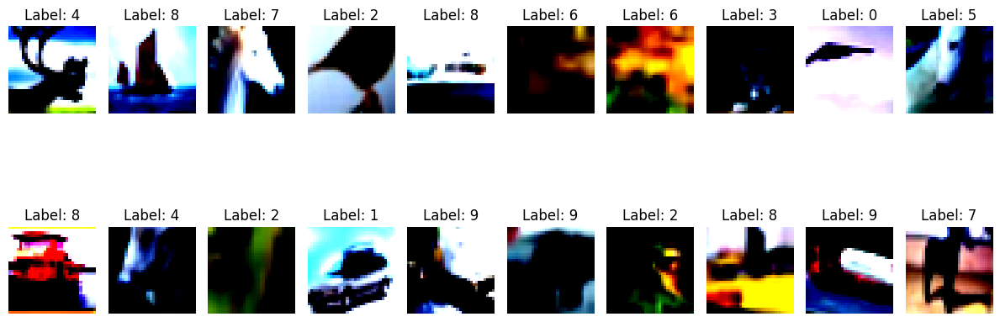

Epoch [28/50], Loss: 0.0249


100%|██████████| 391/391 [00:51<00:00,  7.59it/s]


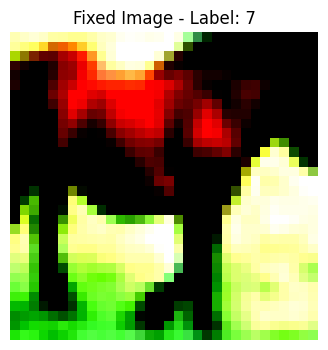

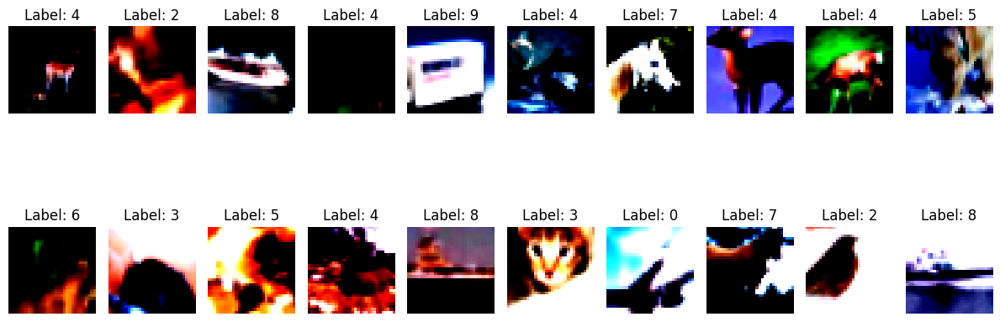

Epoch [29/50], Loss: 0.0247


 79%|███████▉  | 310/391 [00:40<00:10,  7.66it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

100%|██████████| 391/391 [00:51<00:00,  7.61it/s]


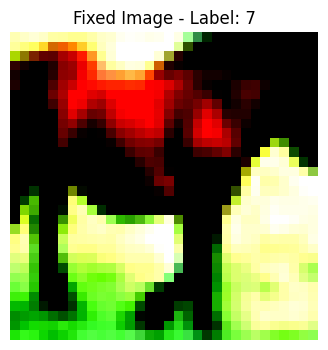

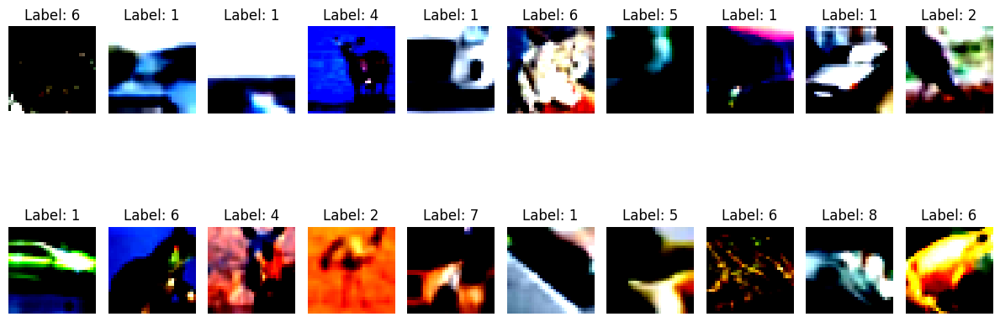

Epoch [33/50], Loss: 0.0242


100%|██████████| 391/391 [00:51<00:00,  7.63it/s]


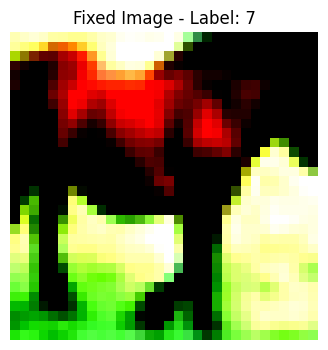

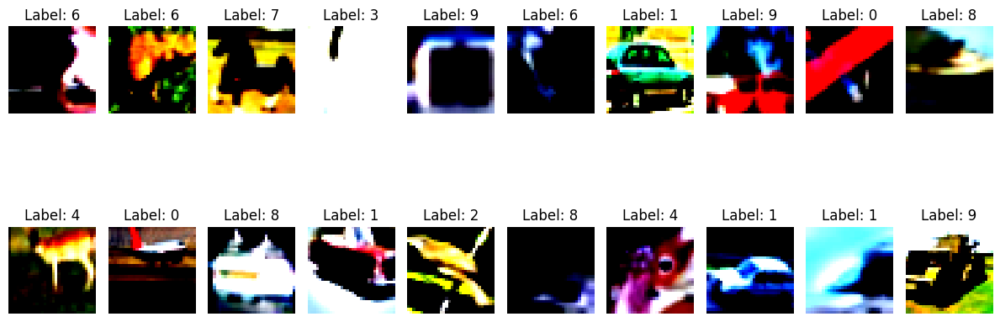

Epoch [34/50], Loss: 0.0241


100%|██████████| 391/391 [00:51<00:00,  7.61it/s]


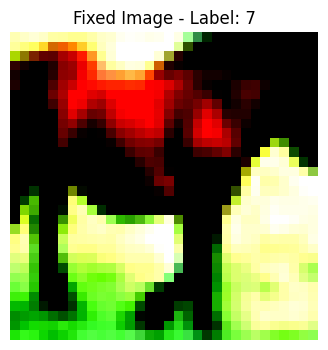

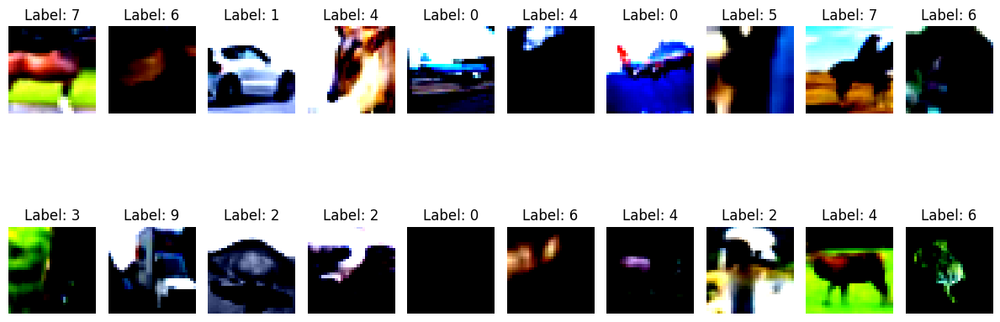

Epoch [35/50], Loss: 0.0240


100%|██████████| 391/391 [00:51<00:00,  7.55it/s]


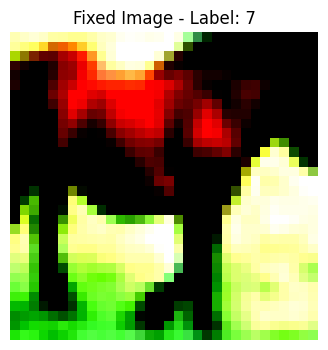

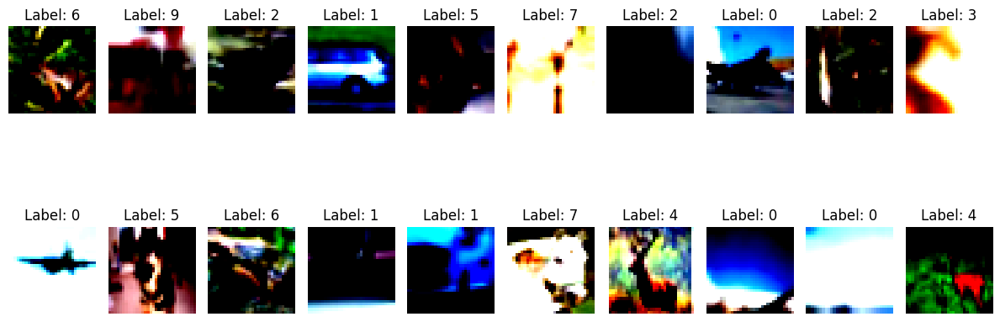

Epoch [36/50], Loss: 0.0239


100%|██████████| 391/391 [00:51<00:00,  7.59it/s]


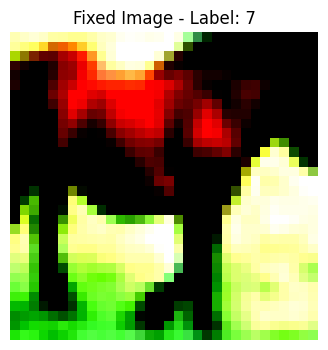

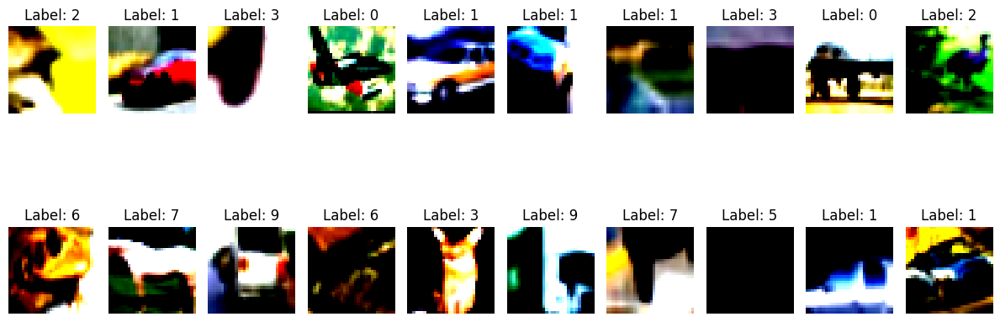

Epoch [37/50], Loss: 0.0238


100%|██████████| 391/391 [00:51<00:00,  7.61it/s]


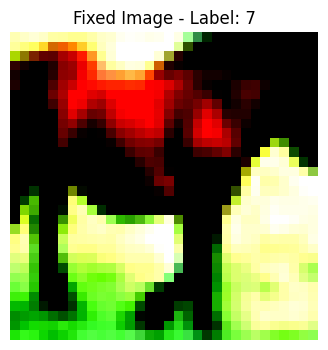

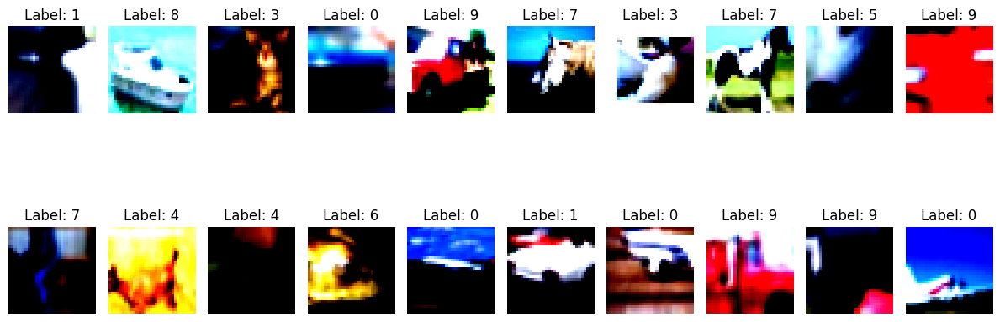

Epoch [38/50], Loss: 0.0236


100%|██████████| 391/391 [00:51<00:00,  7.60it/s]


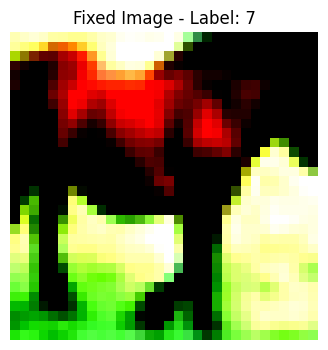

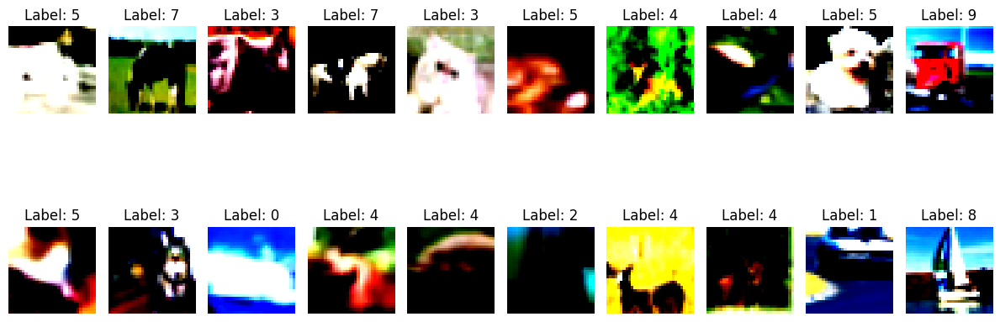

Epoch [39/50], Loss: 0.0235


100%|██████████| 391/391 [00:51<00:00,  7.60it/s]


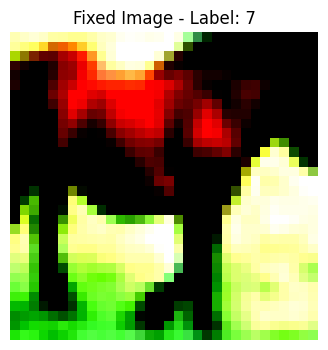

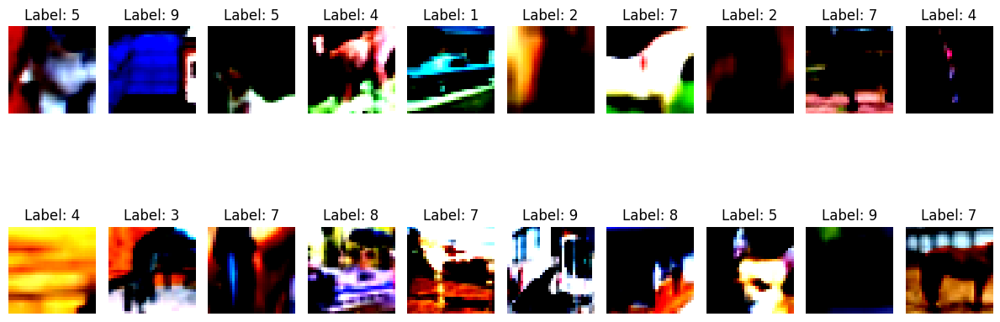

Epoch [40/50], Loss: 0.0234


100%|██████████| 391/391 [00:51<00:00,  7.57it/s]


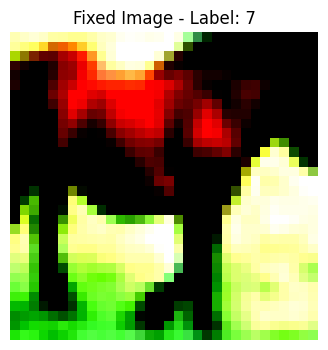

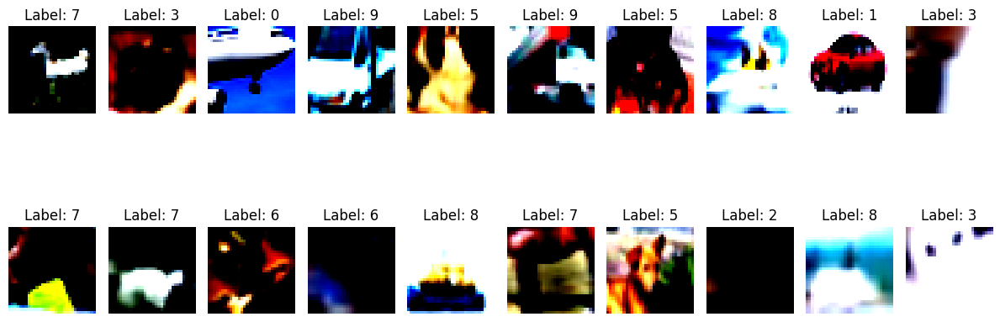

Epoch [41/50], Loss: 0.0234


100%|██████████| 391/391 [00:51<00:00,  7.57it/s]


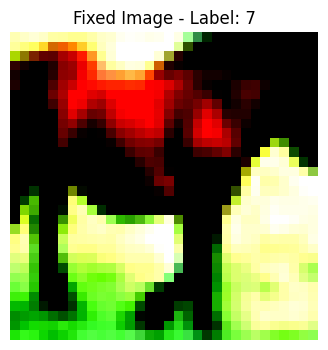

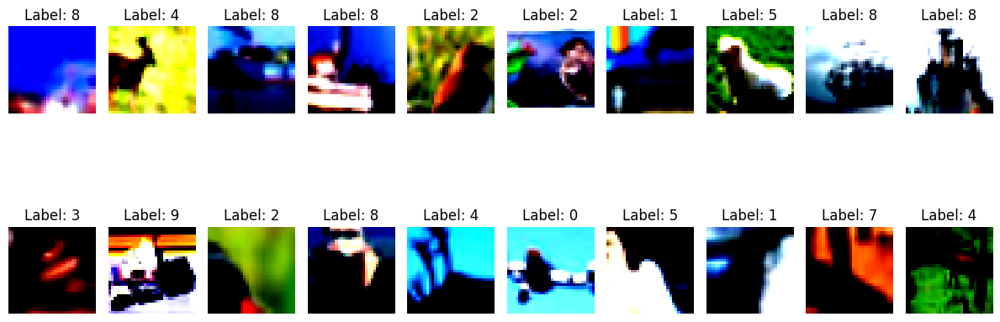

Epoch [42/50], Loss: 0.0233


100%|██████████| 391/391 [00:51<00:00,  7.61it/s]


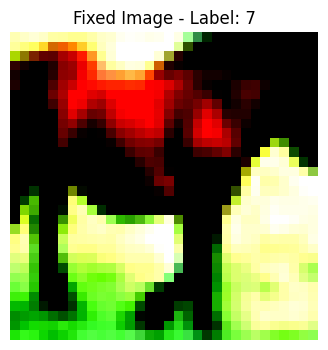

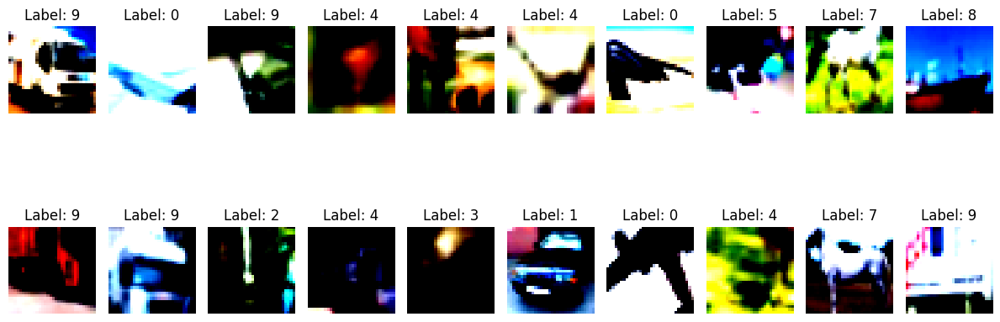

Epoch [43/50], Loss: 0.0232


100%|██████████| 391/391 [00:51<00:00,  7.62it/s]


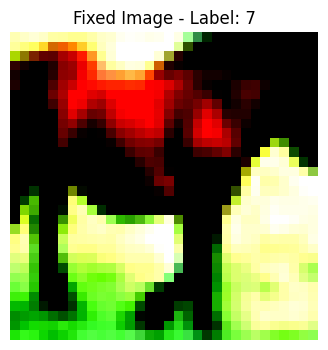

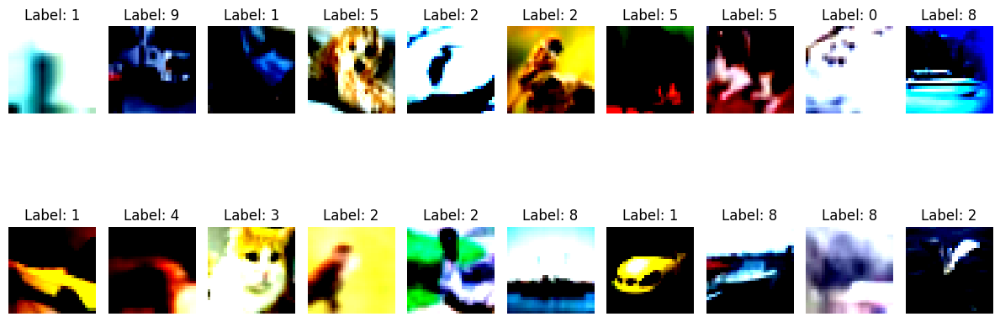

Epoch [44/50], Loss: 0.0232


100%|██████████| 391/391 [00:51<00:00,  7.60it/s]


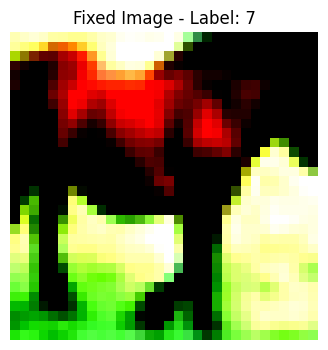

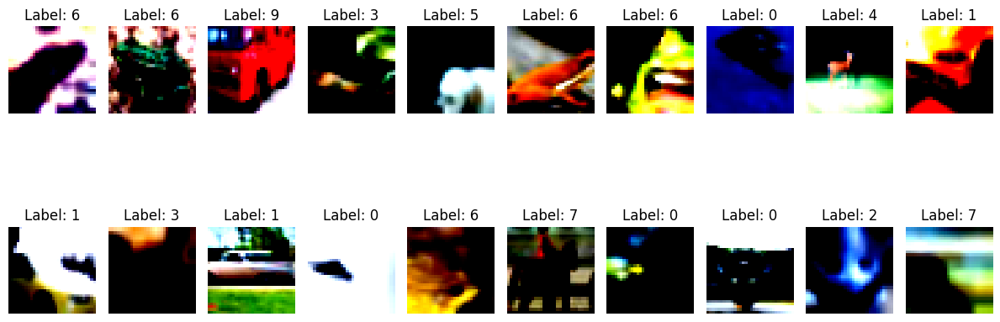

Epoch [45/50], Loss: 0.0230


100%|██████████| 391/391 [00:51<00:00,  7.62it/s]


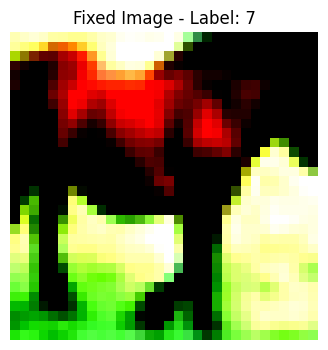

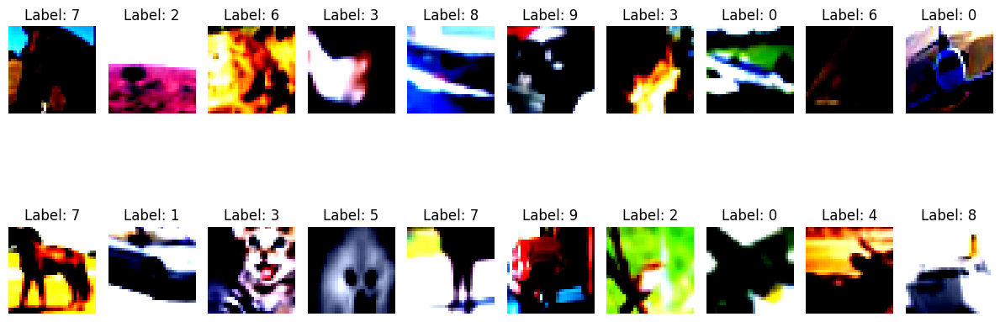

Epoch [46/50], Loss: 0.0230


100%|██████████| 391/391 [00:51<00:00,  7.62it/s]


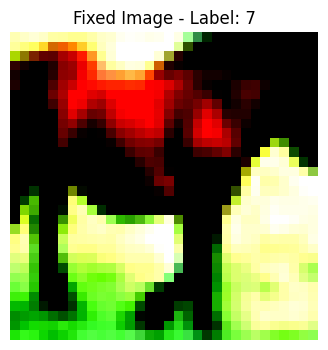

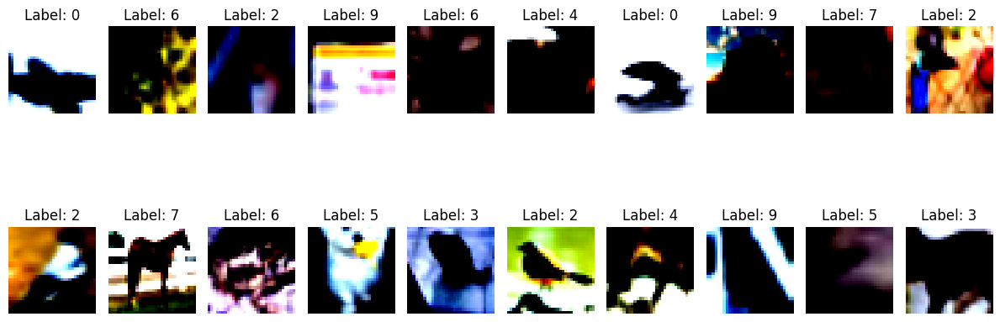

Epoch [47/50], Loss: 0.0229


100%|██████████| 391/391 [00:51<00:00,  7.59it/s]


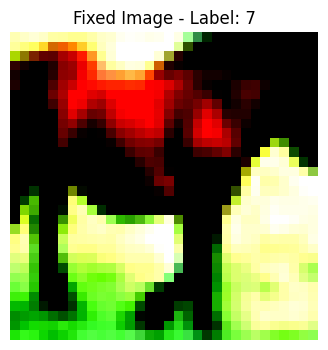

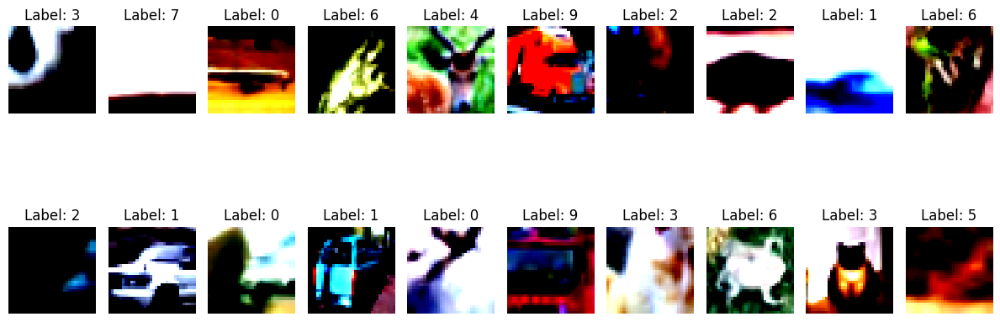

Epoch [48/50], Loss: 0.0228


100%|██████████| 391/391 [00:51<00:00,  7.62it/s]


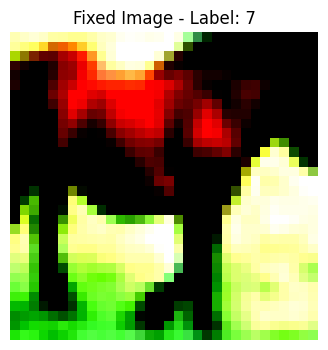

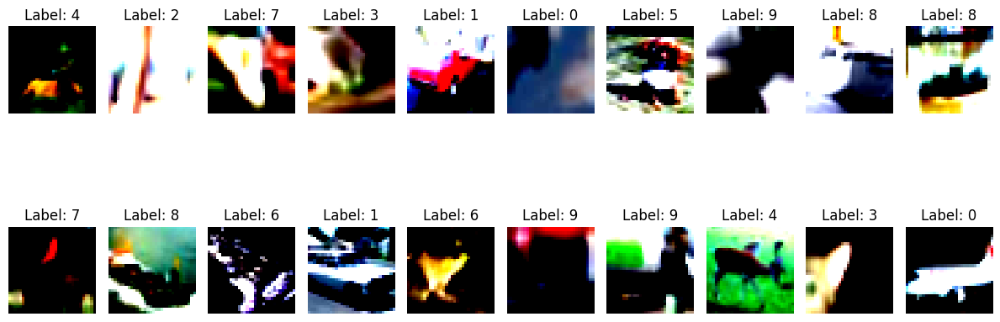

Epoch [49/50], Loss: 0.0228


100%|██████████| 391/391 [00:51<00:00,  7.61it/s]


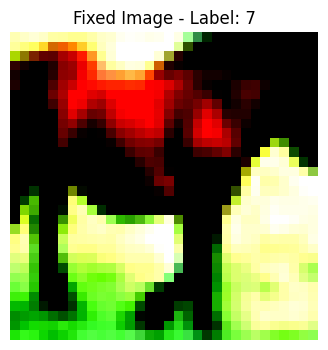

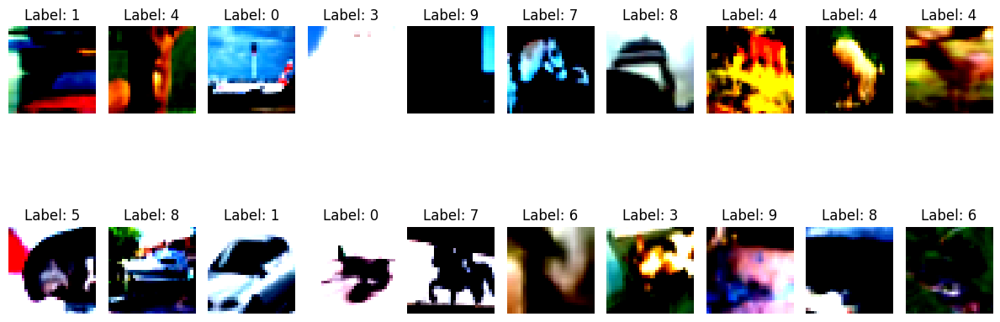

Epoch [50/50], Loss: 0.0227


In [39]:
# Variable to hold the closest indices for the third image
closest_indices = None

# Training loop
for epoch in range(num_epochs):
    total_loss = 0
    all_embeddings = []
    all_labels = []
    all_images = []  
    
    for images, labels in tqdm(train_loader):
        # Get two augmented views of the same image
        img1, img2 = images.to(device), images.to(device)

        z1, p1 = model(img1)
        z2, p2 = model(img2)

        loss = nt_xent_loss(p1, p2, temperature)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        all_embeddings.append(z1)
        all_labels.append(labels)
        all_images.append(img1)

    # Concatenate all embeddings, labels, and images to make access to specific indices easier ( for visualization)
    embeddings = torch.cat(all_embeddings, dim=0)
    labels = torch.cat(all_labels, dim=0)
    images = torch.cat(all_images, dim=0)

    # Compute the embedding of the fixed image in evaluation mode
    model.eval()
    with torch.no_grad():
        fixed_embedding, _ = model(fixed_image)
        fixed_embedding = fixed_embedding.squeeze(0)
    model.train()

    if epoch == 0:
        similarities = F.cosine_similarity(fixed_embedding.unsqueeze(0), embeddings, dim=1)
        _, closest_indices = torch.topk(similarities, k=21, largest=True)
        closest_indices = closest_indices[1:]  # Remove the first index

    writer.add_scalar('Loss', total_loss / len(train_loader), epoch)

    # Visualize the fixed image
    with torch.no_grad():
        fixed_image_np = fixed_image.squeeze(0).cpu().numpy()

        plt.figure(figsize=(4, 4))
        plt.imshow(np.transpose(fixed_image_np, (1, 2, 0)))
        plt.title(f"Fixed Image - Label: {fixed_label}")
        plt.axis('off')
        plt.show()

    # Visualize the 10 closest images to the fixed image
    with torch.no_grad():
        plt.figure(figsize=(12, 6))

        # Plot the 10 closest images and their labels in two rows
        for i, idx in enumerate(closest_indices[:5]):
            image = images[idx].cpu().numpy()
            label = labels[idx].item()
            plt.subplot(2, 10, i + 1)
            plt.imshow(np.transpose(image, (1, 2, 0)))
            plt.title(f"Label: {label}")
            plt.axis('off')

        for i, idx in enumerate(closest_indices[5:]):
            image = images[idx].cpu().numpy()
            label = labels[idx].item()
            plt.subplot(2, 10, i + 6)
            plt.imshow(np.transpose(image, (1, 2, 0)))
            plt.title(f"Label: {label}")
            plt.axis('off')

        plt.tight_layout()
        plt.show()

    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {total_loss / len(train_loader):.4f}')

writer.close()


Second Experiment:

We ran the model for longer training but similar results were observed.

batch_size = 128
num_epochs = 100
learning_rate = 1e-2
temperature = 0.1


In [ ]:
#imports
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter
from torchlars import LARS
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
# Device configuration

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyperparameters

batch_size = 128
num_epochs = 100
learning_rate = 1e-2
temperature = 0.1

# Data transforms to be applied to the training images

transform = transforms.Compose([
    transforms.RandomResizedCrop(32, antialias=True),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])

# CIFAR10 dataset
train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

# Select a specific image and its label from the dataset to be followed across all epochs for visualization
fixed_image, fixed_label = train_dataset[7]  
fixed_image = fixed_image.unsqueeze(0).to(device)  


In [ ]:
# SimCLR model architecture: An encoder (ResNet18) and a projector.
class SimCLRModel(nn.Module):
    def __init__(self):
        super(SimCLRModel, self).__init__()
        self.encoder = torchvision.models.resnet18(pretrained=False)
        self.encoder.fc = nn.Identity()
        self.projector = nn.Sequential(
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Linear(128, 128)
        )

    def forward(self, x):
        z = self.encoder(x)
        p = self.projector(z)
        return z, F.normalize(p, dim=1)

model = SimCLRModel().to(device)

In [ ]:
#SimCLR used  LARS optimizer as it's better for large batch sizes ( original implementation used 4096) but, here we just used 128.
base_optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9, weight_decay=1e-6)
optimizer = LARS(optimizer=base_optimizer, eps=1e-8, trust_coef=0.001)


In [ ]:
# TensorBoard setup
writer = SummaryWriter()

# Loss function of calculating the contrastive loss
def nt_xent_loss(p1, p2, temperature):
    batch_size = p1.shape[0]
    labels = torch.cat([torch.arange(batch_size) for _ in range(2)], dim=0)
    labels = (labels.unsqueeze(0) == labels.unsqueeze(1)).float().to(device)

    features = torch.cat([p1, p2], dim=0)
    similarity_matrix = F.cosine_similarity(features.unsqueeze(1), features.unsqueeze(0), dim=2)

    mask = torch.eye(labels.shape[0], dtype=torch.bool).to(device)
    labels = labels[~mask].view(labels.shape[0], -1)
    similarity_matrix = similarity_matrix[~mask].view(similarity_matrix.shape[0], -1)

    positives = similarity_matrix[labels.bool()].view(labels.shape[0], -1)
    negatives = similarity_matrix[~labels.bool()].view(labels.shape[0], -1)

    logits = torch.cat([positives, negatives], dim=1)
    labels = torch.zeros(logits.shape[0], dtype=torch.long).to(device)

    logits = logits / temperature
    return F.cross_entropy(logits, labels)

Files already downloaded and verified


100%|██████████| 391/391 [00:52<00:00,  7.50it/s]


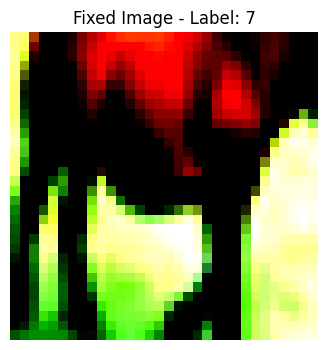

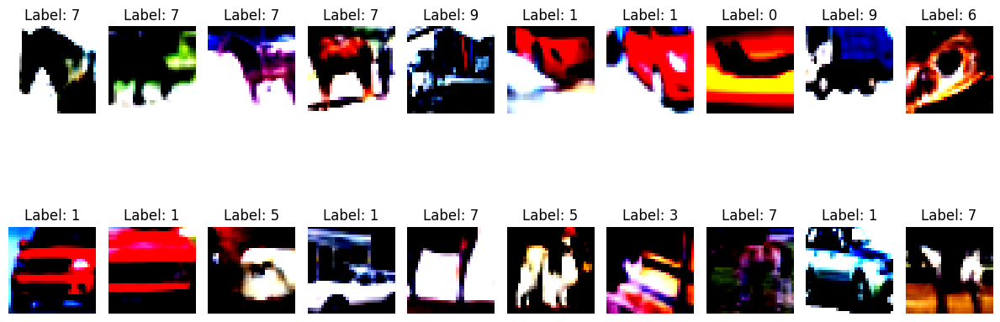

Epoch [1/100], Loss: 0.3351
Epoch [1/100], How simialr?: 7 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.51it/s]


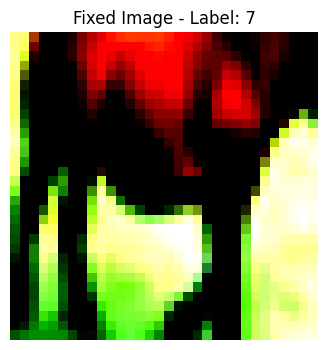

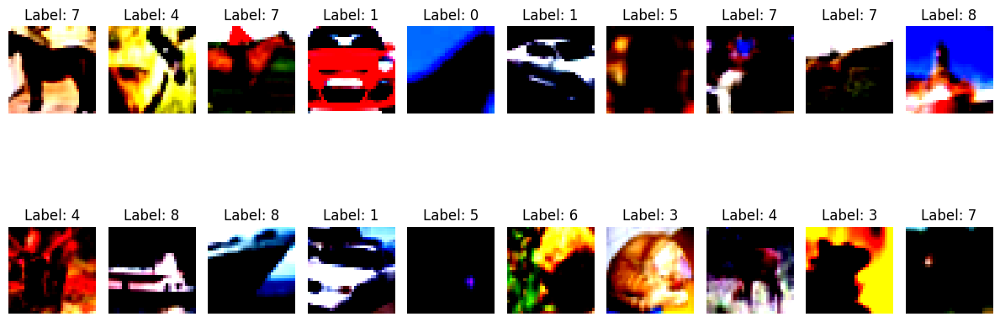

Epoch [2/100], Loss: 0.0314
Epoch [2/100], How simialr?: 5 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.49it/s]


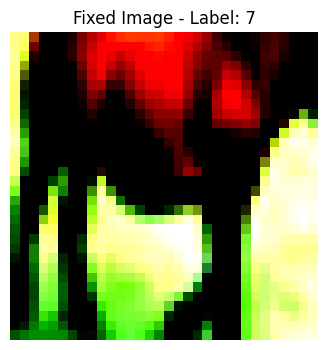

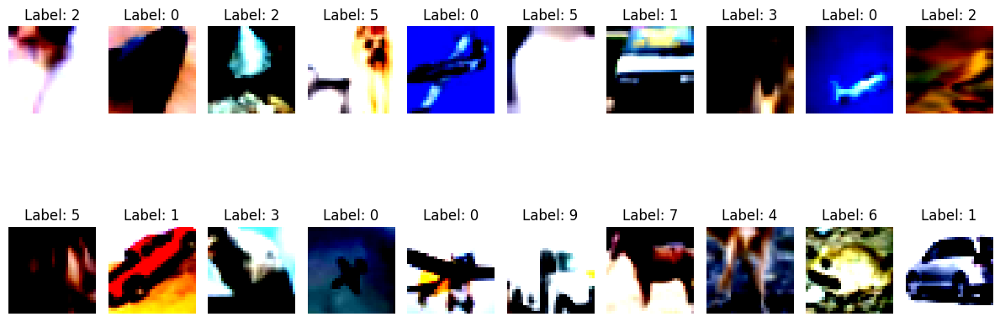

Epoch [3/100], Loss: 0.0261
Epoch [3/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.48it/s]


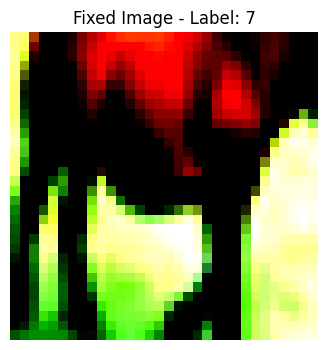

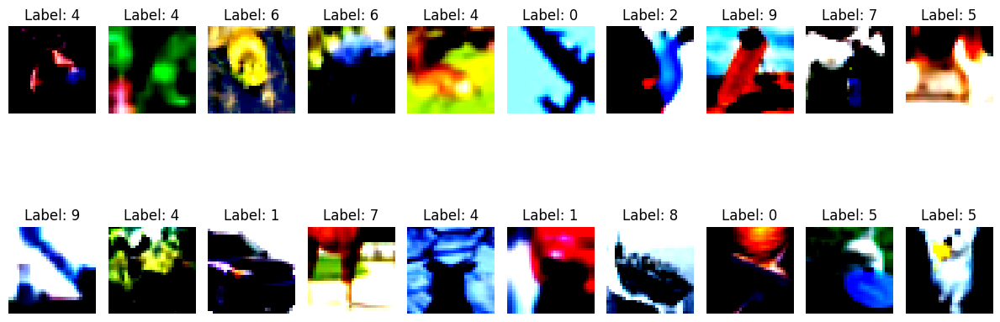

Epoch [4/100], Loss: 0.0245
Epoch [4/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.46it/s]


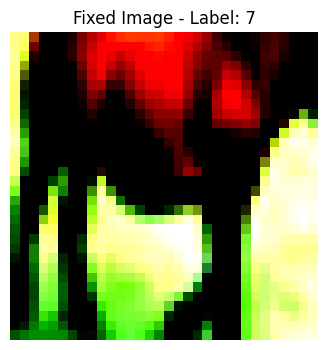

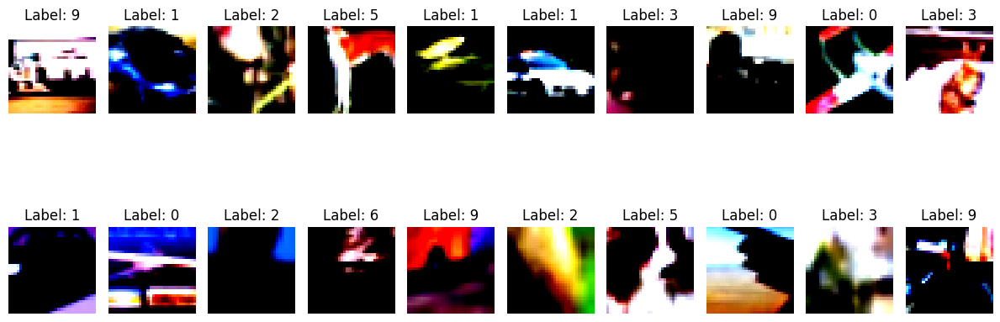

Epoch [5/100], Loss: 0.0235
Epoch [5/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


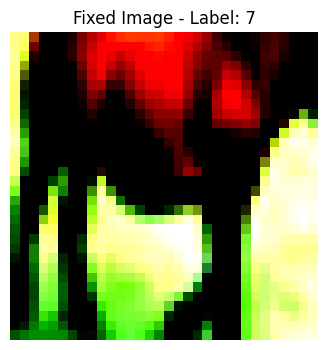

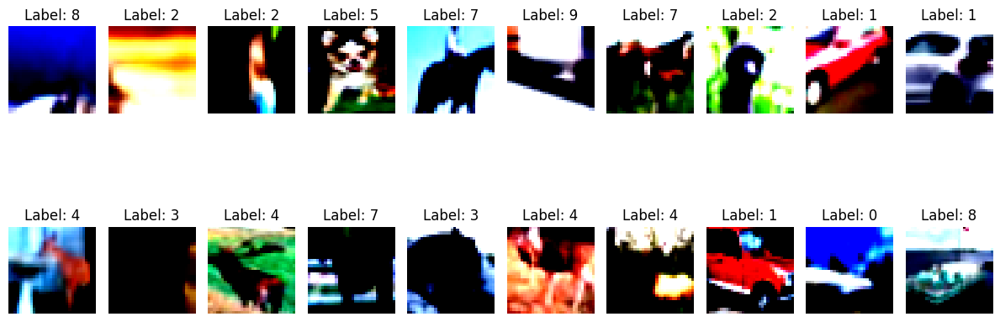

Epoch [6/100], Loss: 0.0228
Epoch [6/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


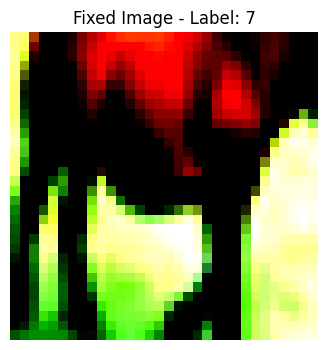

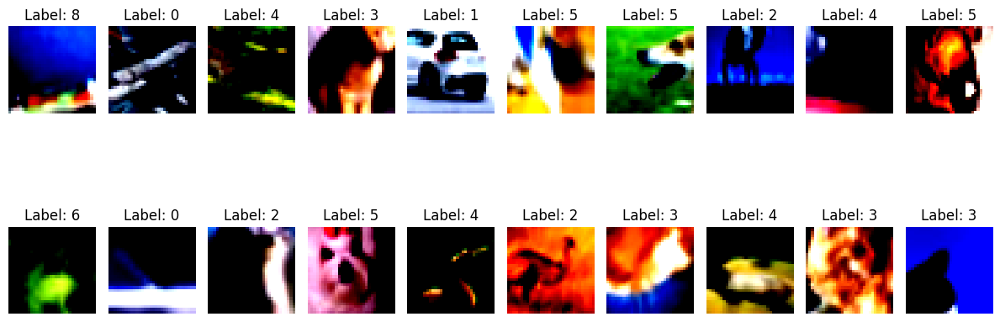

Epoch [7/100], Loss: 0.0223
Epoch [7/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.45it/s]


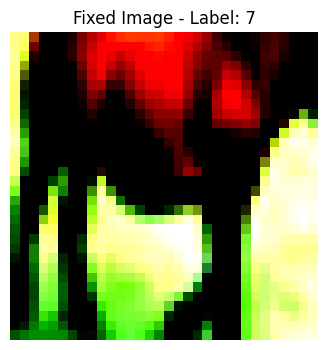

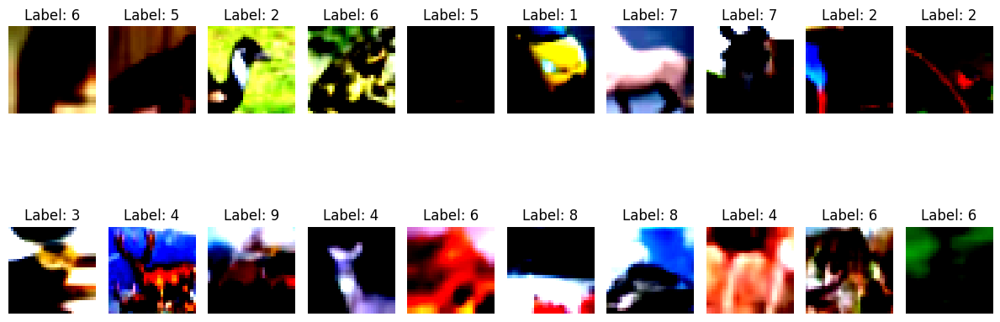

Epoch [8/100], Loss: 0.0219
Epoch [8/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


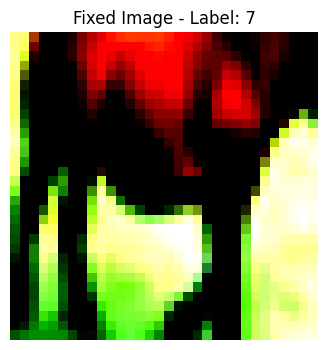

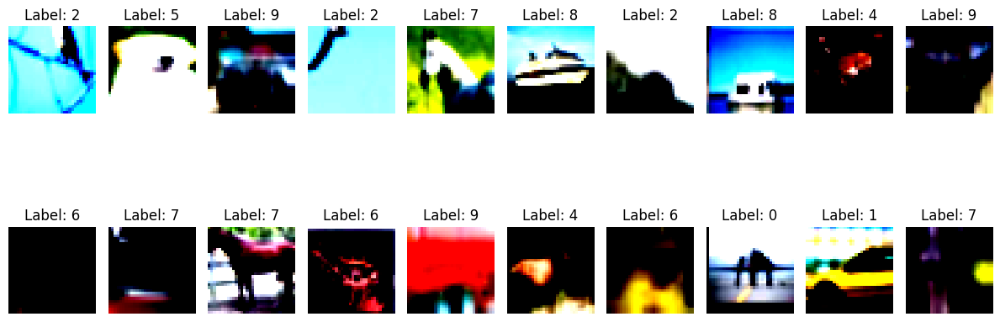

Epoch [9/100], Loss: 0.0215
Epoch [9/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


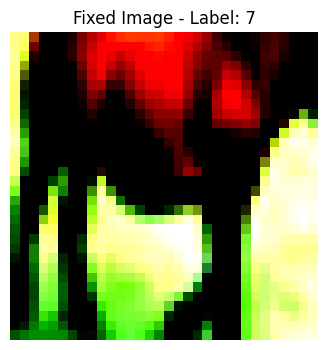

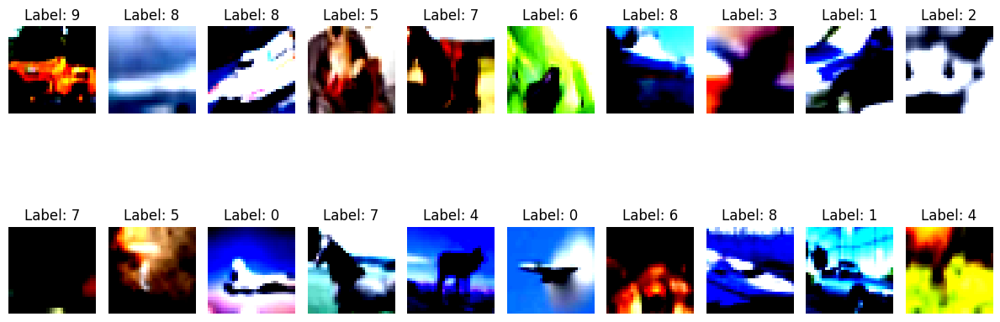

Epoch [10/100], Loss: 0.0212
Epoch [10/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


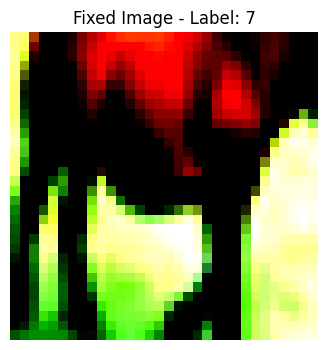

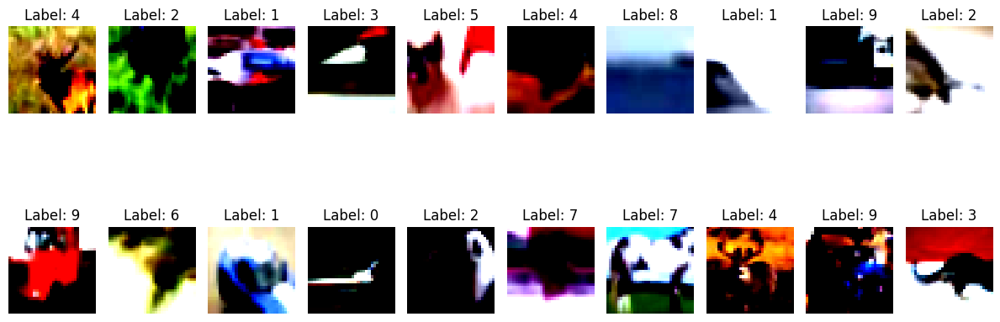

Epoch [11/100], Loss: 0.0210
Epoch [11/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


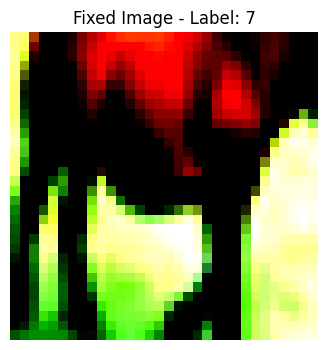

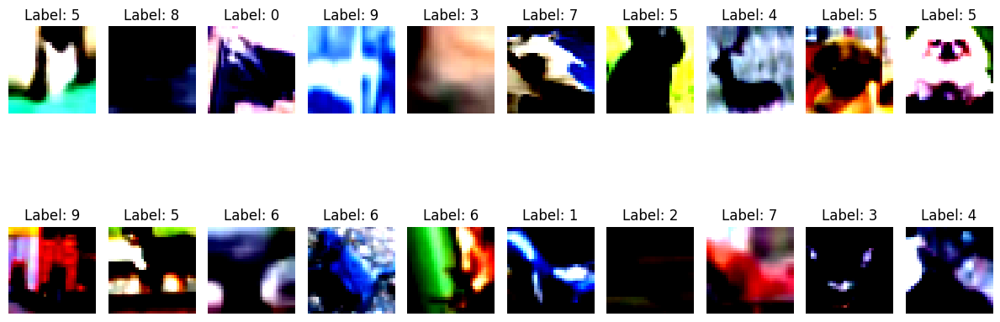

Epoch [12/100], Loss: 0.0207
Epoch [12/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.45it/s]


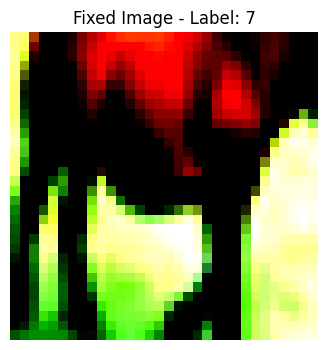

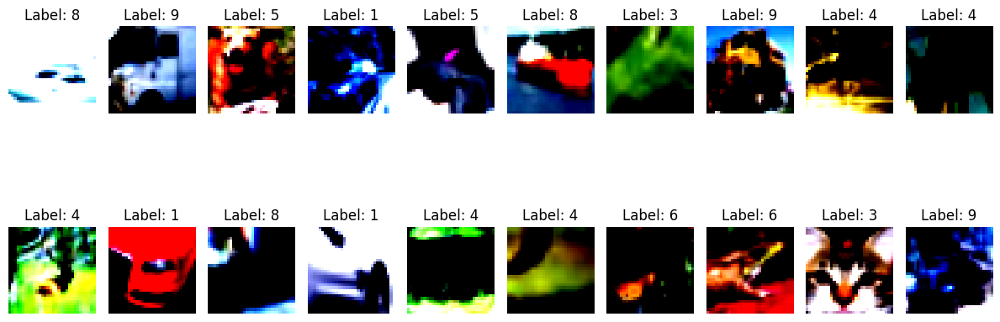

Epoch [13/100], Loss: 0.0205
Epoch [13/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


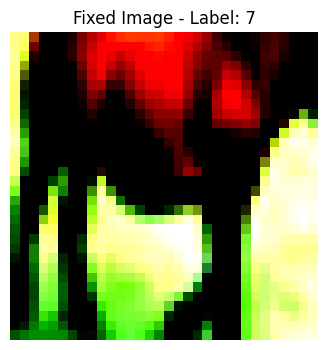

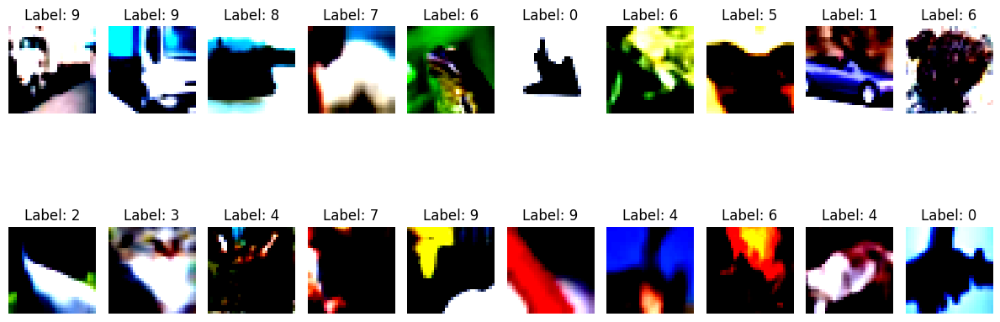

Epoch [14/100], Loss: 0.0204
Epoch [14/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:53<00:00,  7.34it/s]


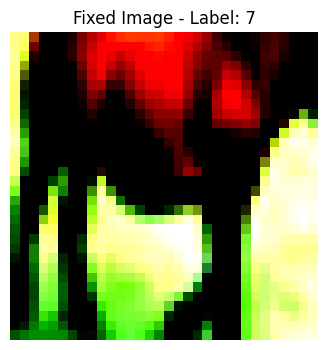

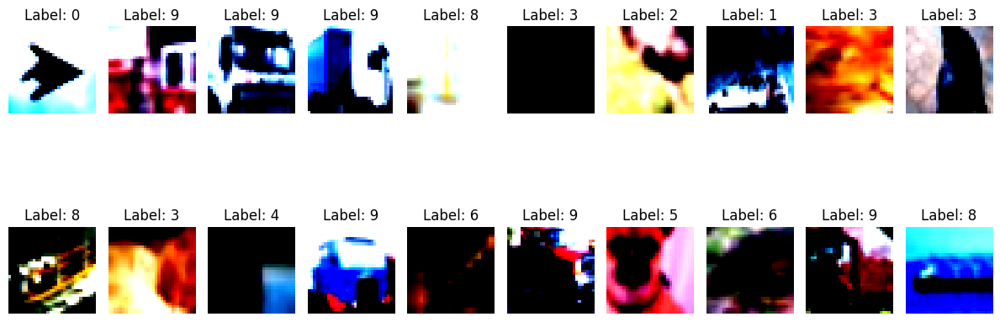

Epoch [15/100], Loss: 0.0202
Epoch [15/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


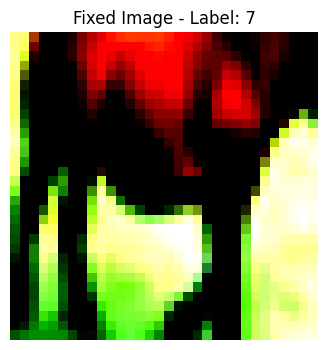

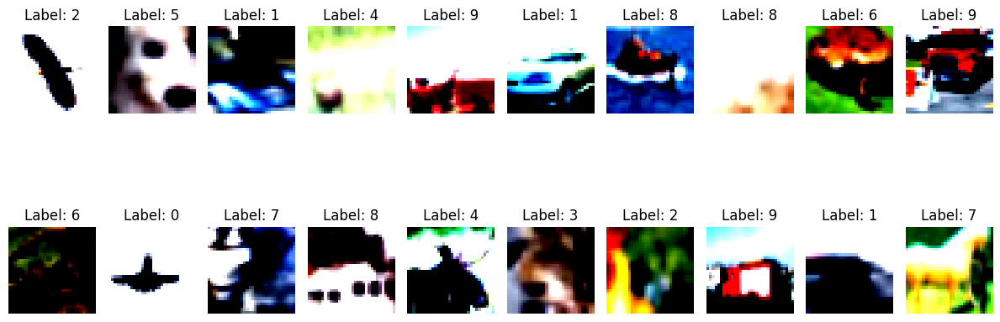

Epoch [16/100], Loss: 0.0200
Epoch [16/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


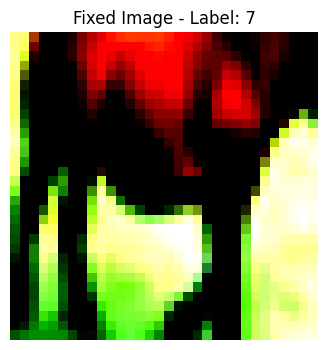

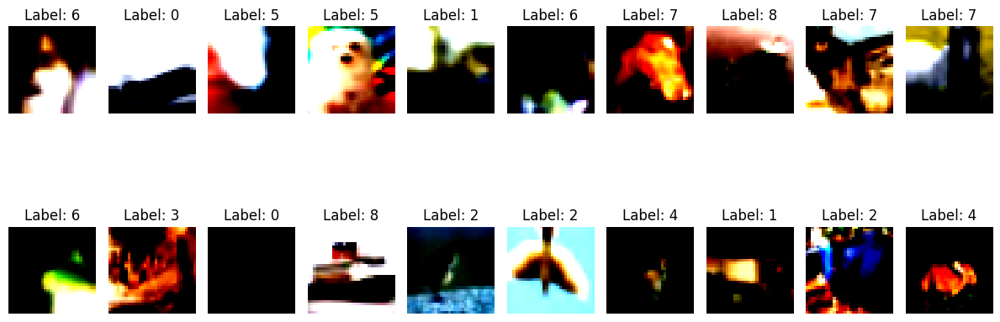

Epoch [17/100], Loss: 0.0199
Epoch [17/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


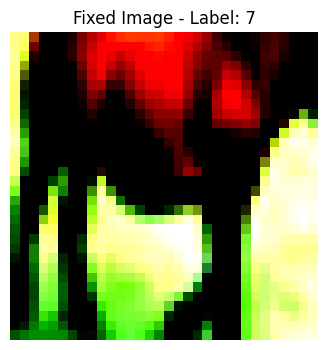

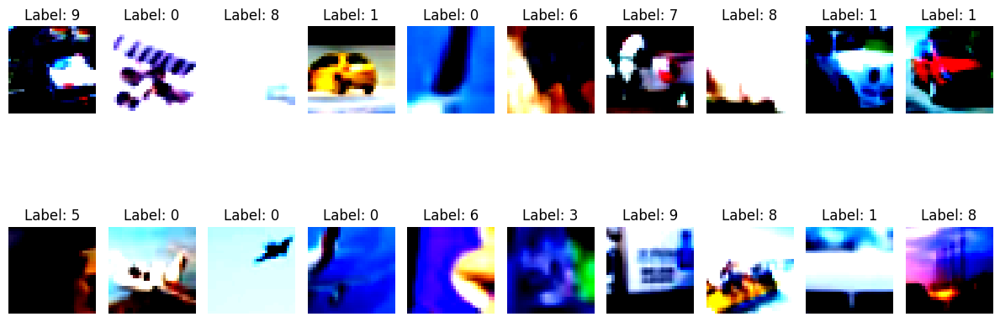

Epoch [18/100], Loss: 0.0197
Epoch [18/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


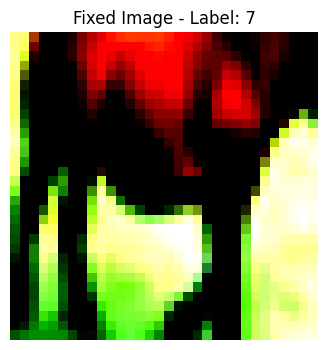

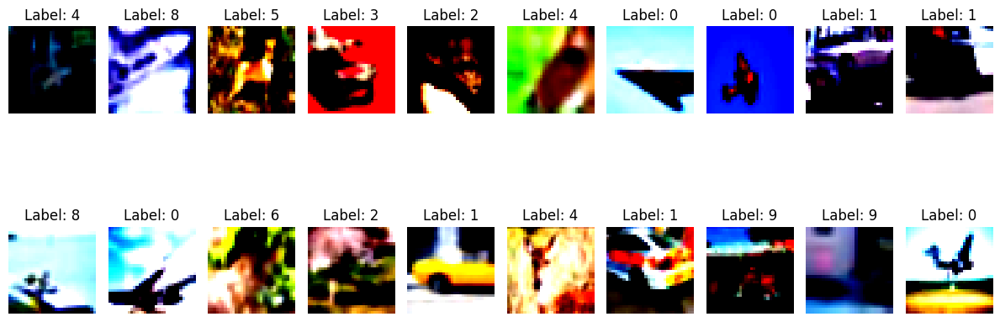

Epoch [19/100], Loss: 0.0196
Epoch [19/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


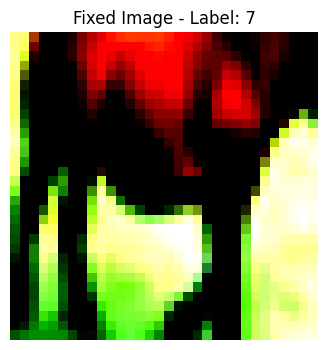

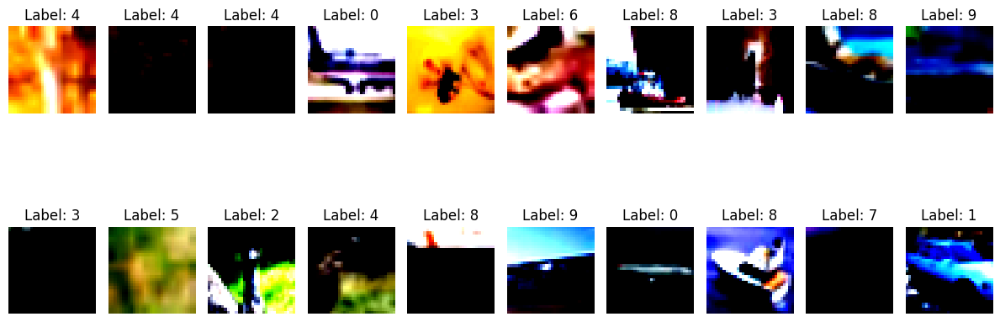

Epoch [20/100], Loss: 0.0195
Epoch [20/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.38it/s]


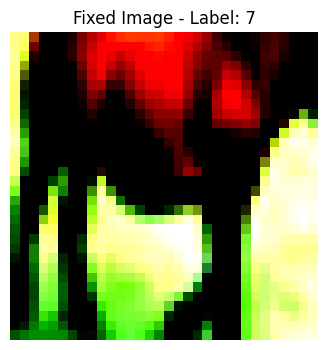

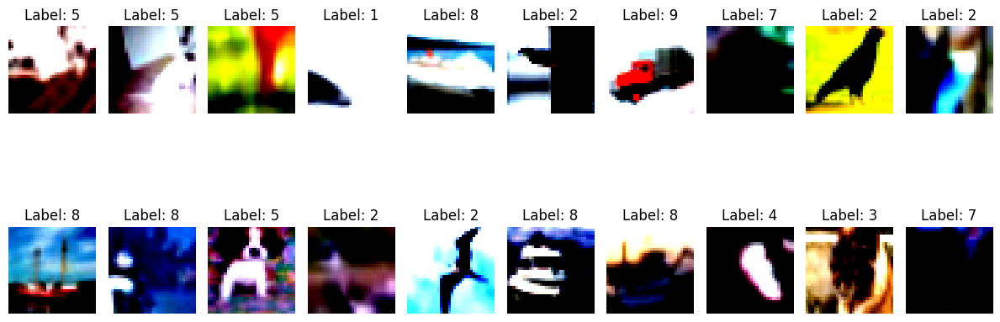

Epoch [21/100], Loss: 0.0194
Epoch [21/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


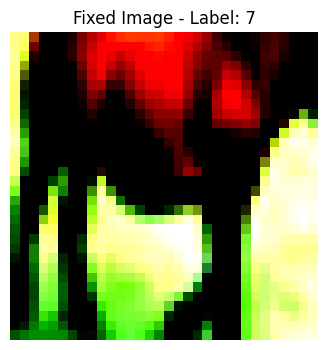

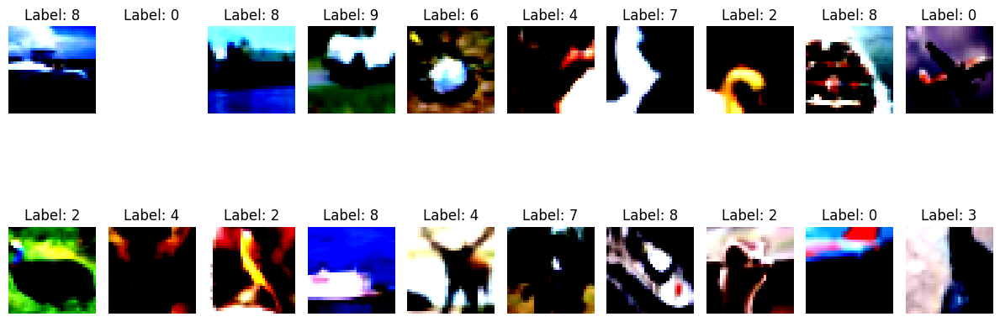

Epoch [22/100], Loss: 0.0193
Epoch [22/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


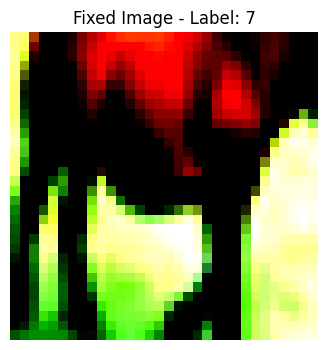

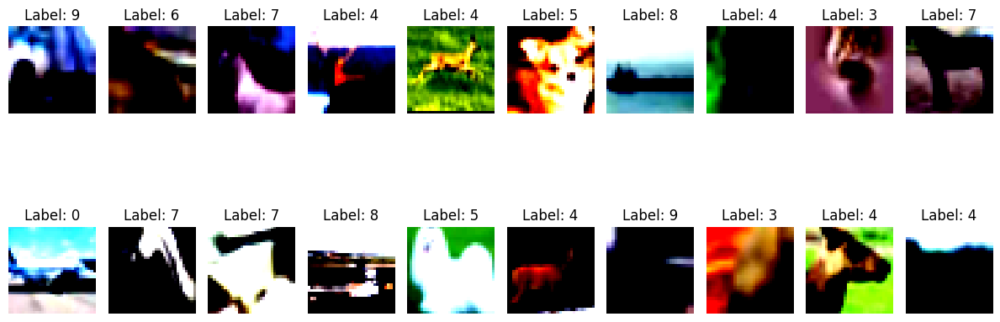

Epoch [23/100], Loss: 0.0192
Epoch [23/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.38it/s]


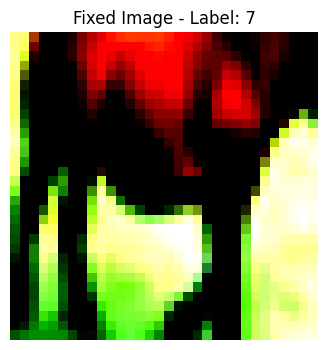

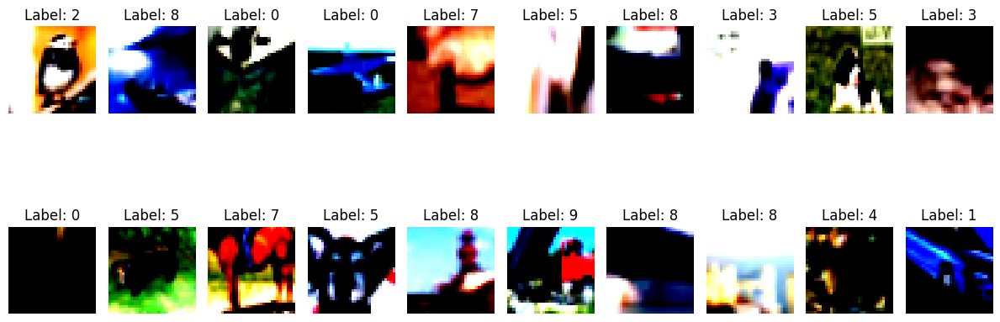

Epoch [24/100], Loss: 0.0191
Epoch [24/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


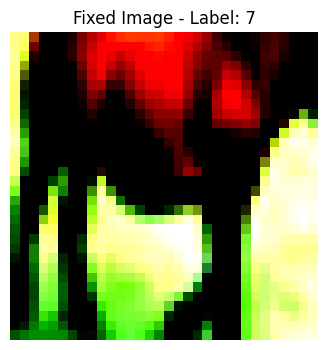

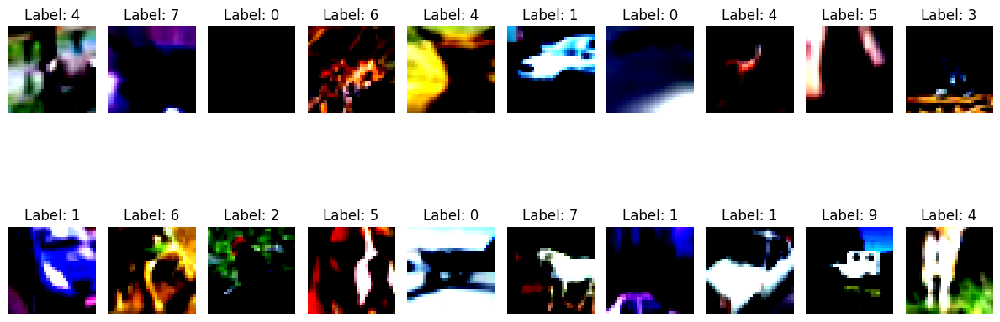

Epoch [25/100], Loss: 0.0190
Epoch [25/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


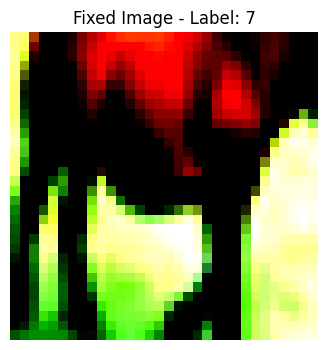

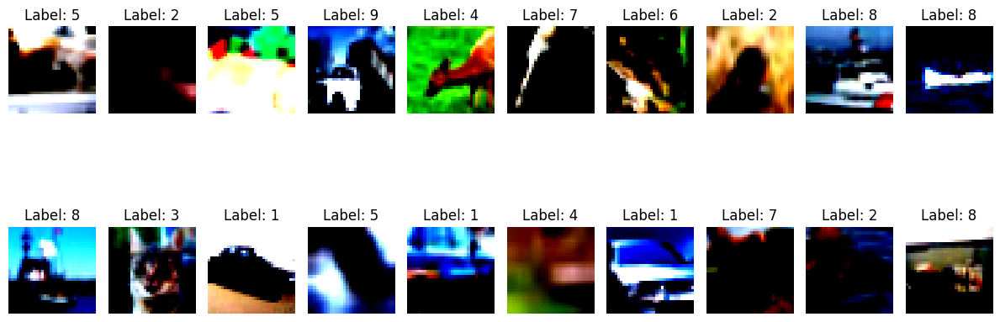

Epoch [26/100], Loss: 0.0189
Epoch [26/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


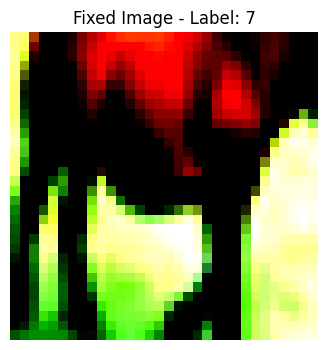

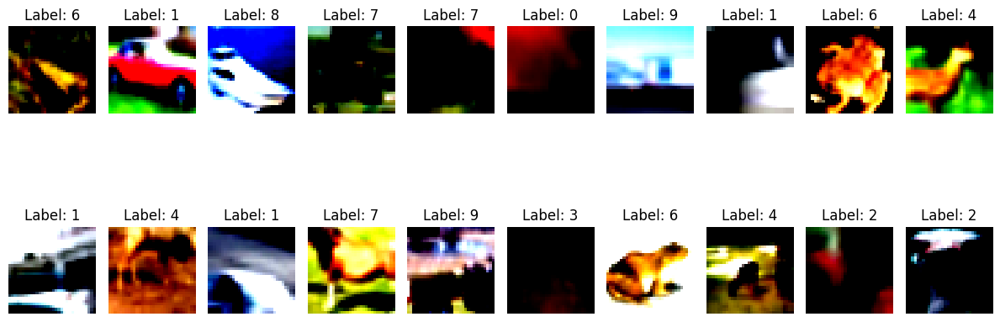

Epoch [27/100], Loss: 0.0188
Epoch [27/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


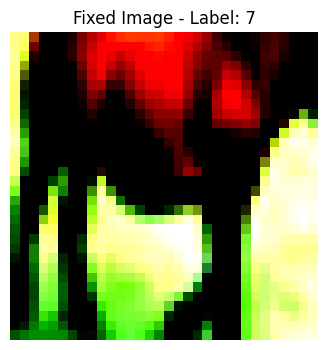

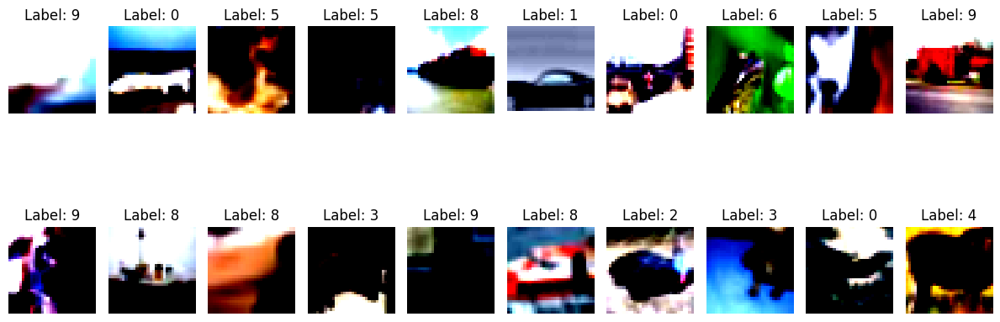

Epoch [28/100], Loss: 0.0188
Epoch [28/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


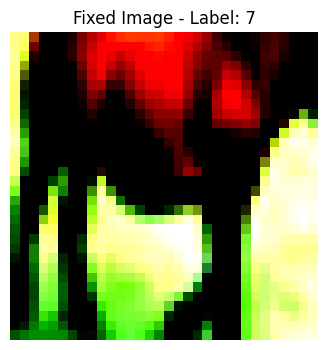

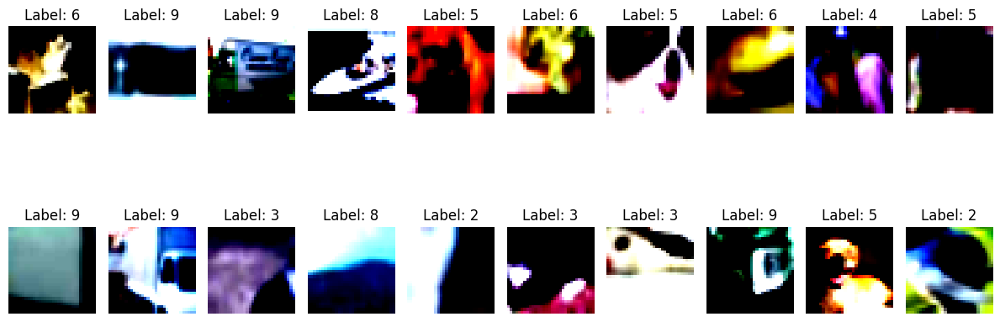

Epoch [29/100], Loss: 0.0187
Epoch [29/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


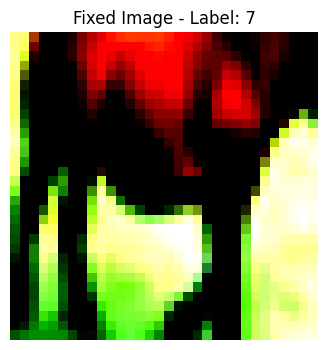

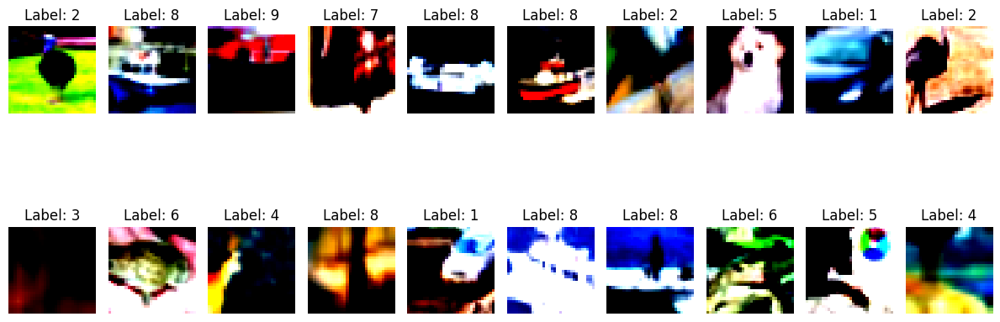

Epoch [30/100], Loss: 0.0186
Epoch [30/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:53<00:00,  7.36it/s]


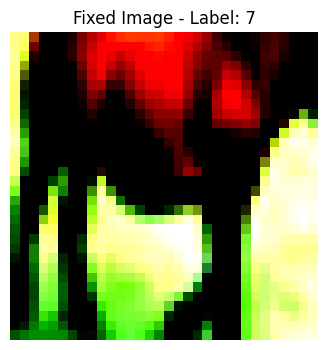

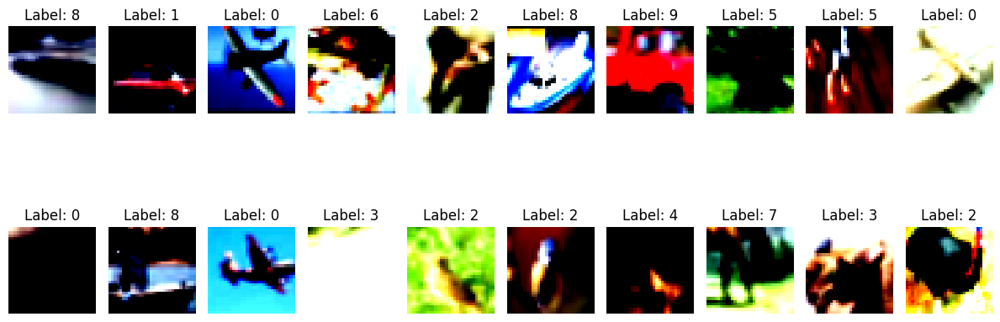

Epoch [31/100], Loss: 0.0186
Epoch [31/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


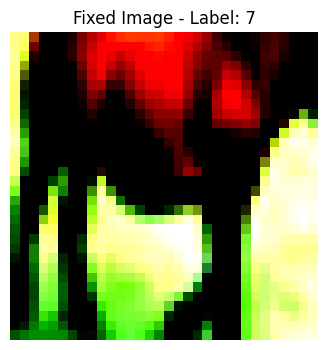

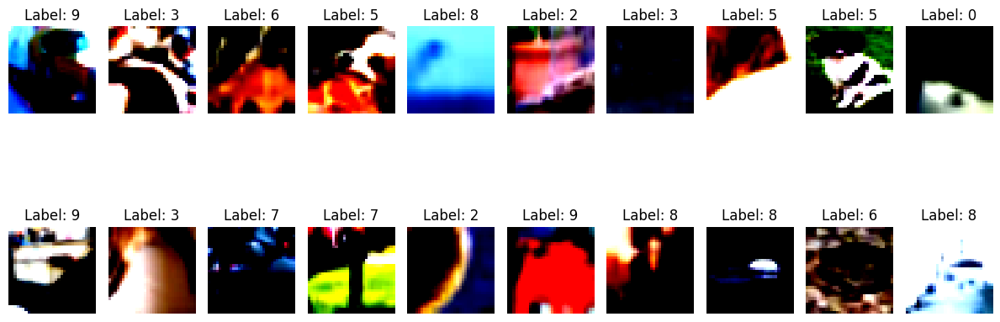

Epoch [32/100], Loss: 0.0185
Epoch [32/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


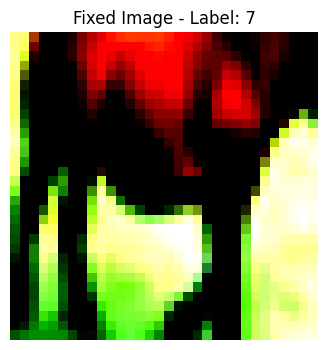

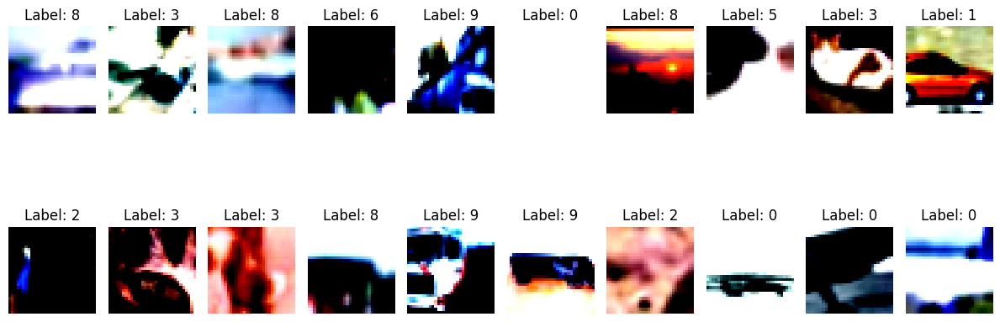

Epoch [33/100], Loss: 0.0184
Epoch [33/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


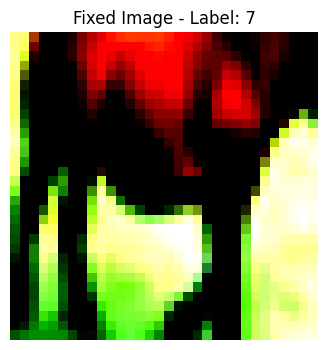

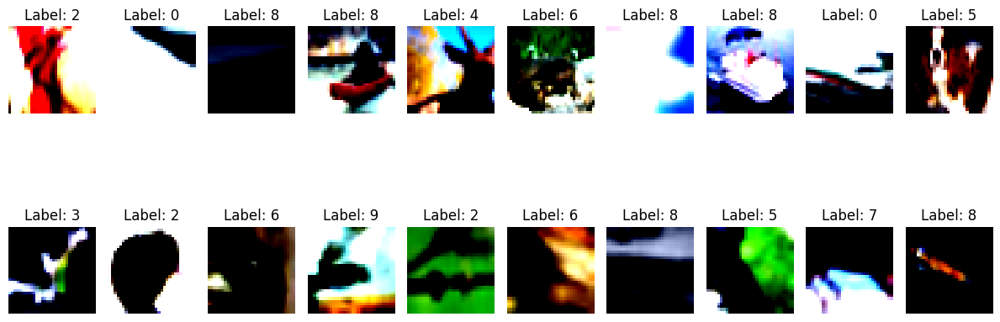

Epoch [34/100], Loss: 0.0184
Epoch [34/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


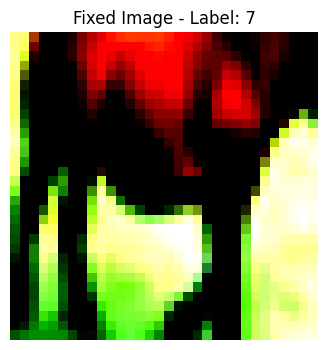

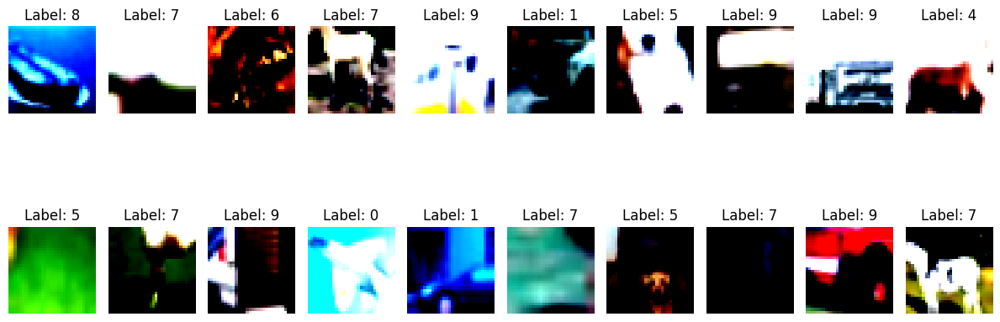

Epoch [35/100], Loss: 0.0183
Epoch [35/100], How simialr?: 6 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


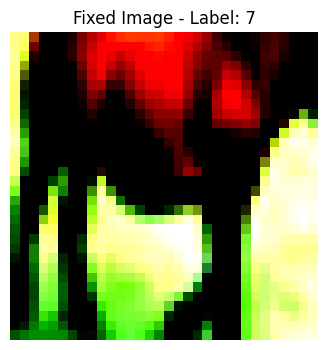

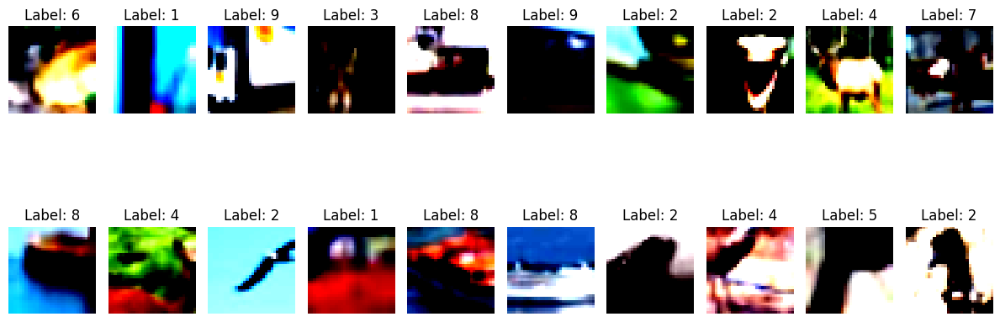

Epoch [36/100], Loss: 0.0183
Epoch [36/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


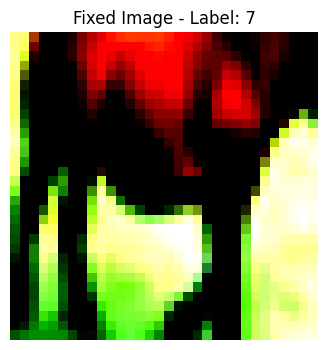

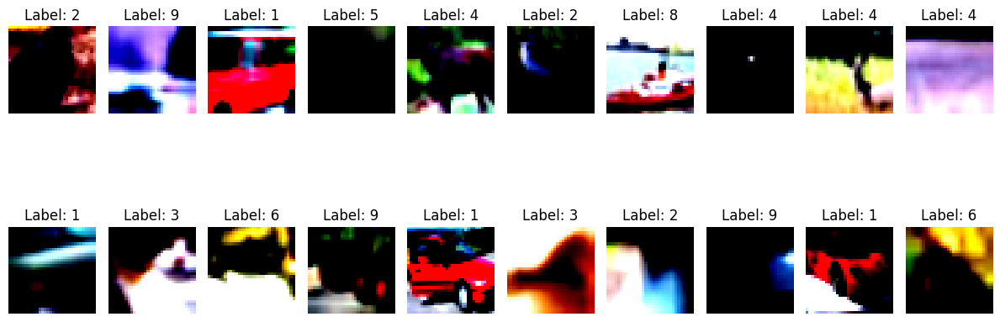

Epoch [37/100], Loss: 0.0182
Epoch [37/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


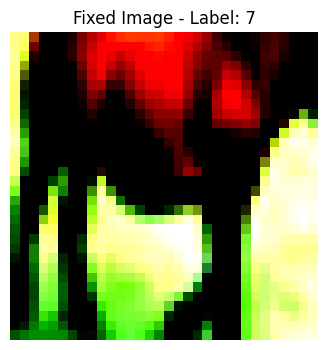

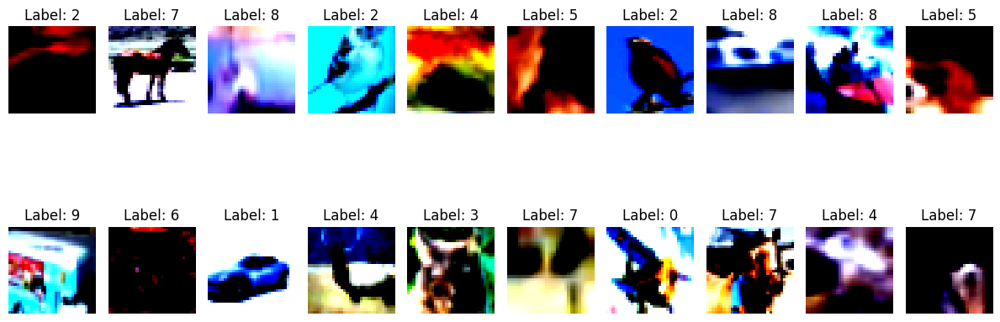

Epoch [38/100], Loss: 0.0182
Epoch [38/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


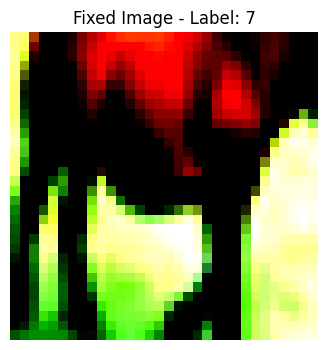

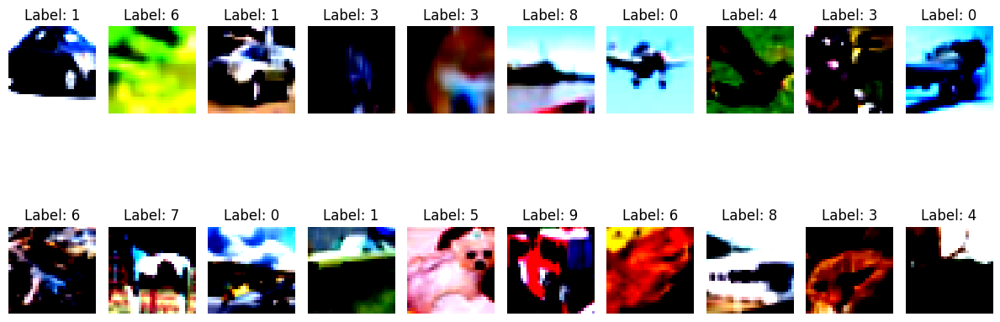

Epoch [39/100], Loss: 0.0181
Epoch [39/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


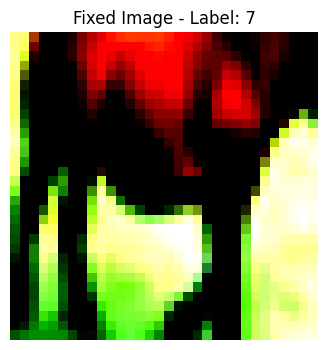

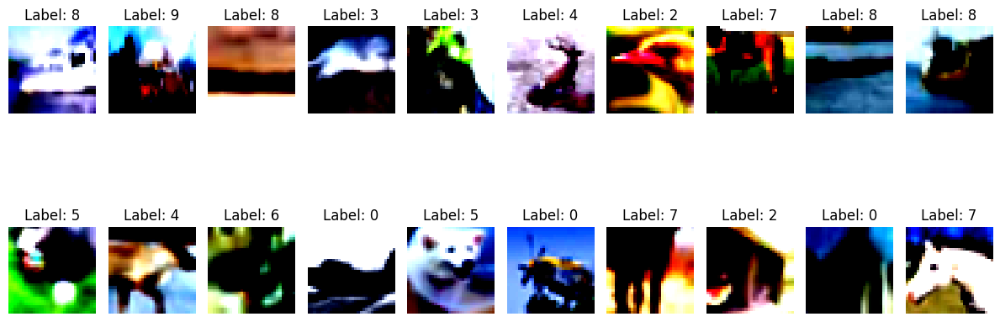

Epoch [40/100], Loss: 0.0181
Epoch [40/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.38it/s]


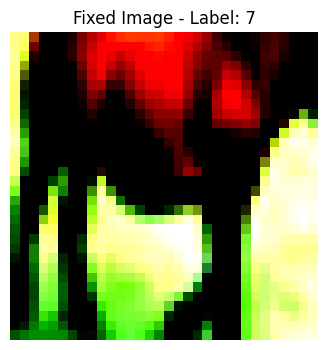

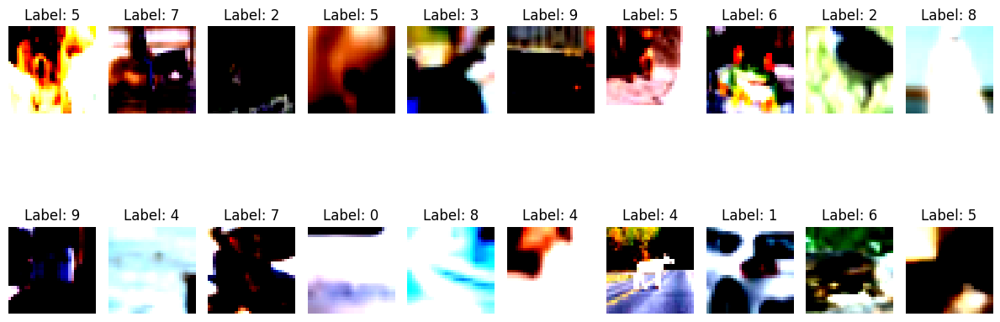

Epoch [41/100], Loss: 0.0181
Epoch [41/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


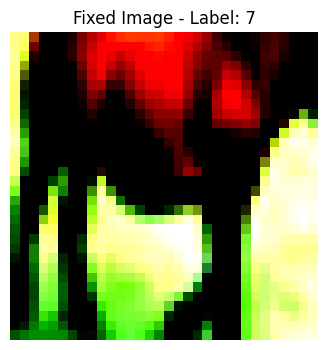

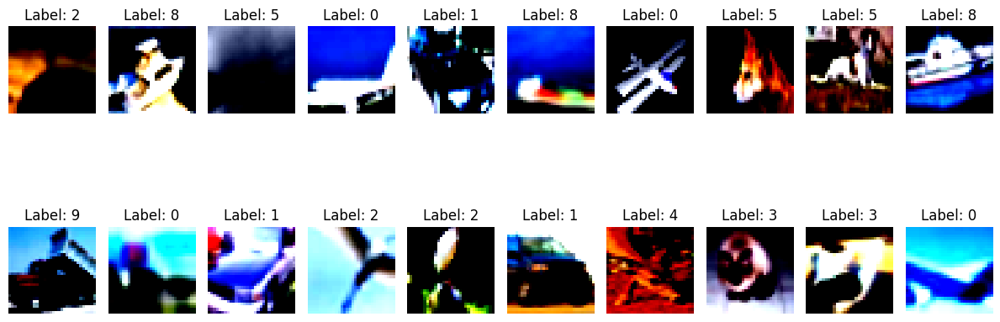

Epoch [42/100], Loss: 0.0180
Epoch [42/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


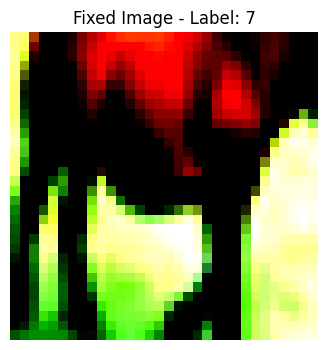

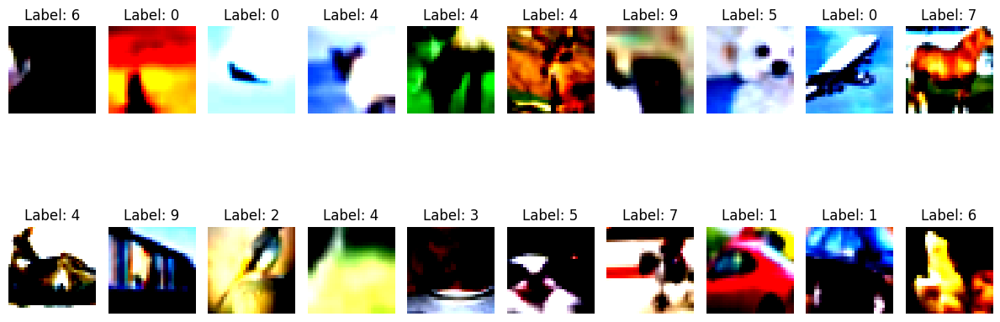

Epoch [43/100], Loss: 0.0180
Epoch [43/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


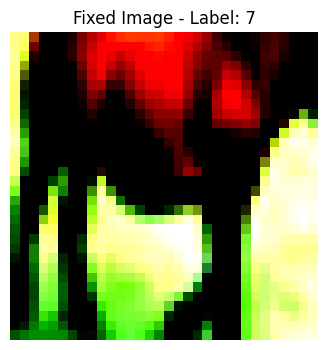

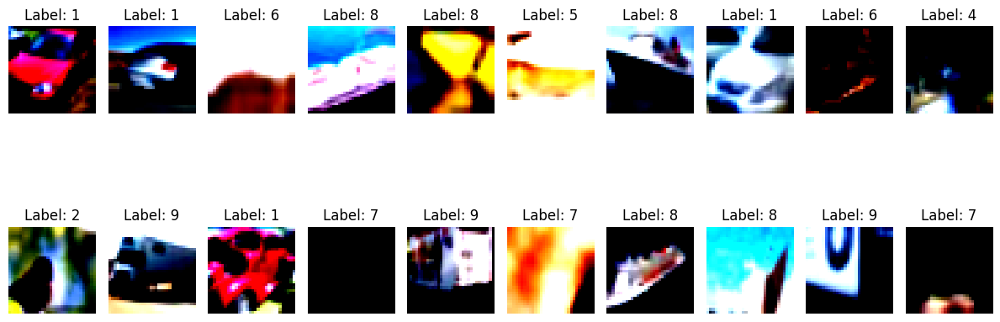

Epoch [44/100], Loss: 0.0179
Epoch [44/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


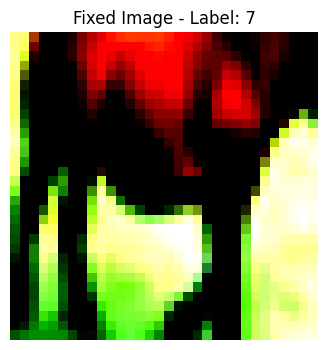

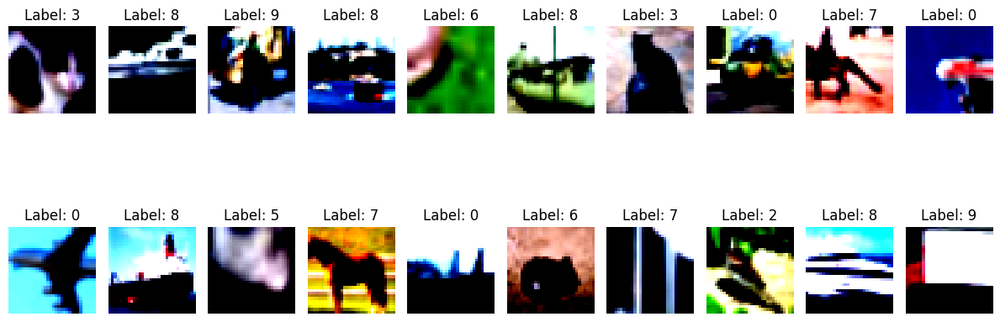

Epoch [45/100], Loss: 0.0179
Epoch [45/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


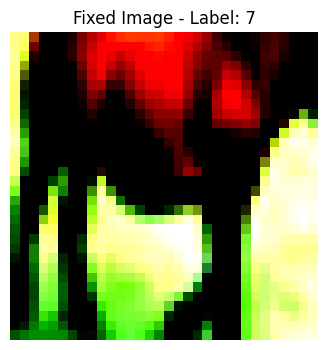

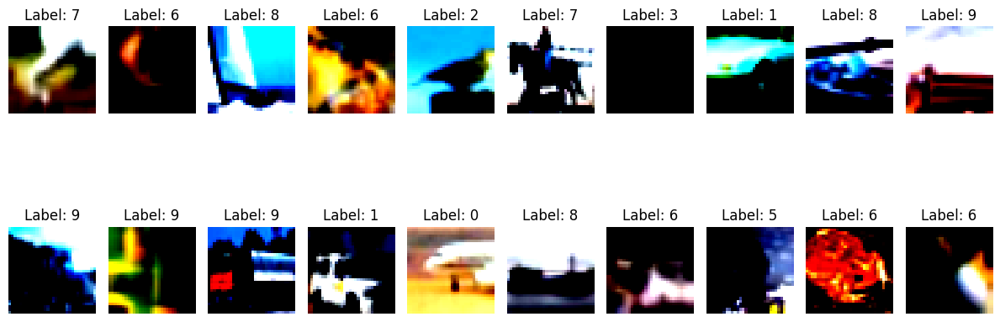

Epoch [46/100], Loss: 0.0179
Epoch [46/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


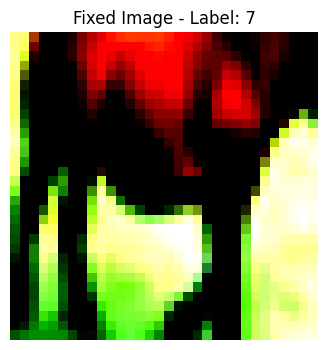

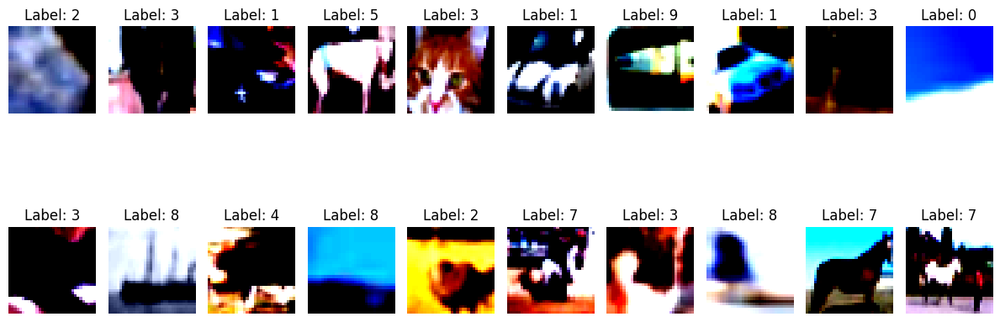

Epoch [47/100], Loss: 0.0179
Epoch [47/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


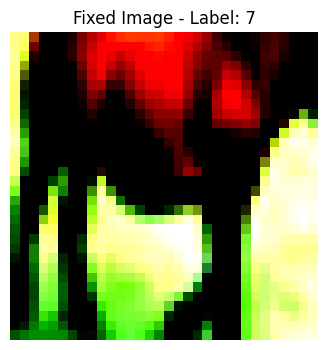

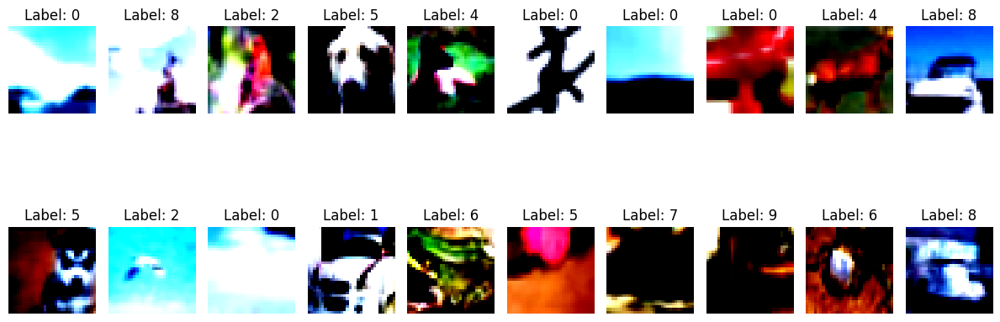

Epoch [48/100], Loss: 0.0178
Epoch [48/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


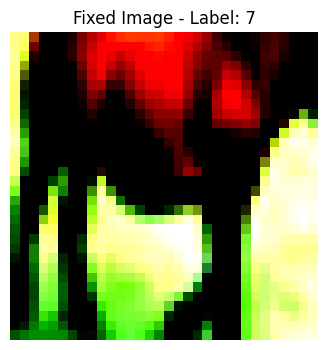

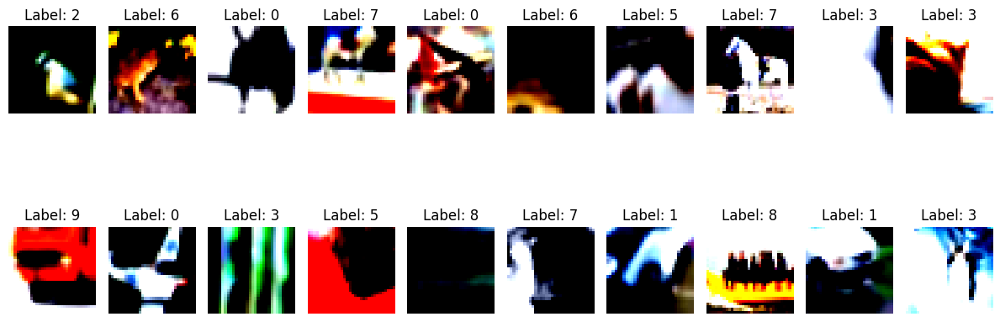

Epoch [49/100], Loss: 0.0178
Epoch [49/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


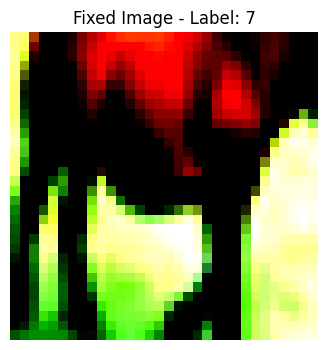

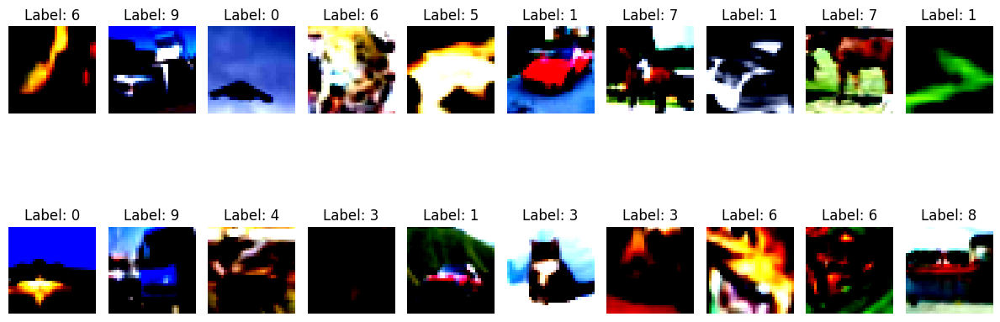

Epoch [50/100], Loss: 0.0177
Epoch [50/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


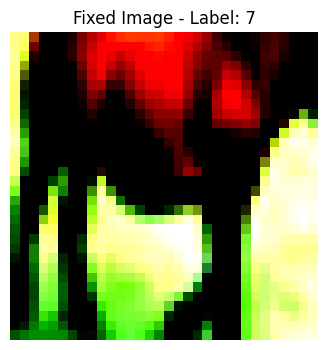

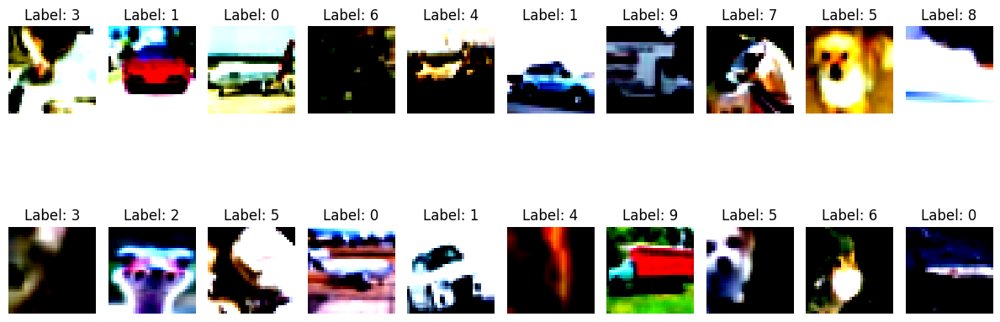

Epoch [51/100], Loss: 0.0177
Epoch [51/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


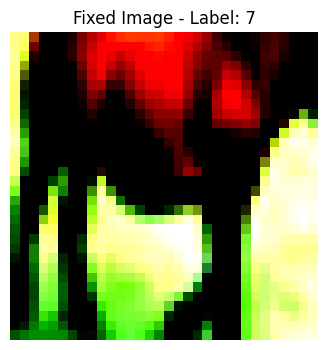

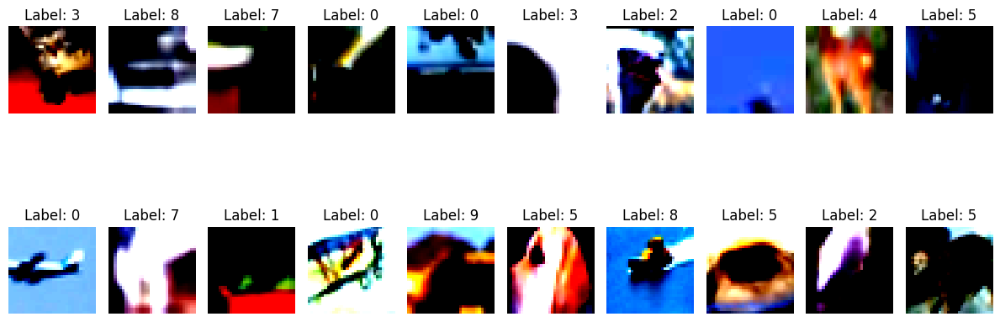

Epoch [52/100], Loss: 0.0177
Epoch [52/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


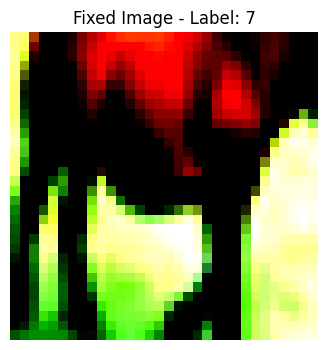

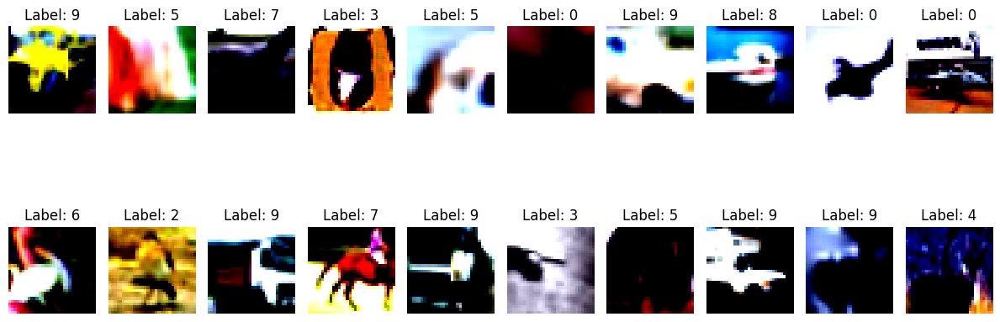

Epoch [53/100], Loss: 0.0177
Epoch [53/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


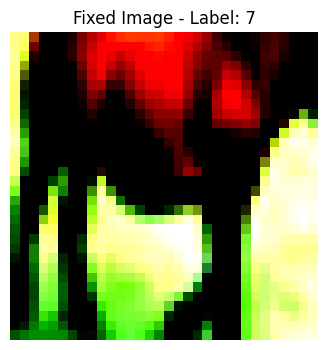

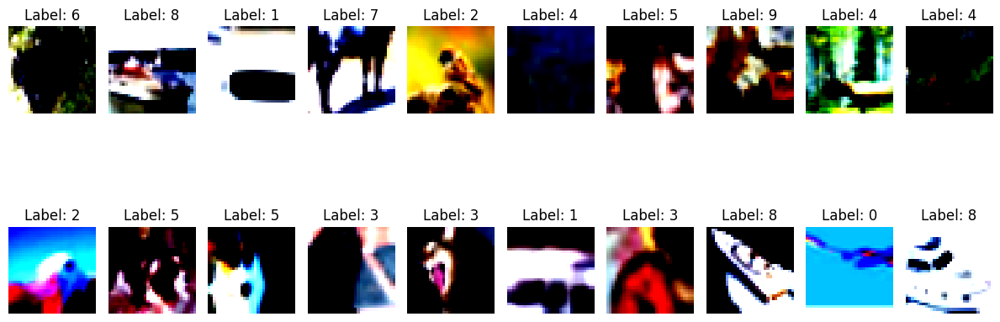

Epoch [54/100], Loss: 0.0177
Epoch [54/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


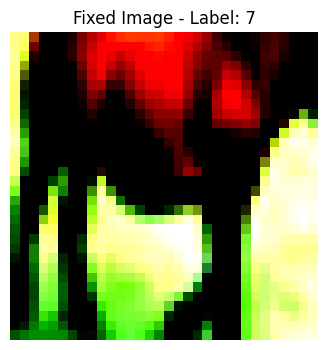

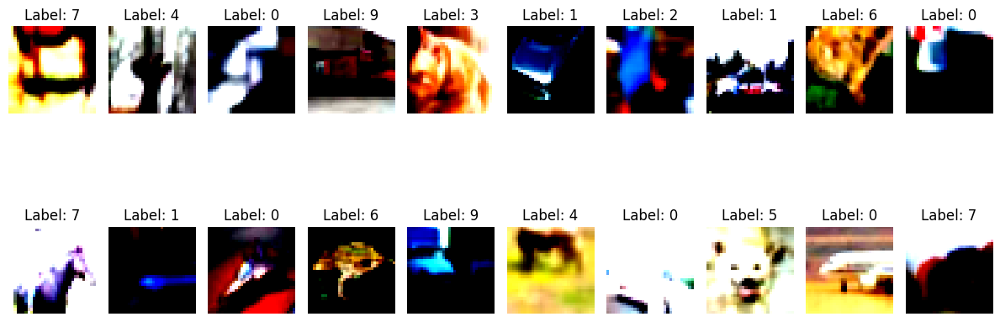

Epoch [55/100], Loss: 0.0177
Epoch [55/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


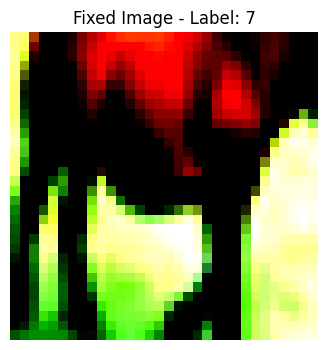

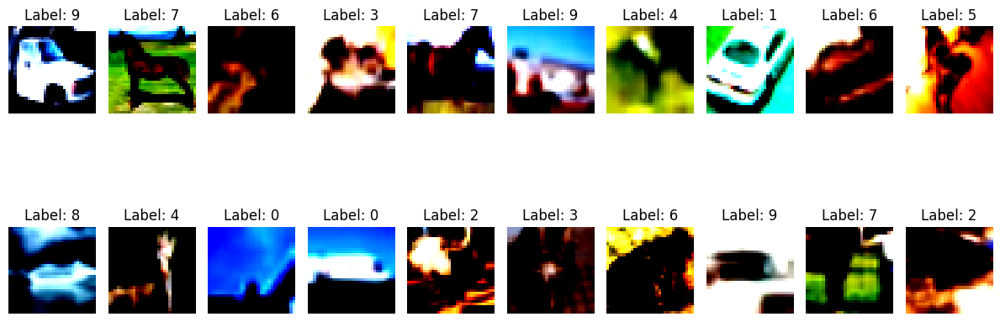

Epoch [56/100], Loss: 0.0176
Epoch [56/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.46it/s]


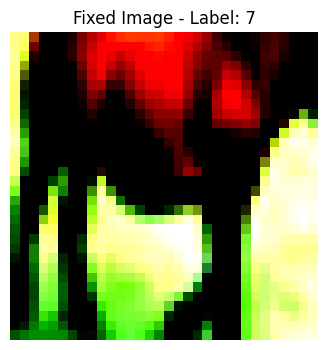

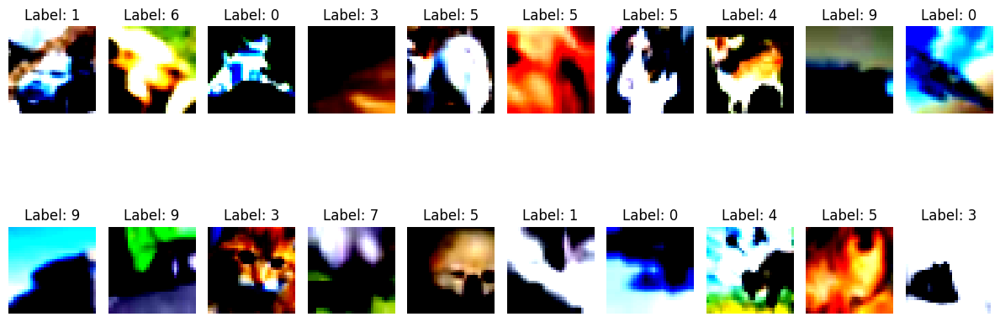

Epoch [57/100], Loss: 0.0176
Epoch [57/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.47it/s]


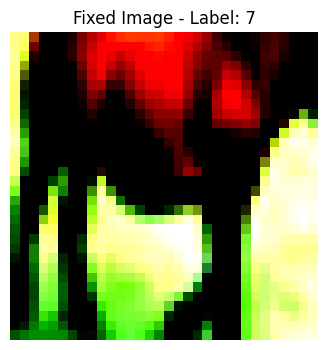

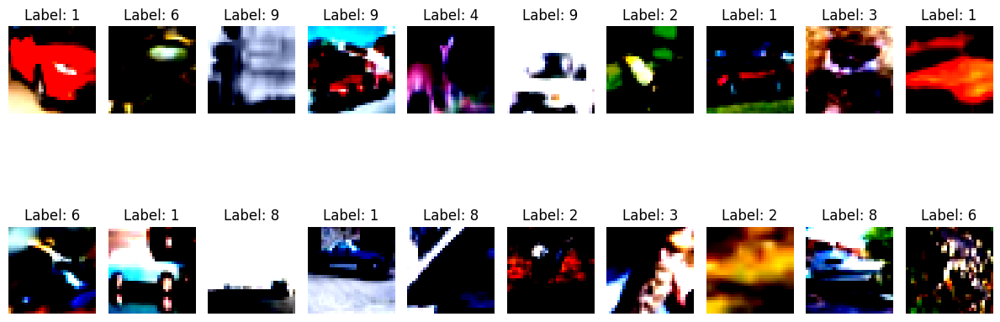

Epoch [58/100], Loss: 0.0175
Epoch [58/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


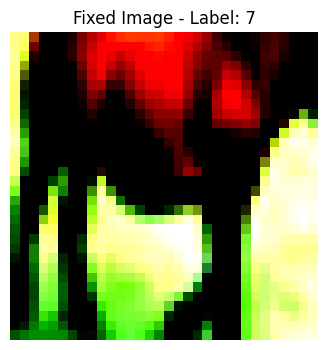

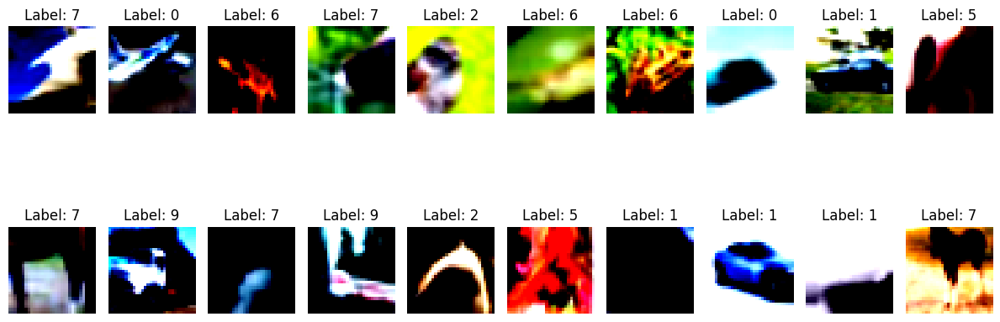

Epoch [59/100], Loss: 0.0175
Epoch [59/100], How simialr?: 5 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


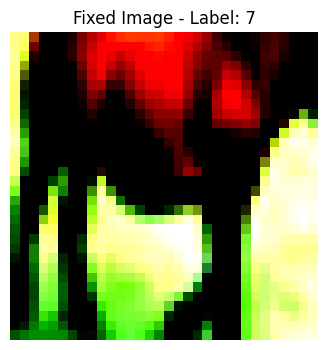

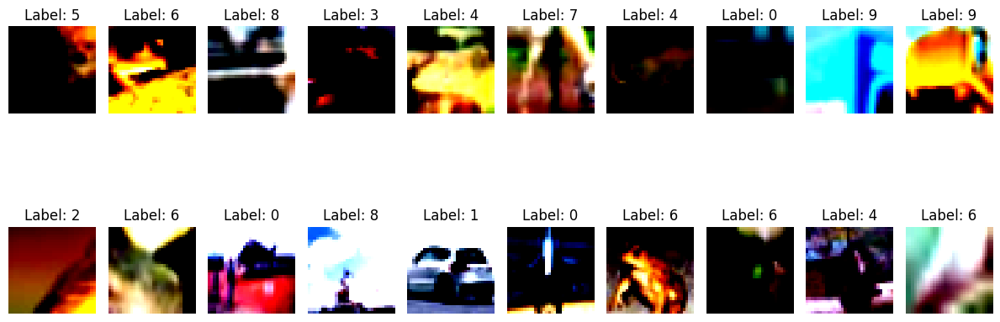

Epoch [60/100], Loss: 0.0175
Epoch [60/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


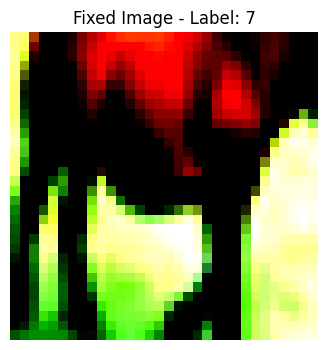

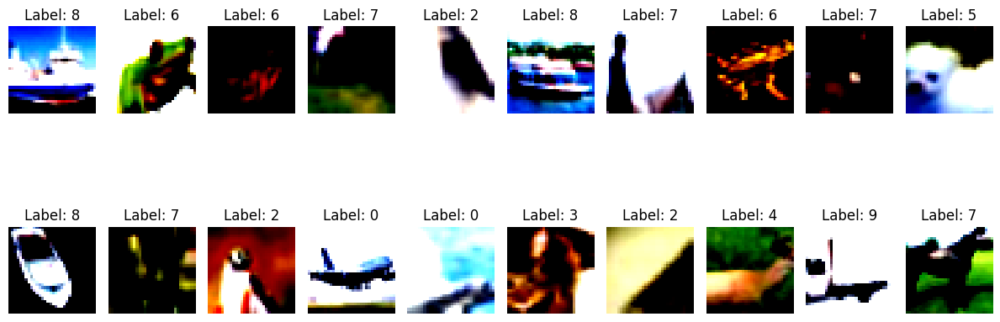

Epoch [61/100], Loss: 0.0175
Epoch [61/100], How simialr?: 5 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


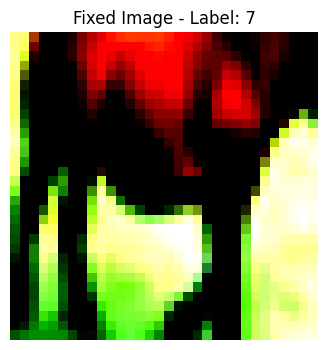

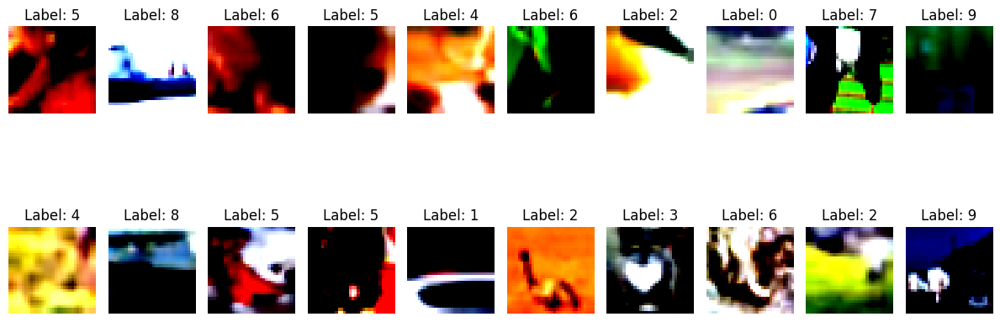

Epoch [62/100], Loss: 0.0175
Epoch [62/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.45it/s]


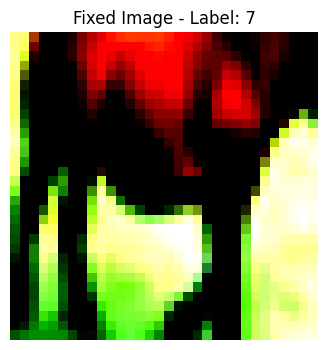

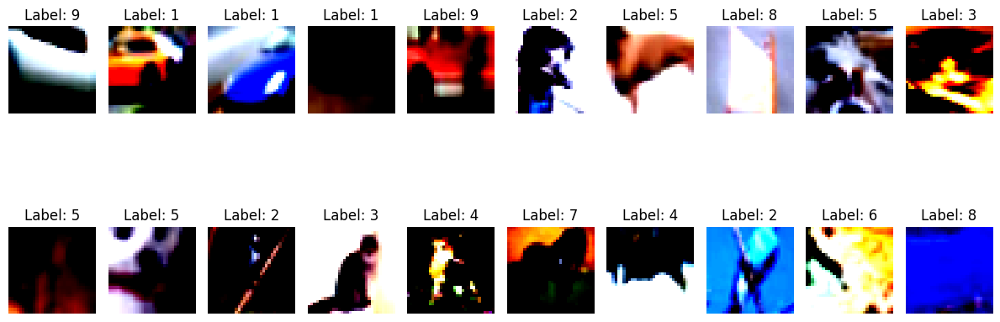

Epoch [63/100], Loss: 0.0174
Epoch [63/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.46it/s]


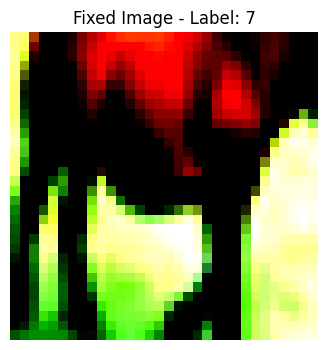

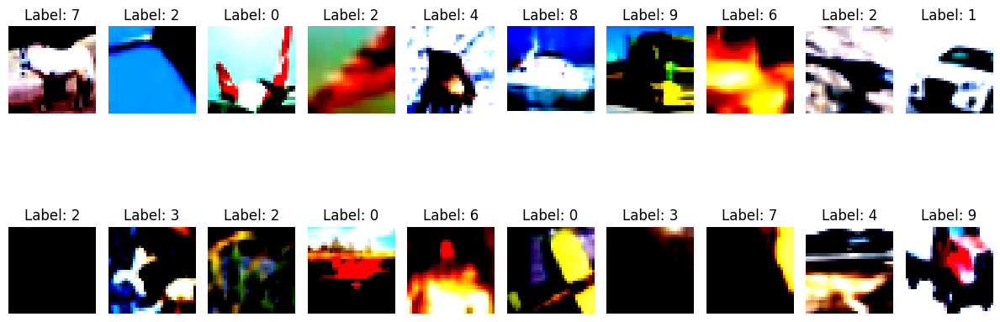

Epoch [64/100], Loss: 0.0175
Epoch [64/100], How simialr?: 2 out of 20


 84%|████████▎ | 327/391 [00:44<00:08,  7.42it/s]


KeyboardInterrupt: 

In [6]:
# Variable to hold the closest indices for the third image
closest_indices = None

# Training loop
for epoch in range(num_epochs):
    total_loss = 0
    all_embeddings = []
    all_labels = []
    all_images = []  
    
    for images, labels in tqdm(train_loader):
        # Get two augmented views of the same image
        img1, img2 = images.to(device), images.to(device)

        # Forward pass
        z1, p1 = model(img1)
        z2, p2 = model(img2)

        # Compute the loss
        loss = nt_xent_loss(p1, p2, temperature)

        # Backpropagation and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        all_embeddings.append(z1)
        all_labels.append(labels)
        all_images.append(img1)

    # Concatenate all embeddings, labels, and images to make access to specific indices easier ( for visualization)
    embeddings = torch.cat(all_embeddings, dim=0)
    labels = torch.cat(all_labels, dim=0)
    images = torch.cat(all_images, dim=0)

    # Compute the embedding of the fixed image in evaluation mode
    model.eval()
    with torch.no_grad():
        fixed_embedding, _ = model(fixed_image)
        fixed_embedding = fixed_embedding.squeeze(0)
    model.train()

    if epoch == 0:
        similarities = F.cosine_similarity(fixed_embedding.unsqueeze(0), embeddings, dim=1)
        _, closest_indices = torch.topk(similarities, k=21, largest=True)
        closest_indices = closest_indices[1:]  # Remove the first index, which is the fixed image itself

    writer.add_scalar('Loss', total_loss / len(train_loader), epoch)

    # Visualize the fixed image
    with torch.no_grad():
        fixed_image_np = fixed_image.squeeze(0).cpu().numpy()

        plt.figure(figsize=(4, 4))
        plt.imshow(np.transpose(fixed_image_np, (1, 2, 0)))
        plt.title(f"Fixed Image - Label: {fixed_label}")
        plt.axis('off')
        plt.show()

    # Visualize the 10 closest images to the fixed image
    with torch.no_grad():
        plt.figure(figsize=(12, 6))
        how_many=0

        # Plot the 10 closest images and their labels in two rows
        for i, idx in enumerate(closest_indices[:5]):
            image = images[idx].cpu().numpy()
            label = labels[idx].item()
            if label == 7:
                how_many+=1
            plt.subplot(2, 10, i + 1)
            plt.imshow(np.transpose(image, (1, 2, 0)))
            plt.title(f"Label: {label}")
            plt.axis('off')
            
        for i, idx in enumerate(closest_indices[5:]):
            image = images[idx].cpu().numpy()
            label = labels[idx].item()
            if label == 7:
                how_many+=1

            plt.subplot(2, 10, i + 6)
            plt.imshow(np.transpose(image, (1, 2, 0)))
            plt.title(f"Label: {label}")
            plt.axis('off')

        plt.tight_layout()
        plt.show()

    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {total_loss / len(train_loader):.4f}')
    print(f'Epoch [{epoch + 1}/{num_epochs}], How simialr?: {how_many} out of 20')

writer.close()


Lr scheduling

Files already downloaded and verified


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


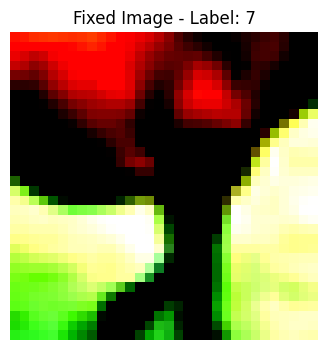

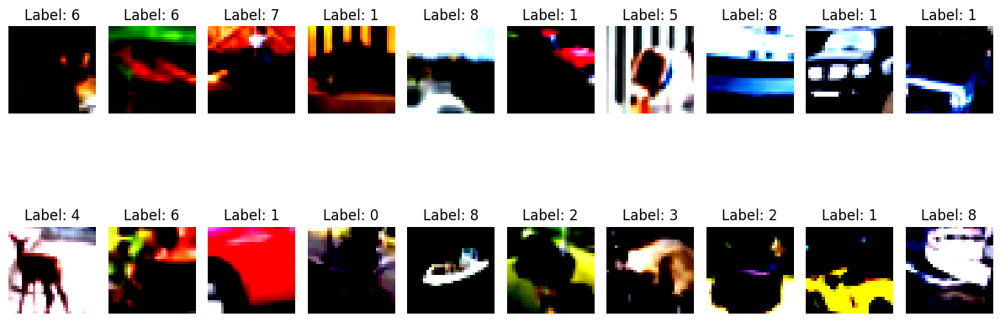

Epoch [1/100], Loss: 1.2887
Epoch [1/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


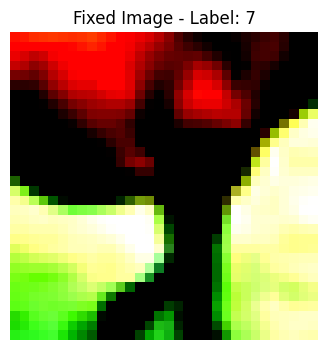

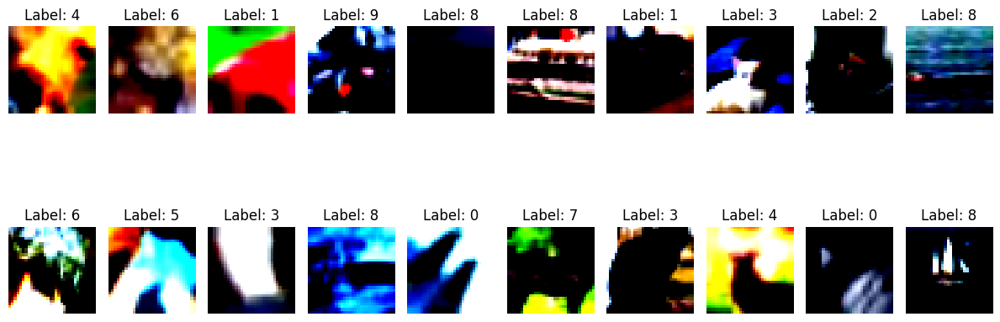

Epoch [2/100], Loss: 0.7291
Epoch [2/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.45it/s]


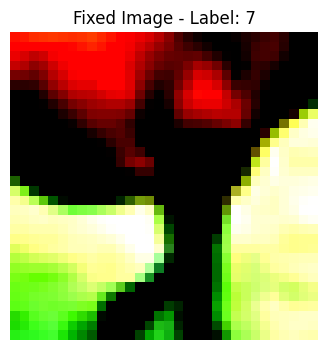

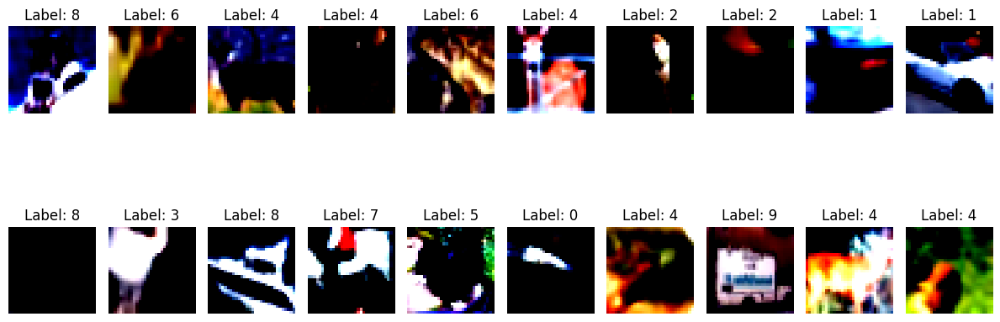

Epoch [3/100], Loss: 0.4051
Epoch [3/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


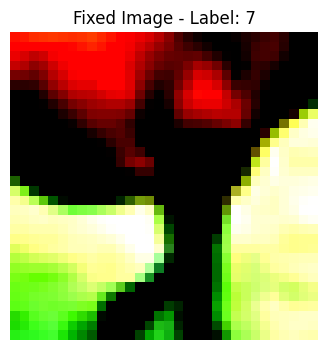

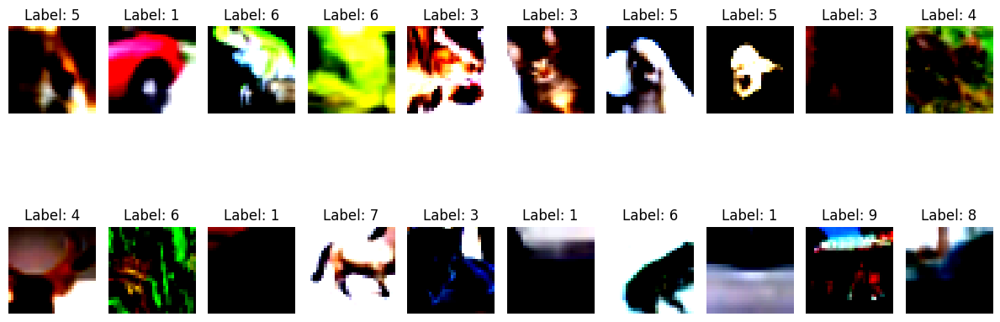

Epoch [4/100], Loss: 0.2298
Epoch [4/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


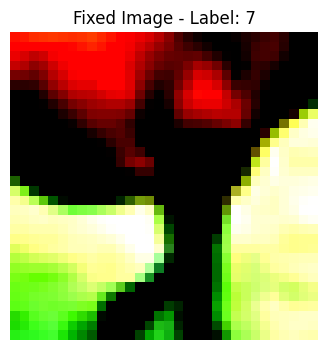

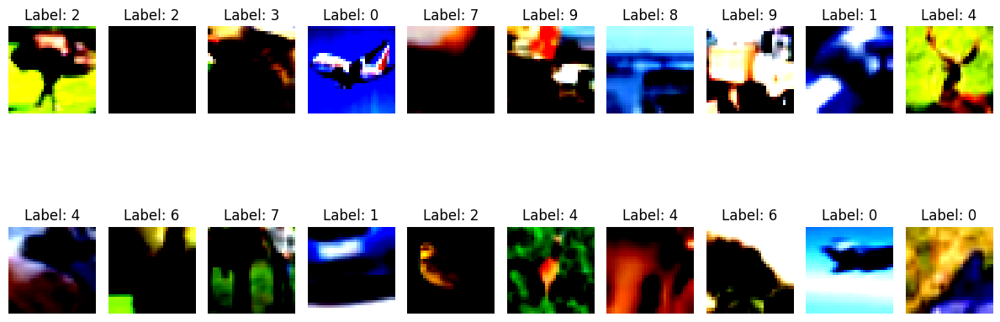

Epoch [5/100], Loss: 0.1403
Epoch [5/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


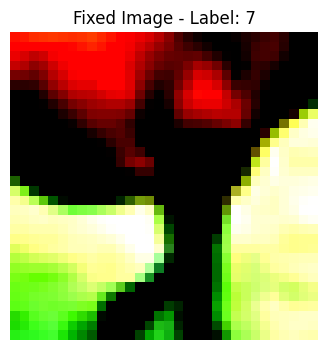

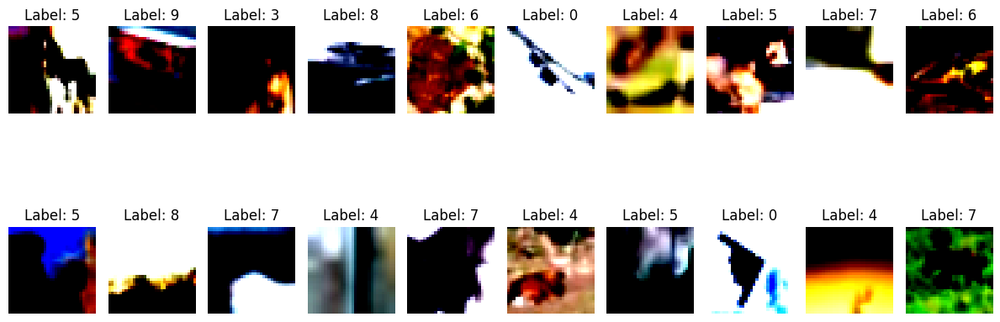

Epoch [6/100], Loss: 0.0950
Epoch [6/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


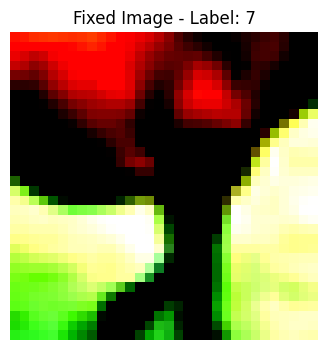

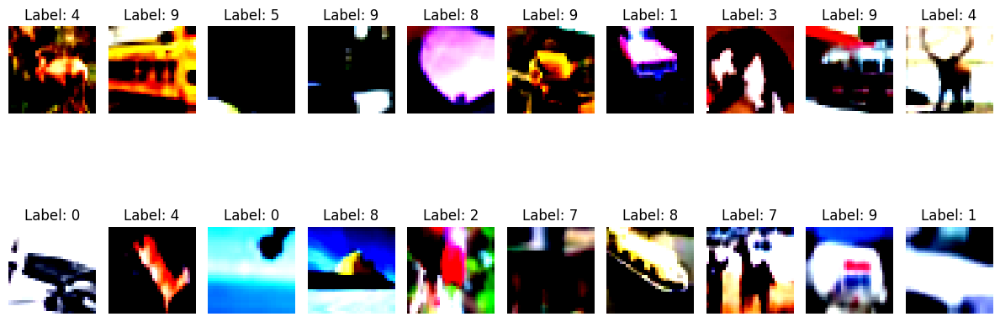

Epoch [7/100], Loss: 0.0710
Epoch [7/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.38it/s]


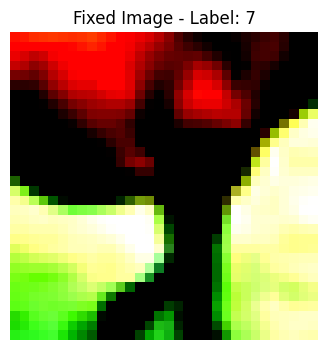

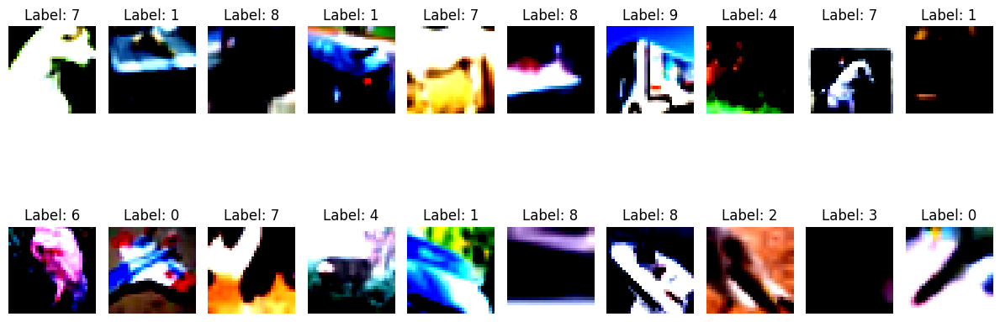

Epoch [8/100], Loss: 0.0567
Epoch [8/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


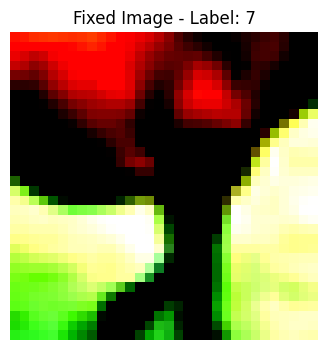

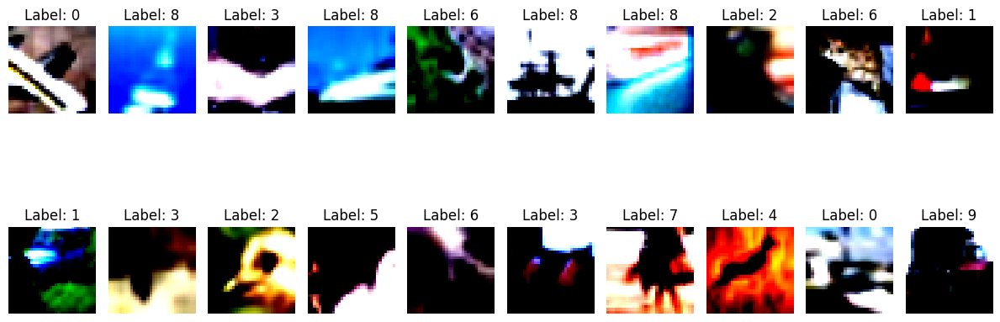

Epoch [9/100], Loss: 0.0476
Epoch [9/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


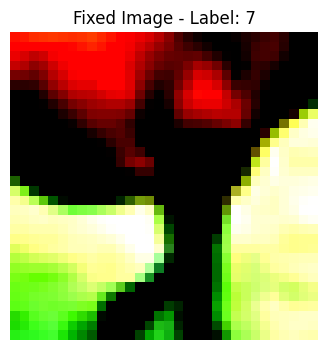

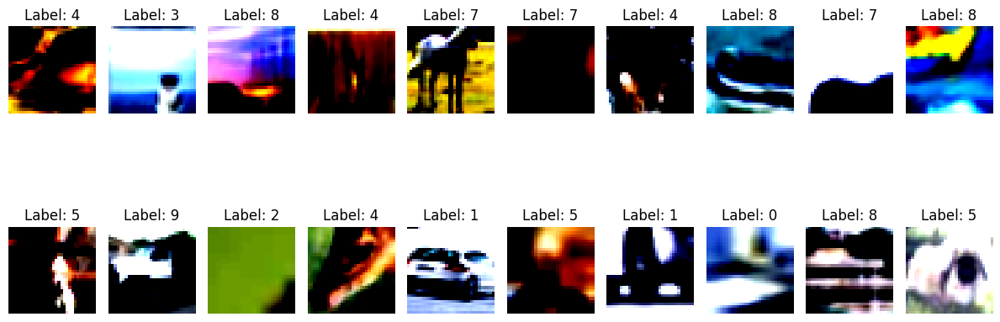

Epoch [10/100], Loss: 0.0411
Epoch [10/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


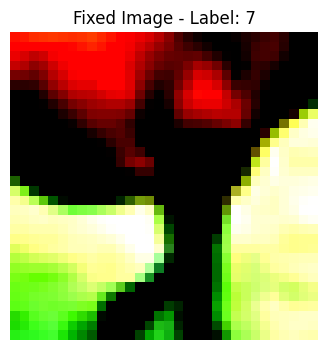

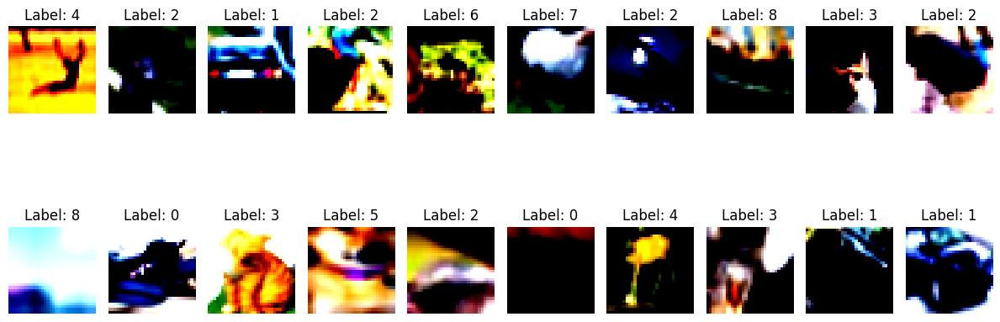

Epoch [11/100], Loss: 0.0366
Epoch [11/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


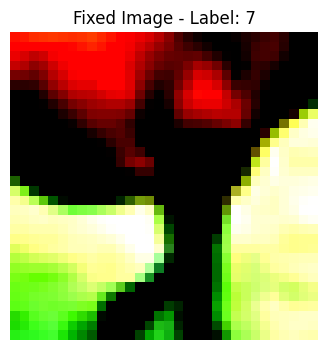

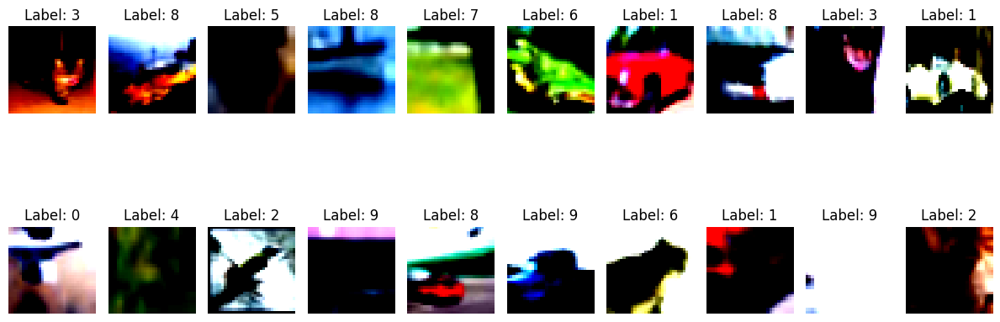

Epoch [12/100], Loss: 0.0333
Epoch [12/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


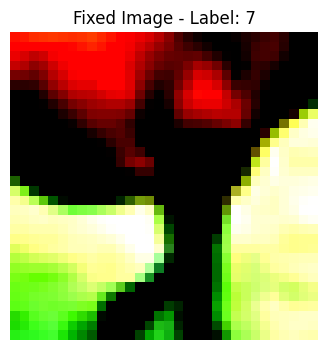

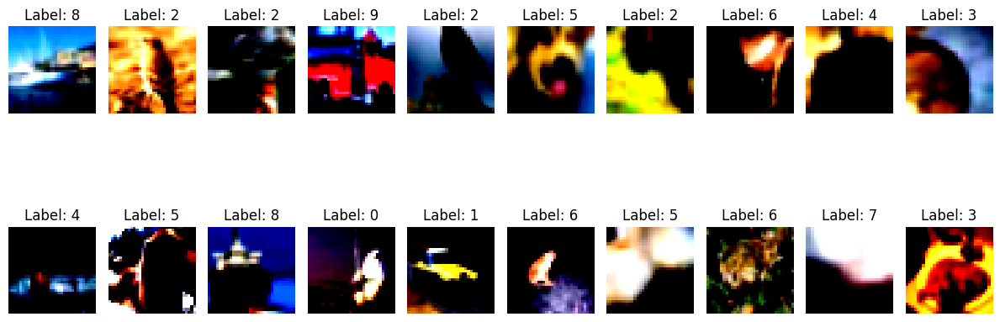

Epoch [13/100], Loss: 0.0311
Epoch [13/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


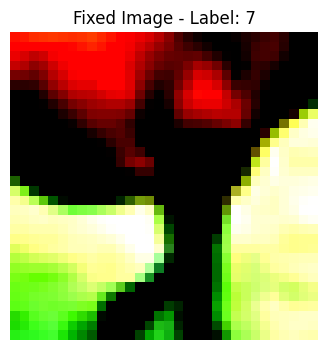

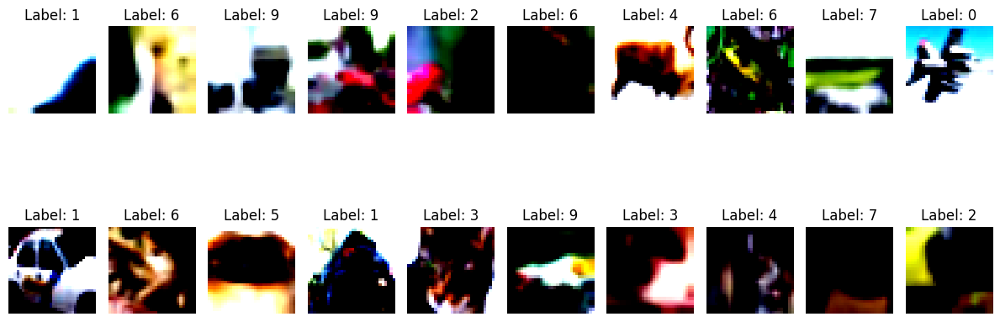

Epoch [14/100], Loss: 0.0298
Epoch [14/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


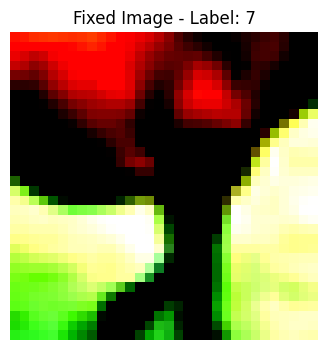

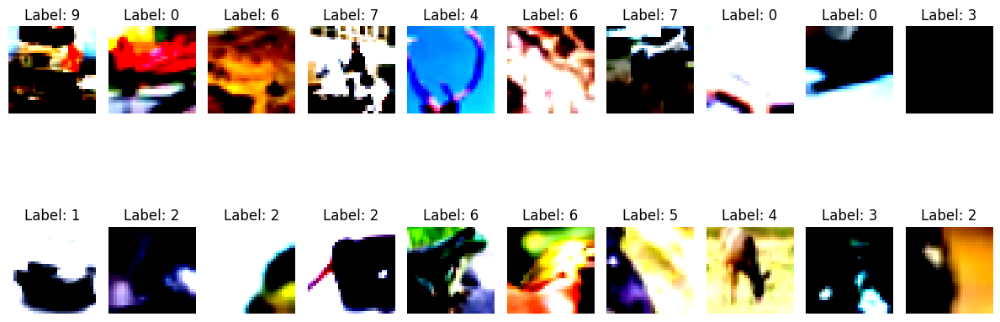

Epoch [15/100], Loss: 0.0289
Epoch [15/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


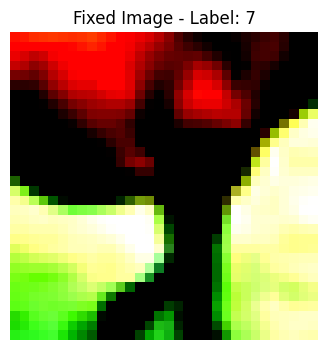

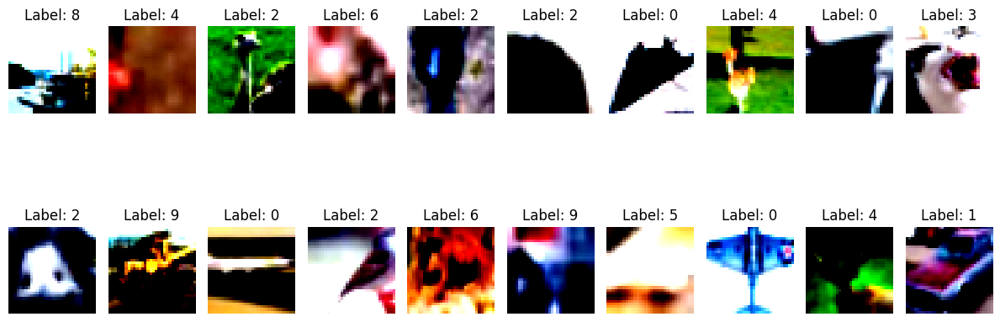

Epoch [16/100], Loss: 0.0283
Epoch [16/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


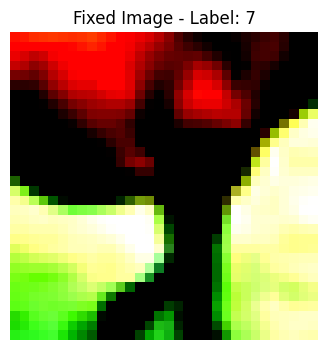

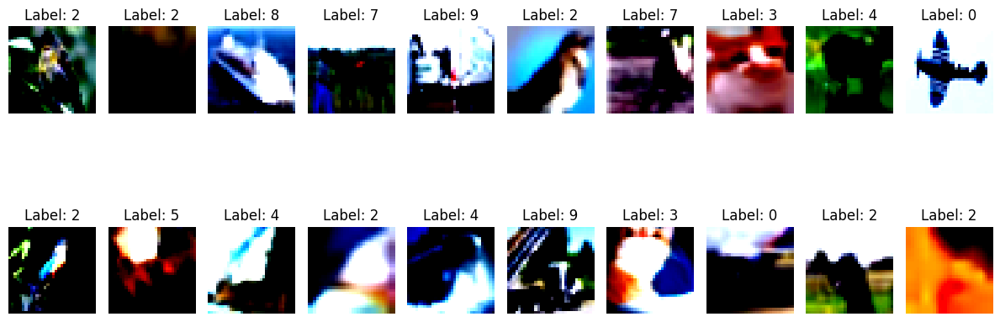

Epoch [17/100], Loss: 0.0278
Epoch [17/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


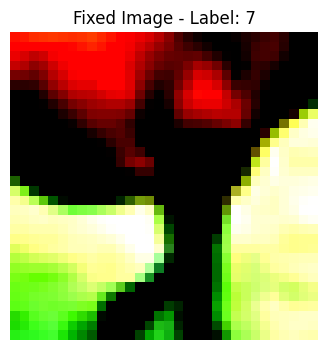

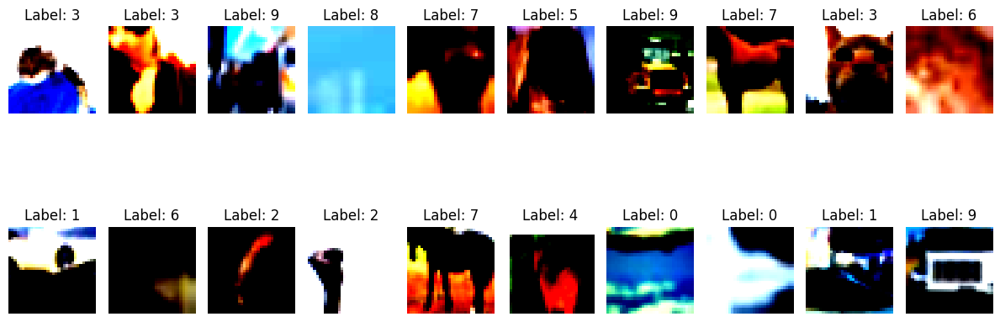

Epoch [18/100], Loss: 0.0274
Epoch [18/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


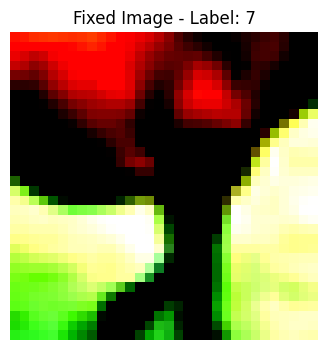

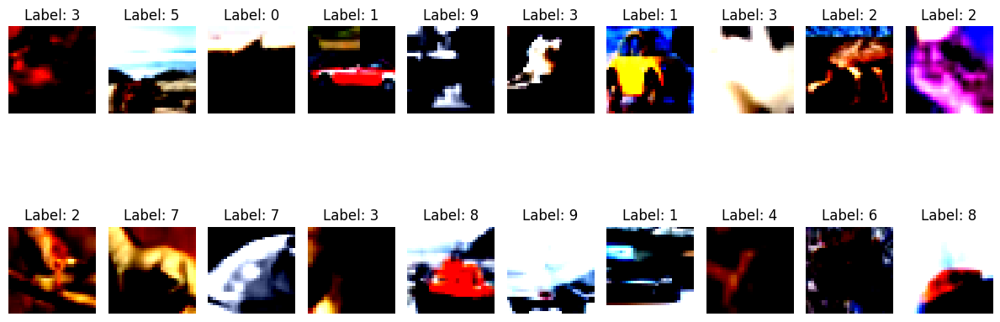

Epoch [19/100], Loss: 0.0271
Epoch [19/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


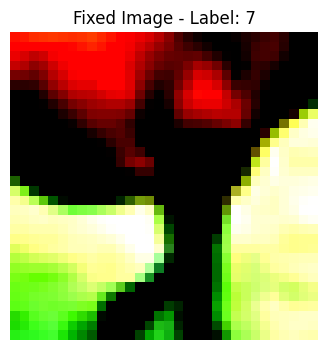

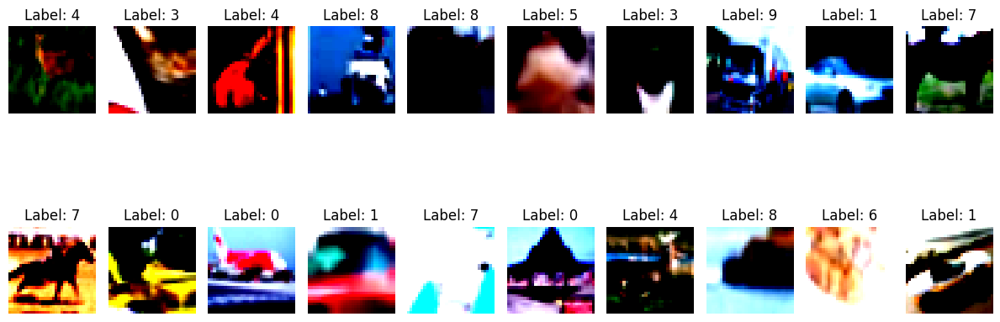

Epoch [20/100], Loss: 0.0268
Epoch [20/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


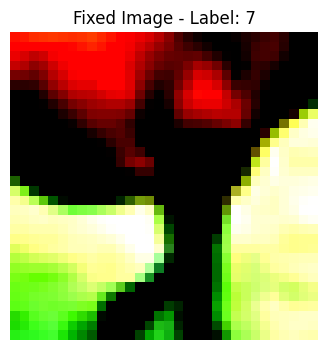

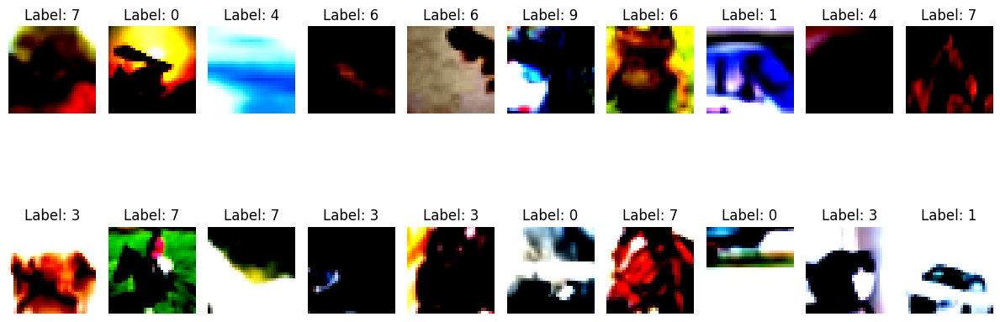

Epoch [21/100], Loss: 0.0266
Epoch [21/100], How simialr?: 5 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


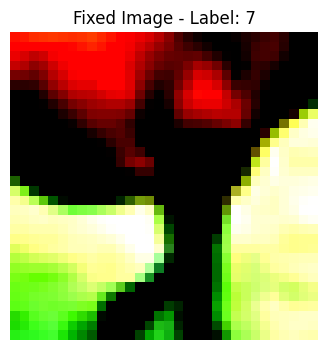

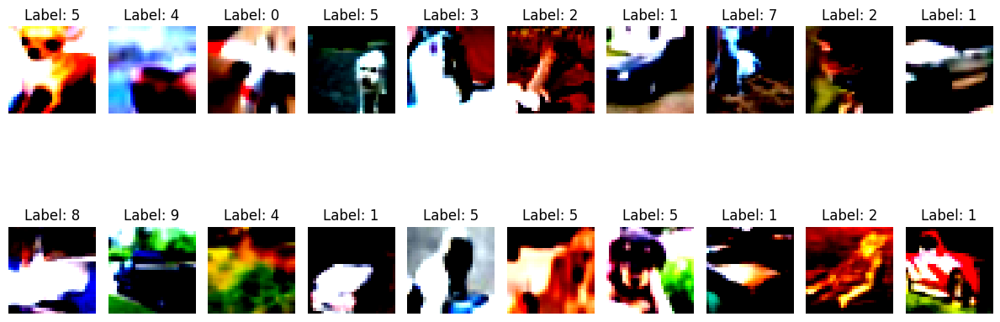

Epoch [22/100], Loss: 0.0263
Epoch [22/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


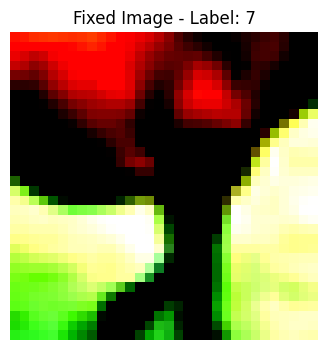

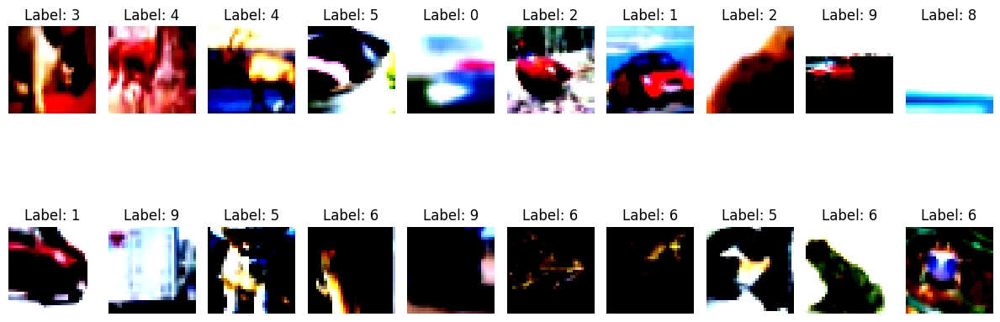

Epoch [23/100], Loss: 0.0261
Epoch [23/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


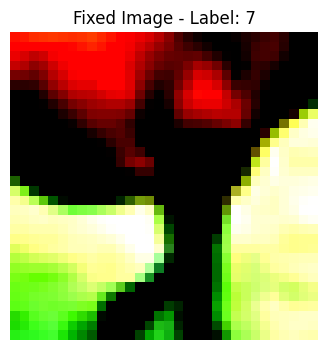

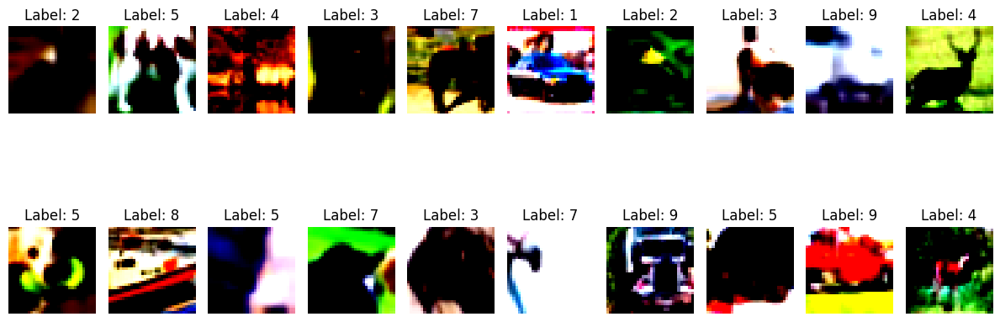

Epoch [24/100], Loss: 0.0259
Epoch [24/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


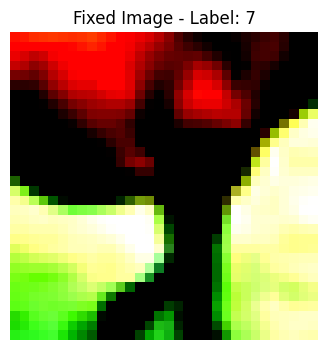

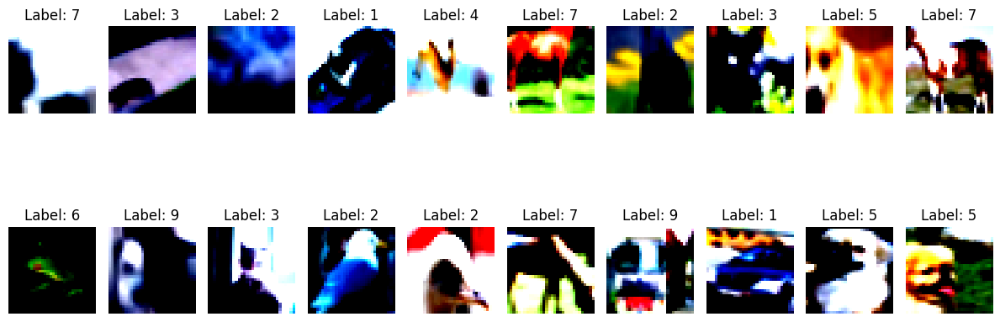

Epoch [25/100], Loss: 0.0257
Epoch [25/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


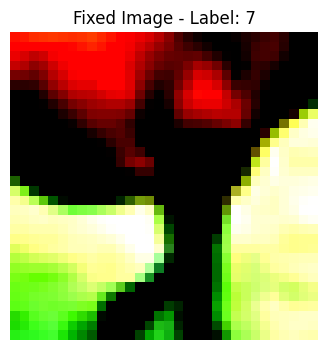

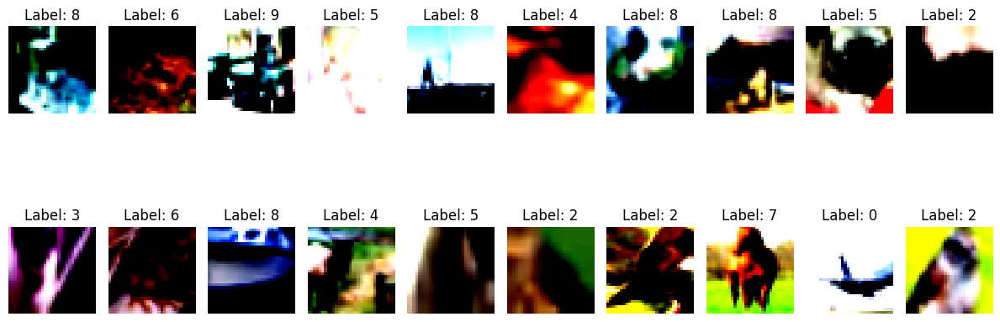

Epoch [26/100], Loss: 0.0255
Epoch [26/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


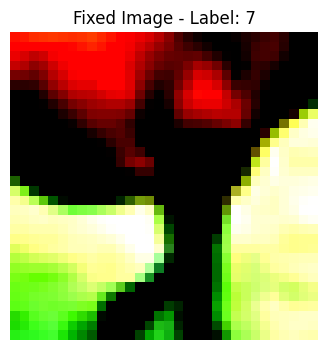

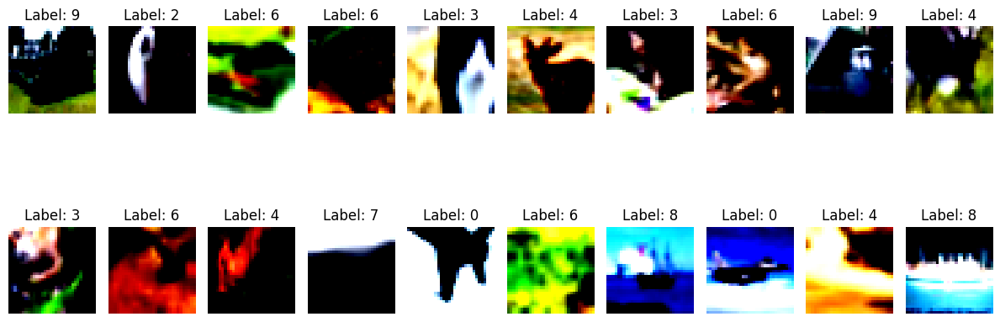

Epoch [27/100], Loss: 0.0253
Epoch [27/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


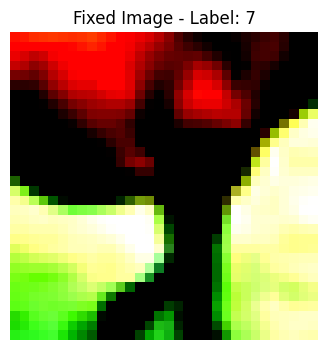

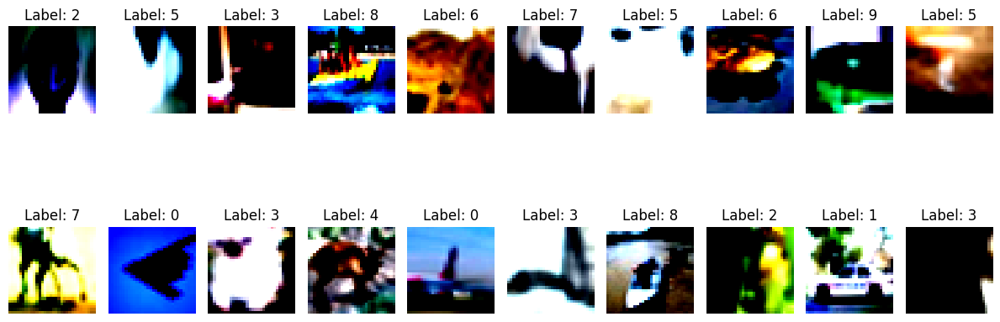

Epoch [28/100], Loss: 0.0252
Epoch [28/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:53<00:00,  7.37it/s]


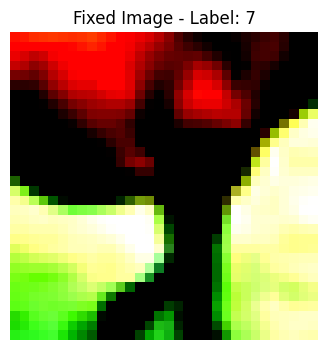

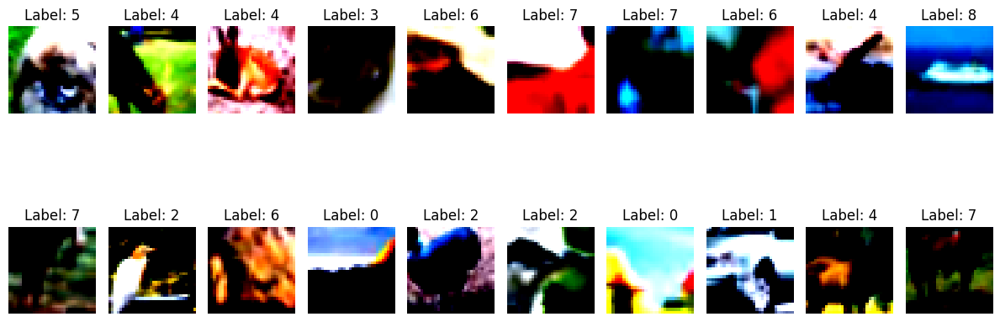

Epoch [29/100], Loss: 0.0250
Epoch [29/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


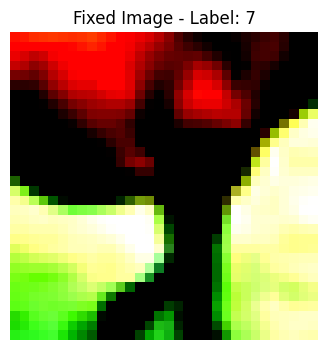

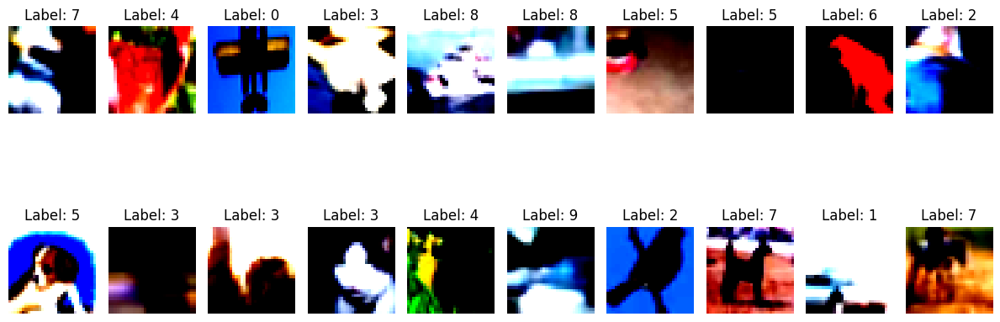

Epoch [30/100], Loss: 0.0249
Epoch [30/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:53<00:00,  7.37it/s]


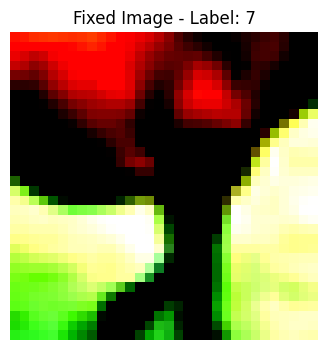

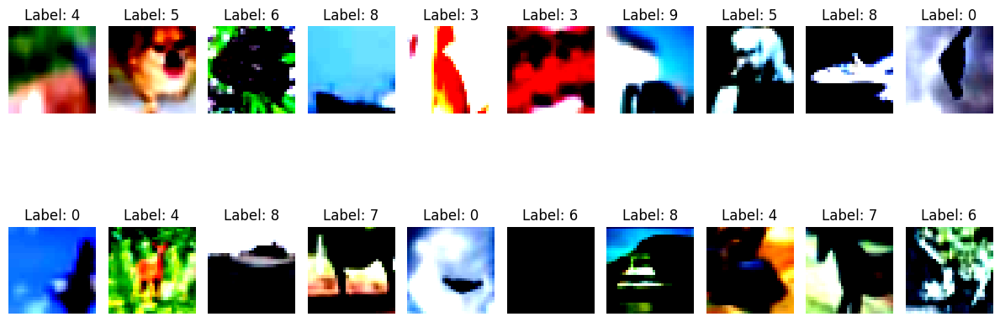

Epoch [31/100], Loss: 0.0247
Epoch [31/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


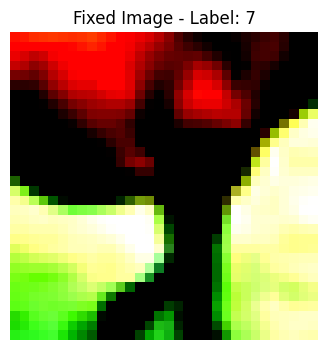

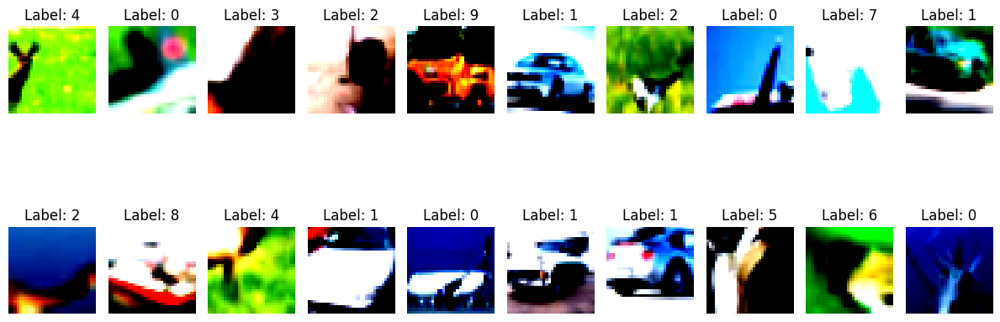

Epoch [32/100], Loss: 0.0246
Epoch [32/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


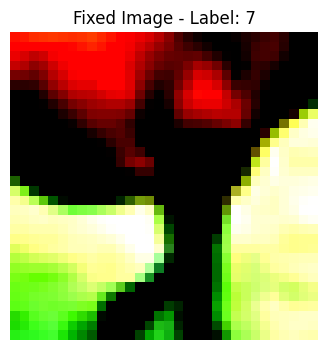

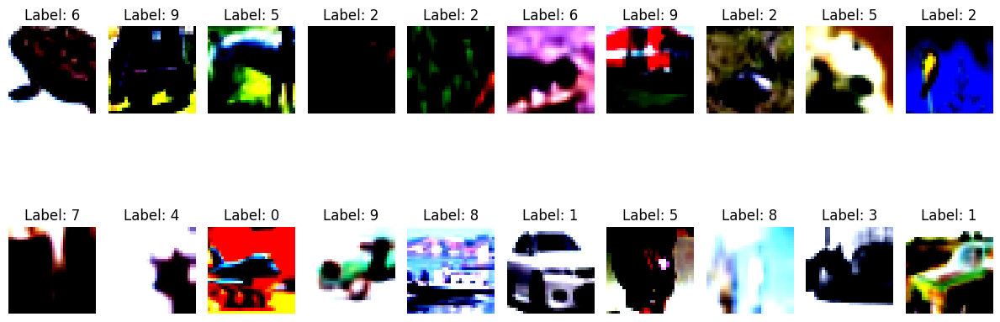

Epoch [33/100], Loss: 0.0246
Epoch [33/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.38it/s]


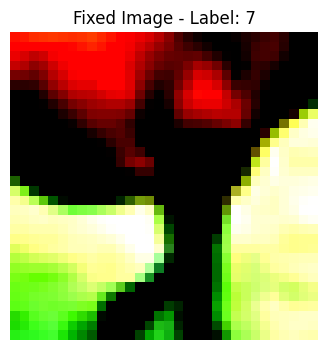

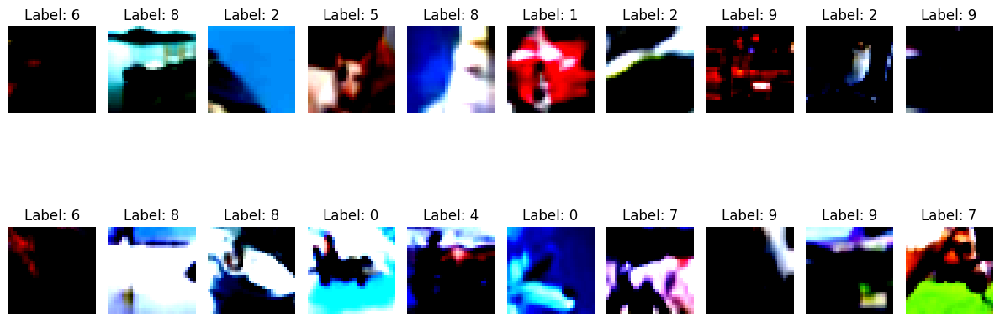

Epoch [34/100], Loss: 0.0244
Epoch [34/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:53<00:00,  7.28it/s]


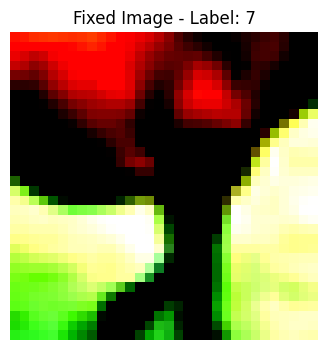

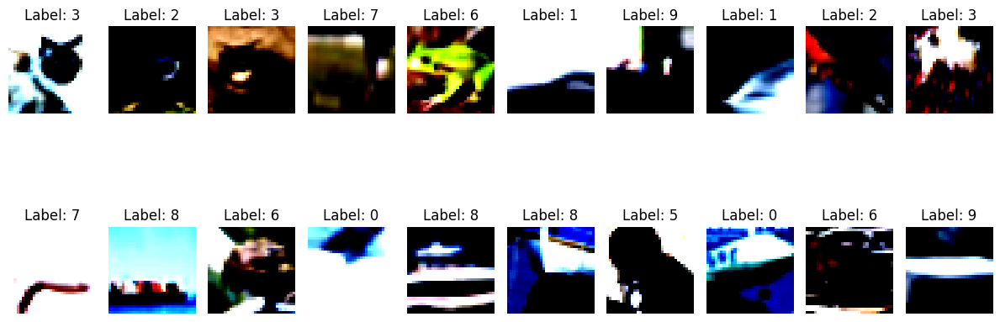

Epoch [35/100], Loss: 0.0243
Epoch [35/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.38it/s]


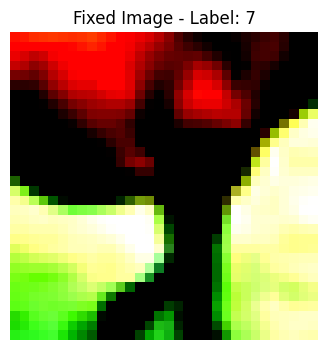

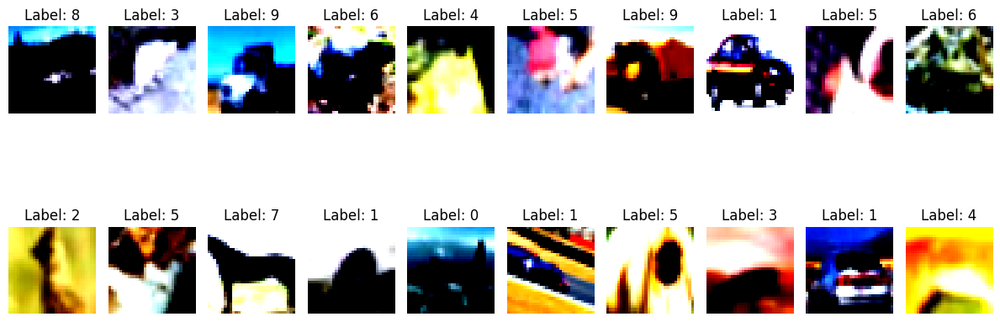

Epoch [36/100], Loss: 0.0242
Epoch [36/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


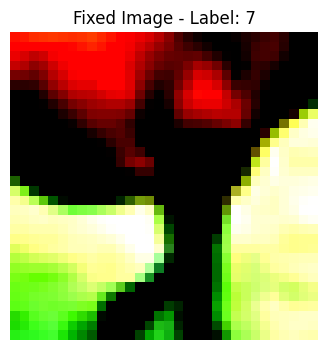

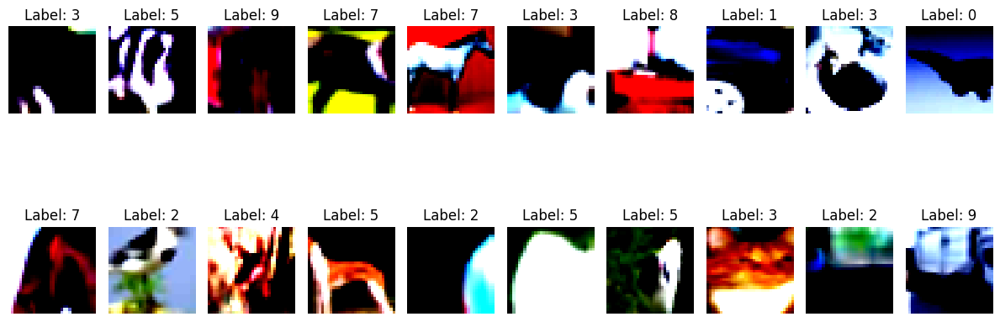

Epoch [37/100], Loss: 0.0241
Epoch [37/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:53<00:00,  7.37it/s]


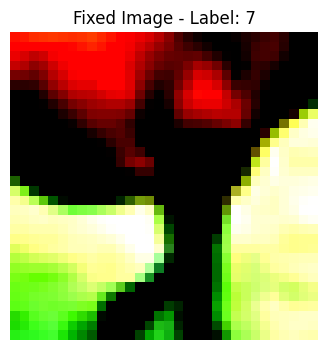

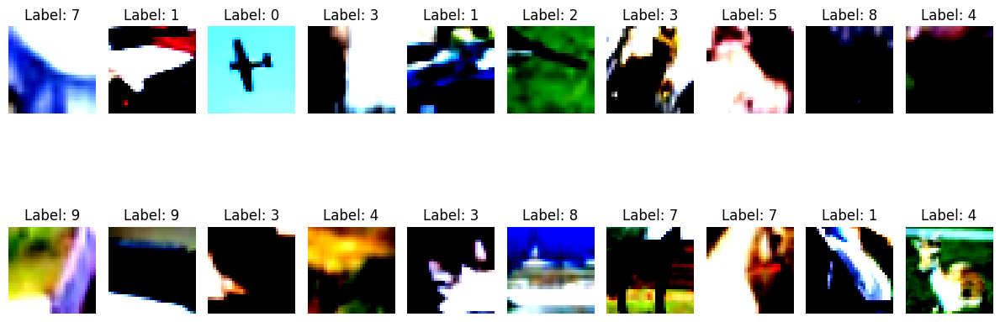

Epoch [38/100], Loss: 0.0240
Epoch [38/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


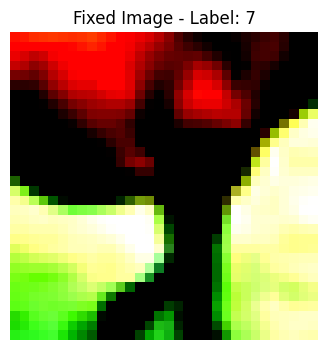

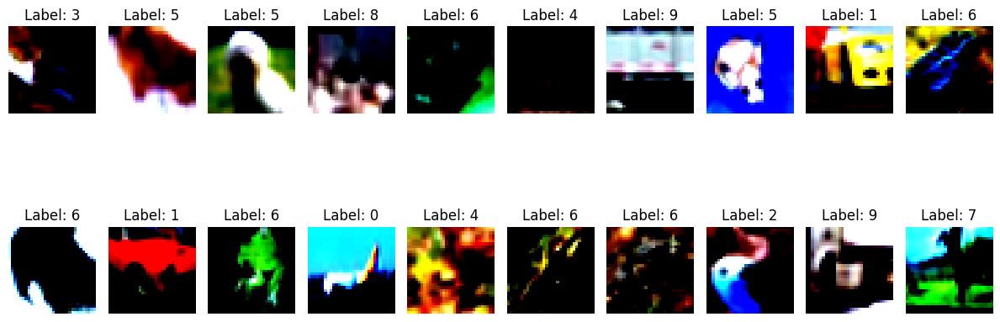

Epoch [39/100], Loss: 0.0239
Epoch [39/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


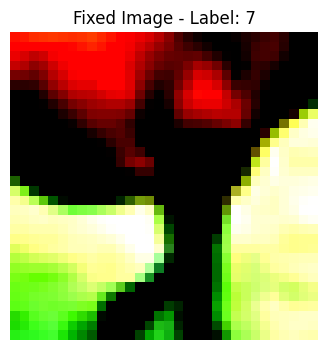

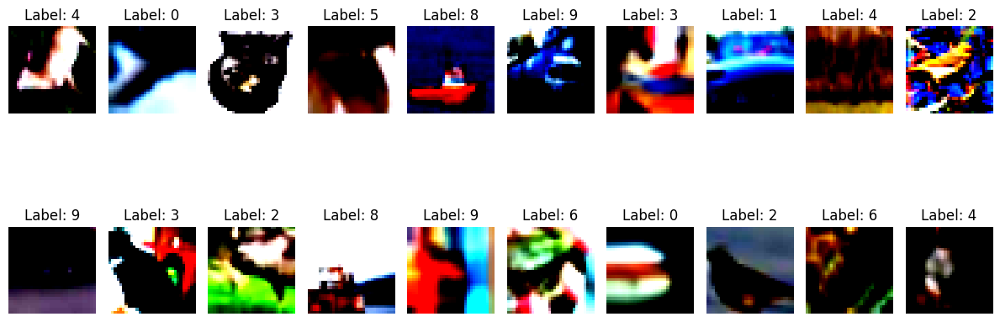

Epoch [40/100], Loss: 0.0239
Epoch [40/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.38it/s]


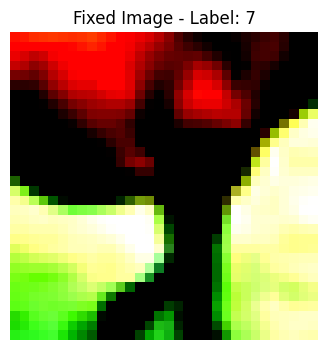

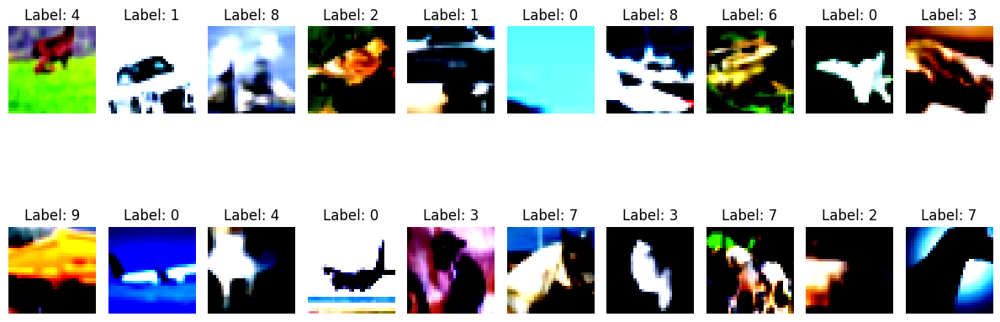

Epoch [41/100], Loss: 0.0238
Epoch [41/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.38it/s]


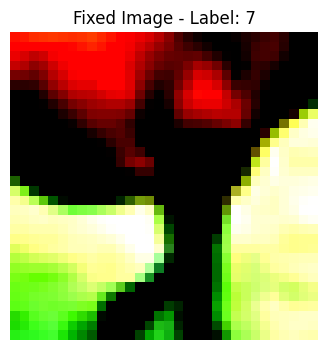

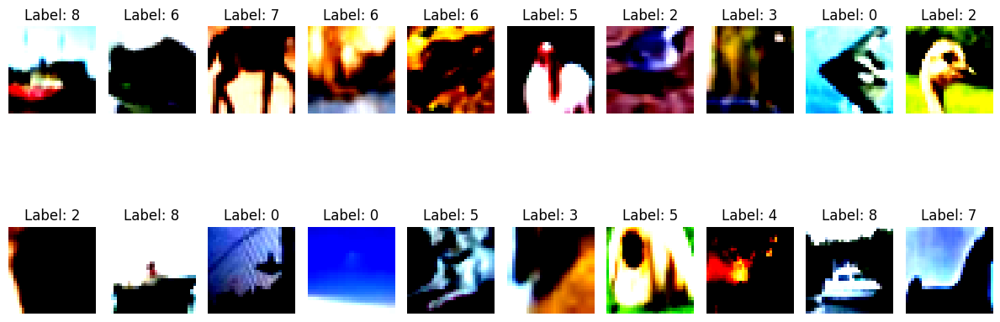

Epoch [42/100], Loss: 0.0238
Epoch [42/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


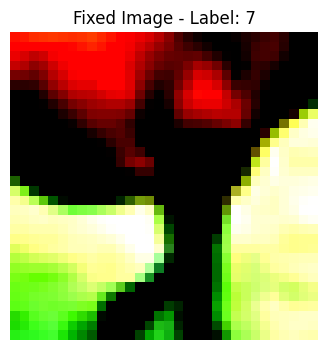

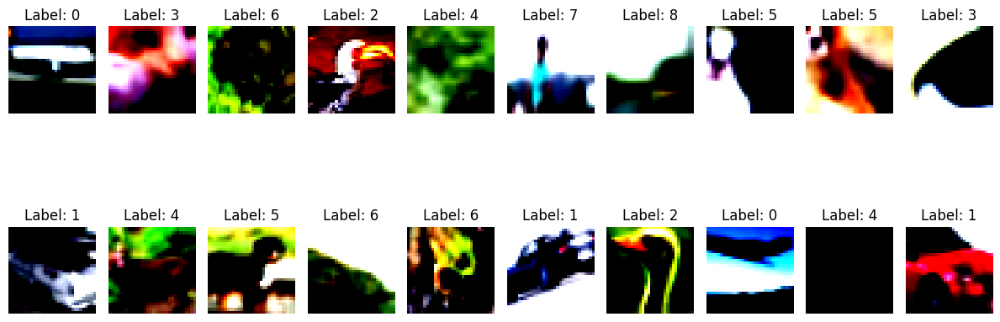

Epoch [43/100], Loss: 0.0236
Epoch [43/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


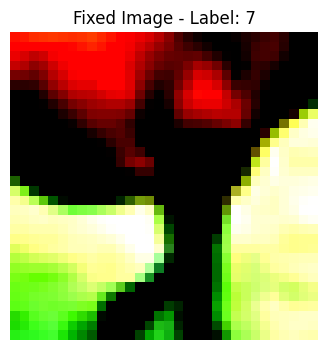

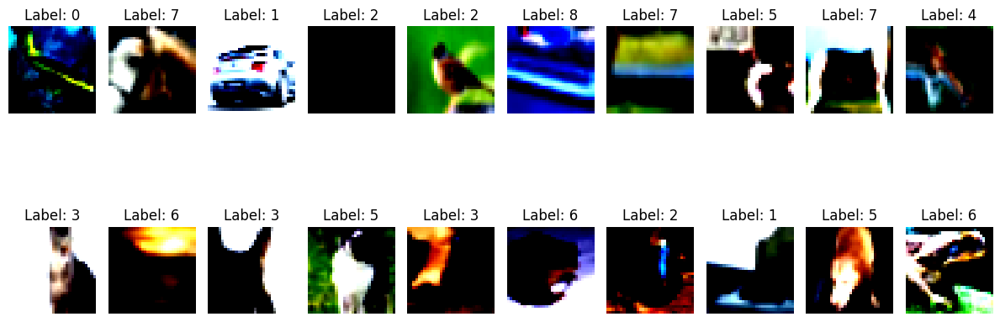

Epoch [44/100], Loss: 0.0236
Epoch [44/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


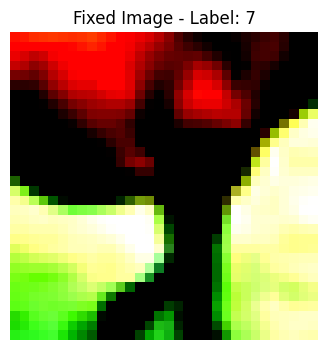

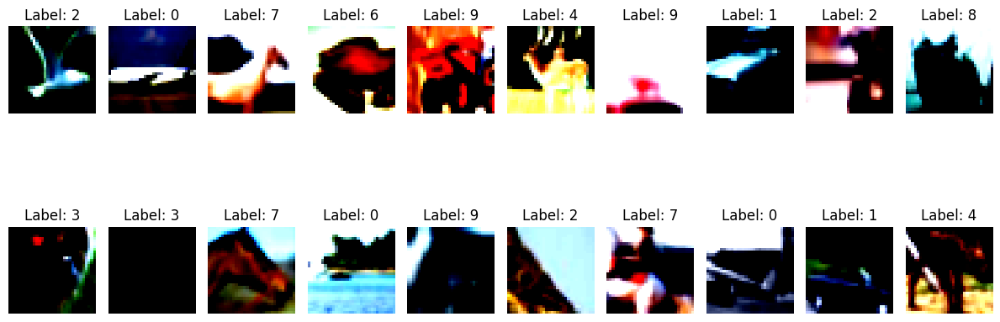

Epoch [45/100], Loss: 0.0235
Epoch [45/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


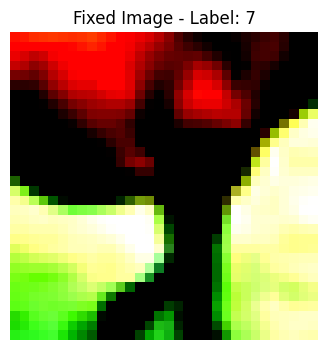

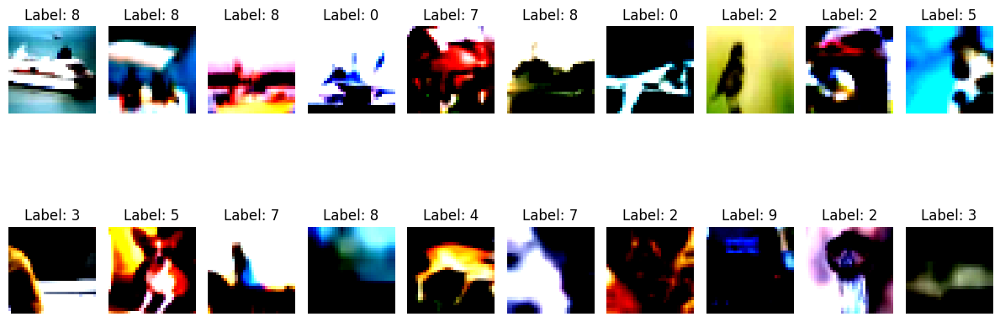

Epoch [46/100], Loss: 0.0235
Epoch [46/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


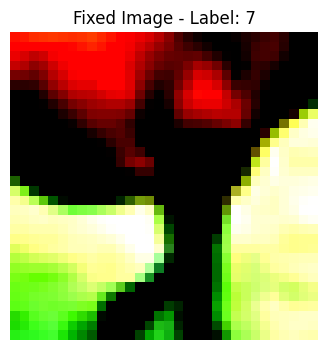

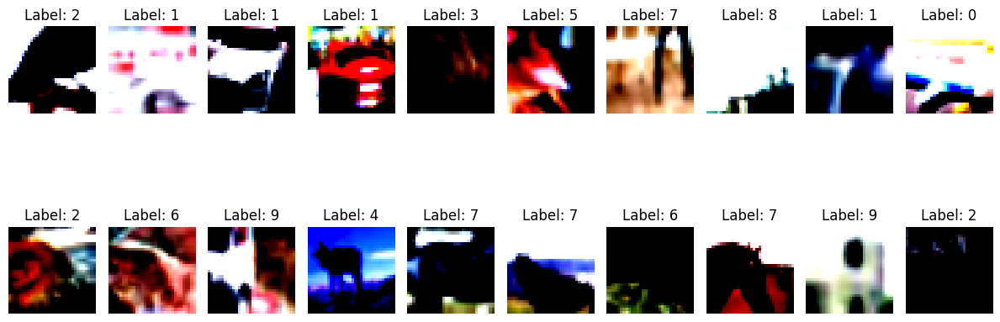

Epoch [47/100], Loss: 0.0234
Epoch [47/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:53<00:00,  7.36it/s]


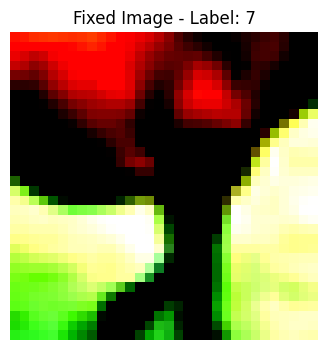

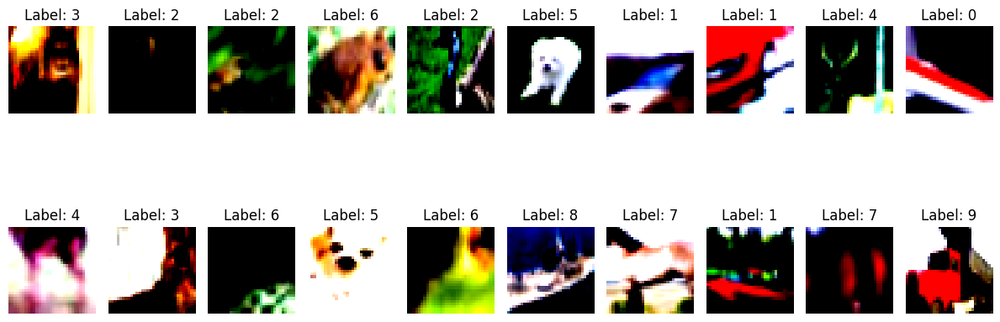

Epoch [48/100], Loss: 0.0234
Epoch [48/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


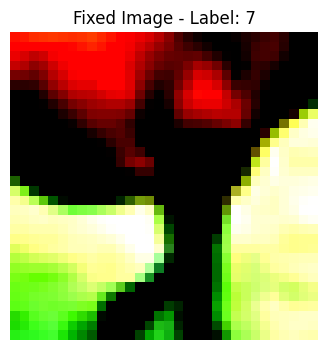

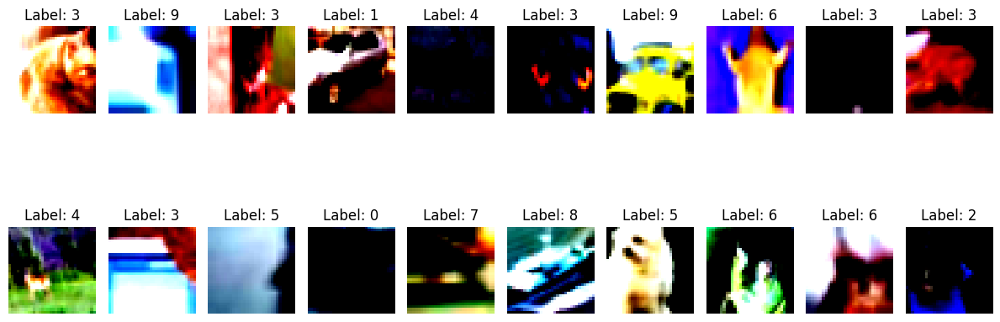

Epoch [49/100], Loss: 0.0233
Epoch [49/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


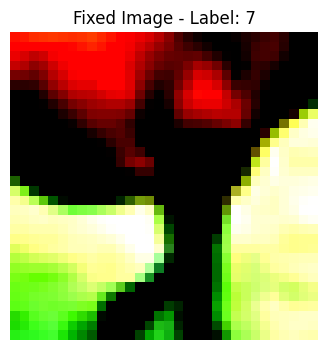

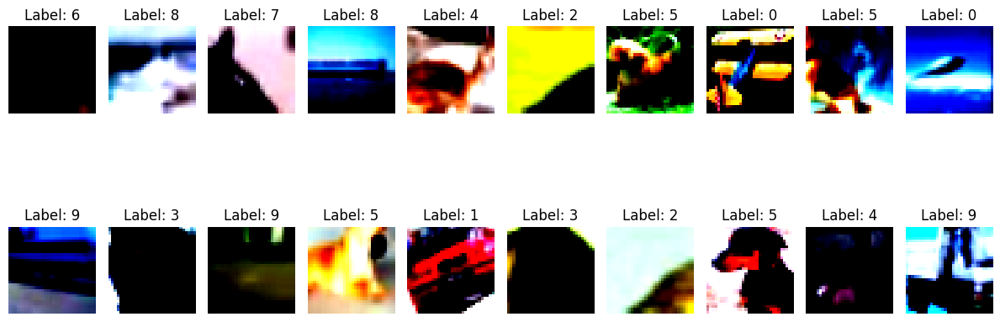

Epoch [50/100], Loss: 0.0233
Epoch [50/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.38it/s]


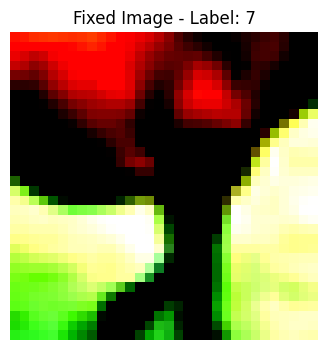

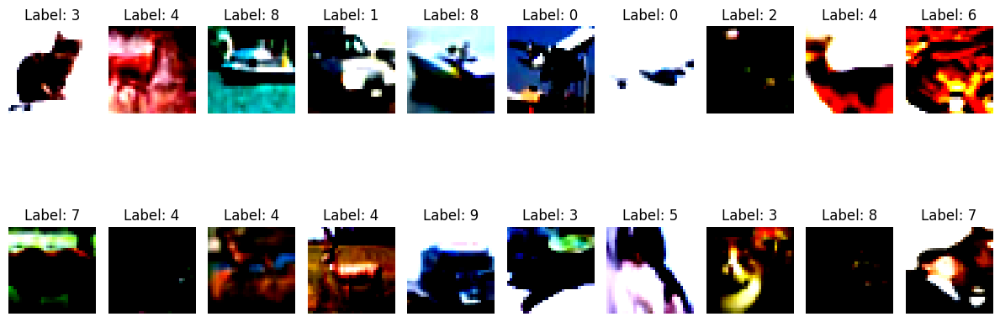

Epoch [51/100], Loss: 0.0232
Epoch [51/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


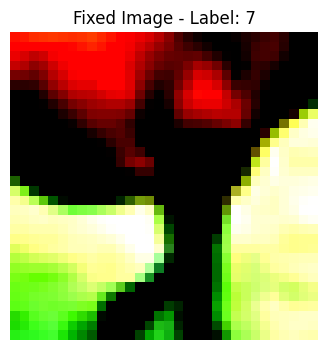

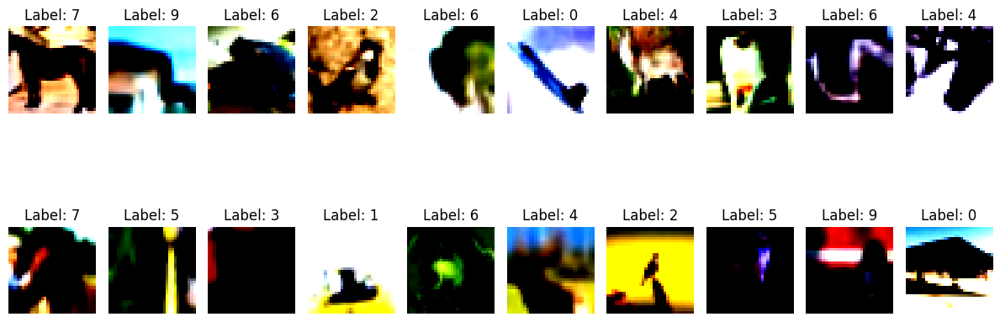

Epoch [52/100], Loss: 0.0232
Epoch [52/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


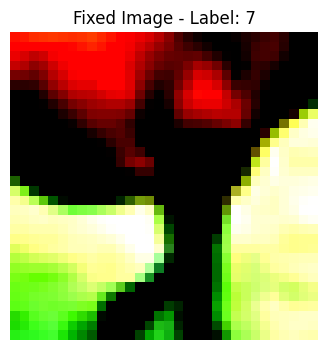

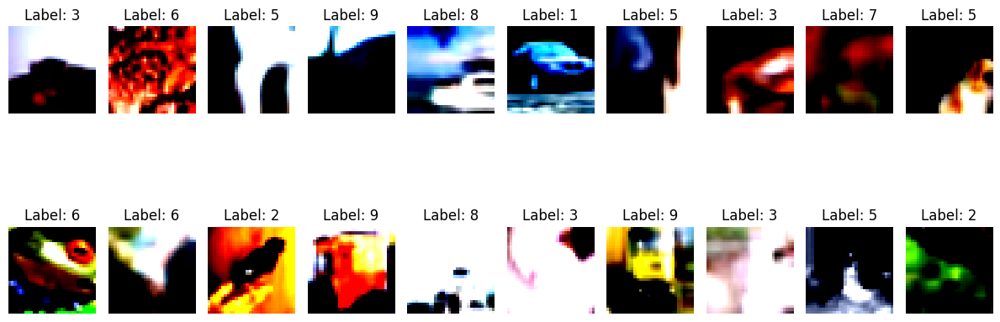

Epoch [53/100], Loss: 0.0231
Epoch [53/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


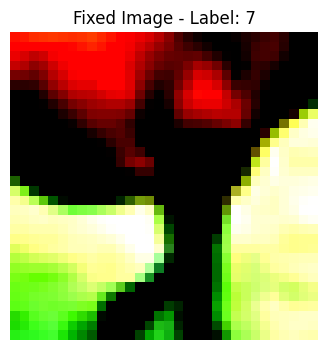

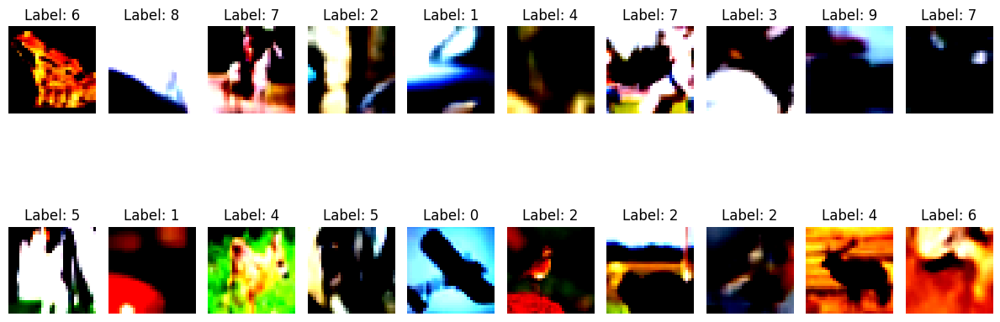

Epoch [54/100], Loss: 0.0232
Epoch [54/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


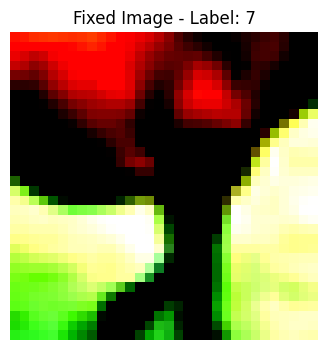

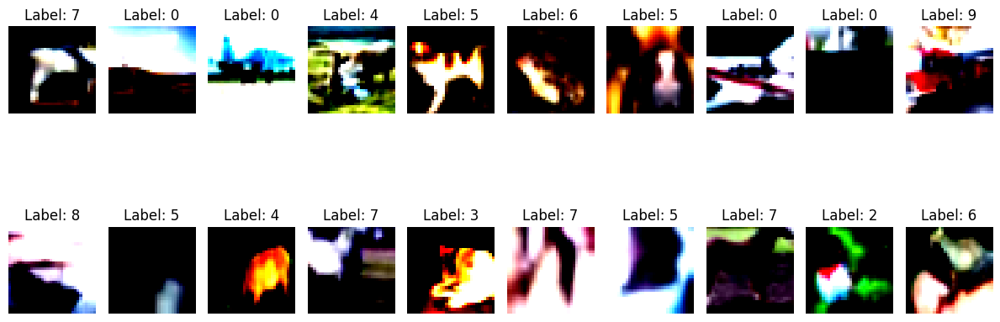

Epoch [55/100], Loss: 0.0231
Epoch [55/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


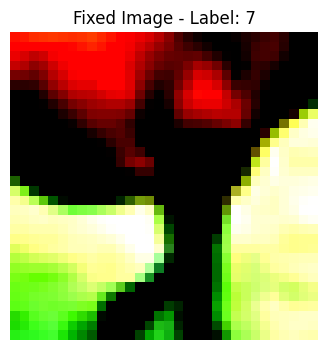

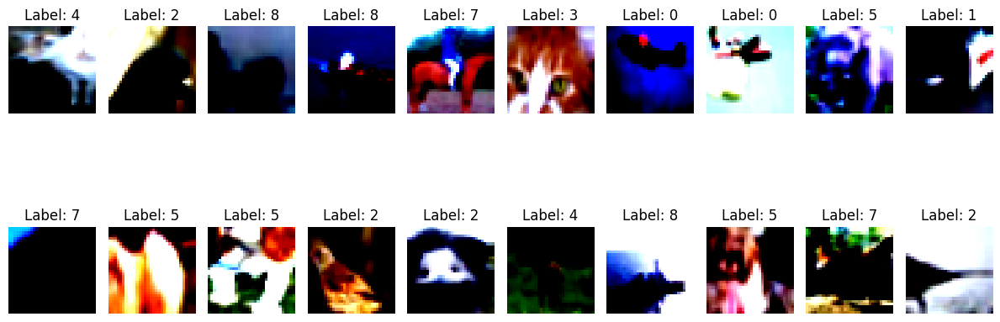

Epoch [56/100], Loss: 0.0231
Epoch [56/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


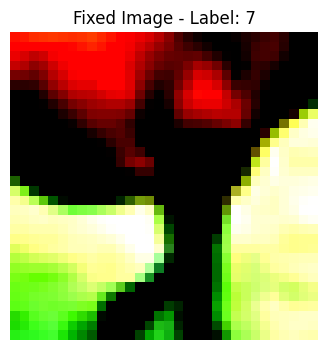

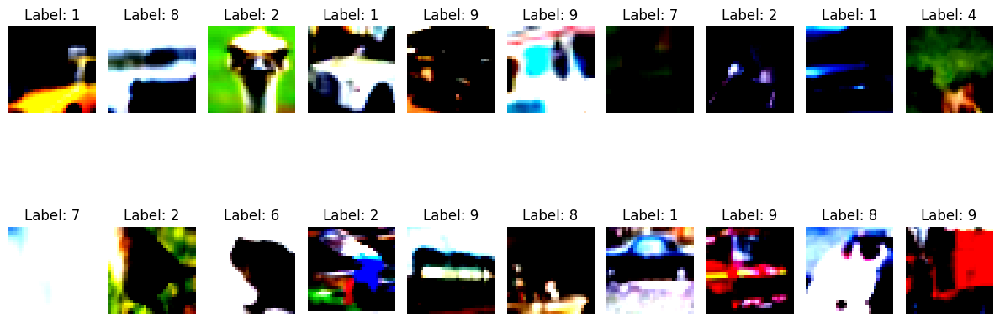

Epoch [57/100], Loss: 0.0230
Epoch [57/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


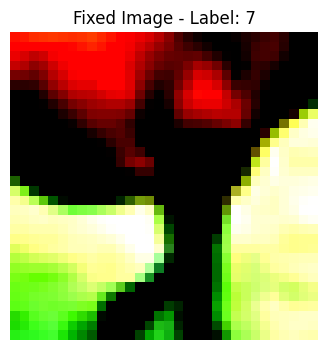

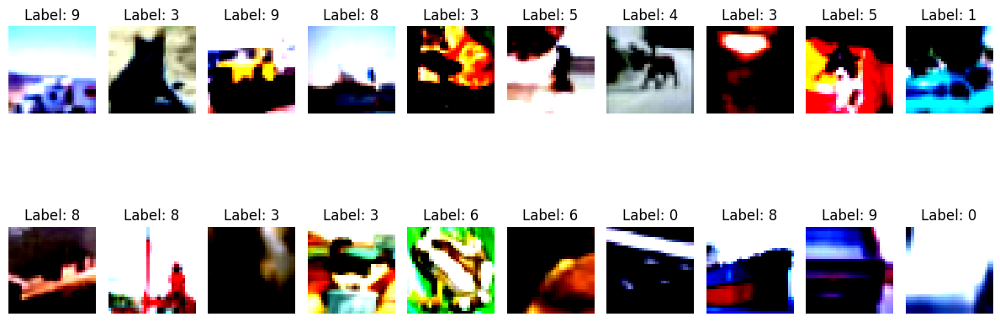

Epoch [58/100], Loss: 0.0229
Epoch [58/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


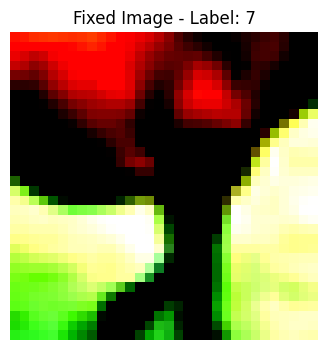

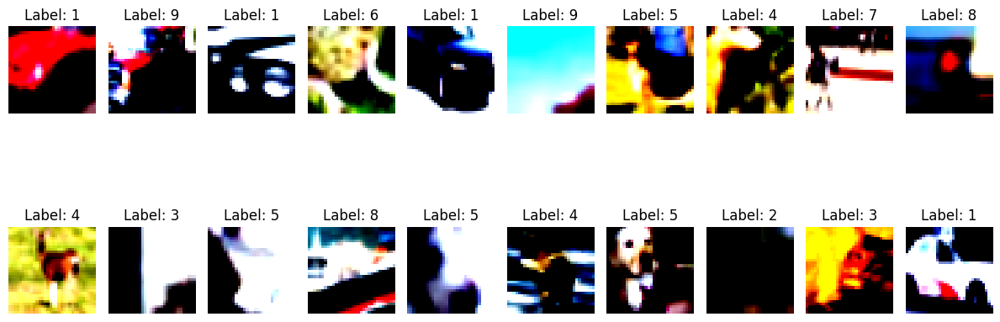

Epoch [59/100], Loss: 0.0229
Epoch [59/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:55<00:00,  7.02it/s]


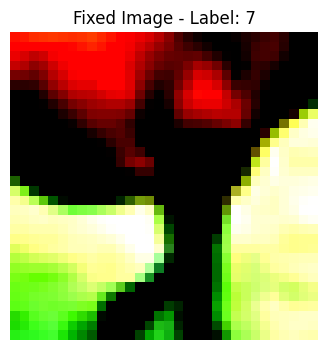

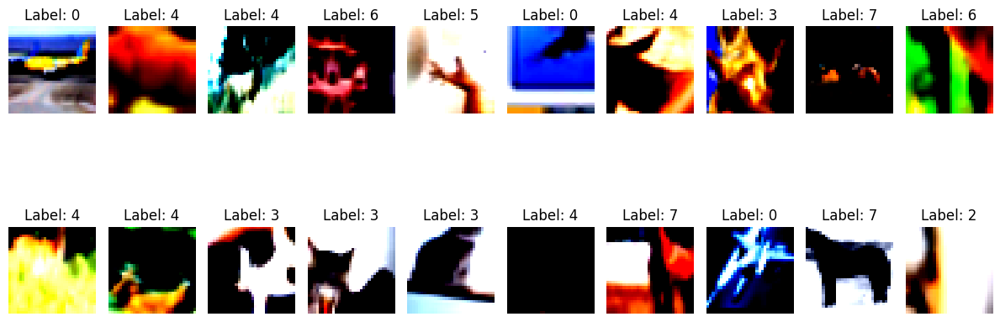

Epoch [60/100], Loss: 0.0230
Epoch [60/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.39it/s]


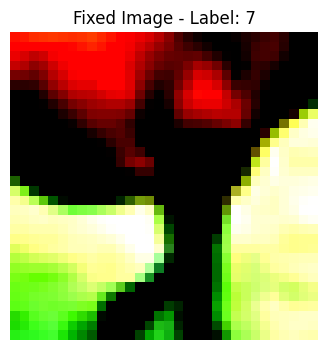

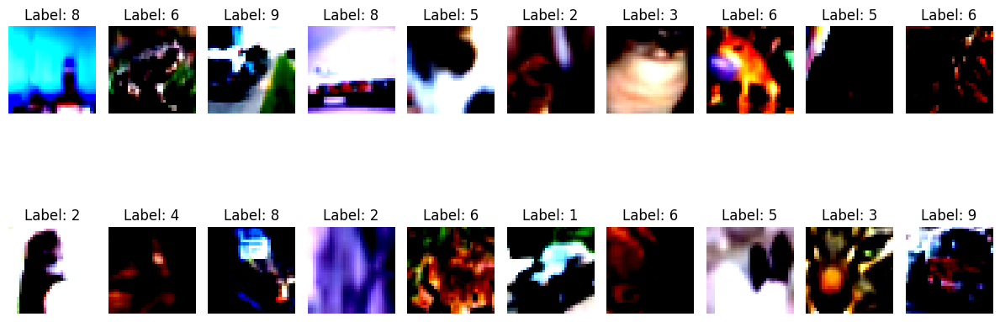

Epoch [61/100], Loss: 0.0229
Epoch [61/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


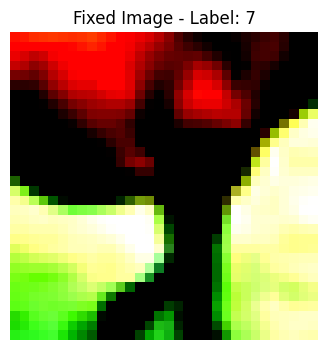

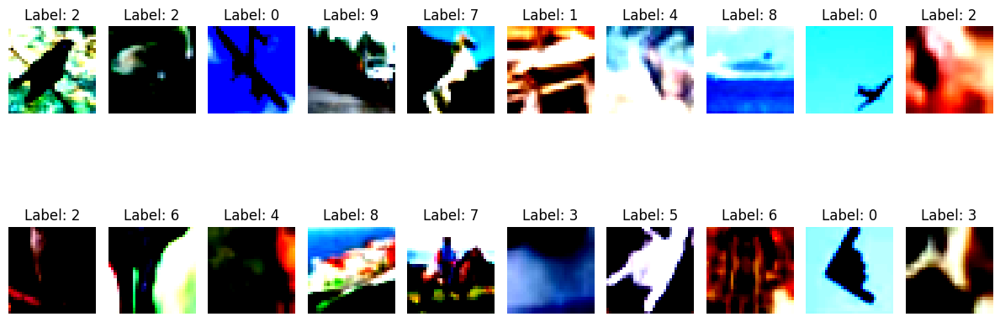

Epoch [62/100], Loss: 0.0229
Epoch [62/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


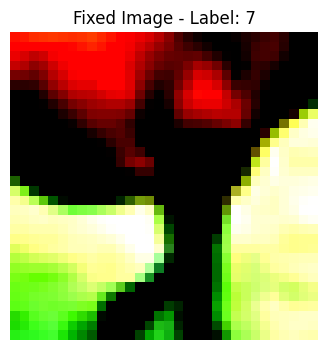

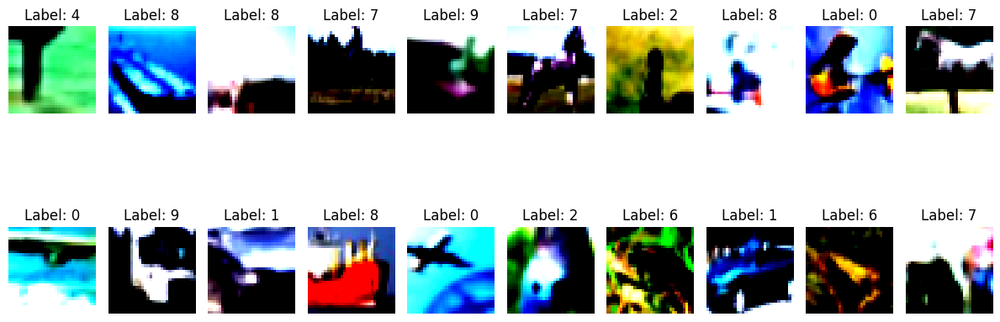

Epoch [63/100], Loss: 0.0228
Epoch [63/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.45it/s]


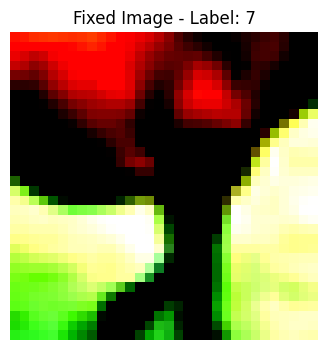

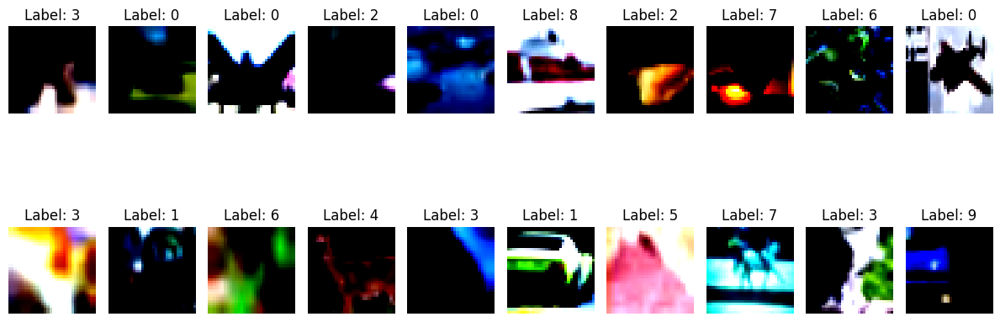

Epoch [64/100], Loss: 0.0229
Epoch [64/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.47it/s]


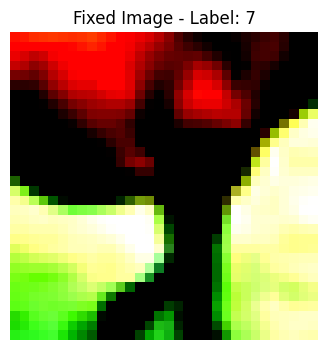

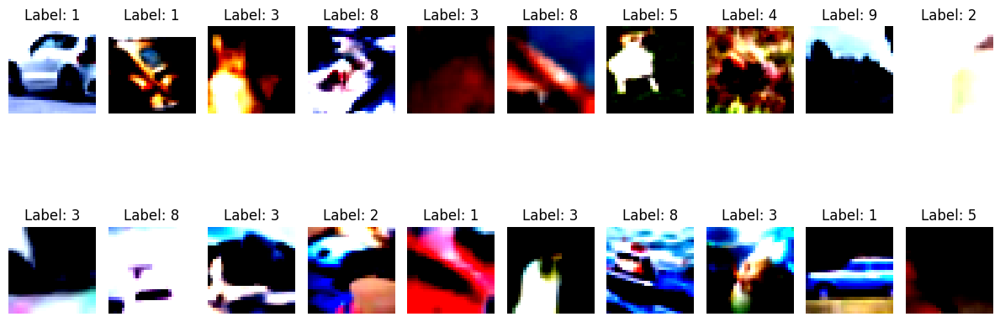

Epoch [65/100], Loss: 0.0228
Epoch [65/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


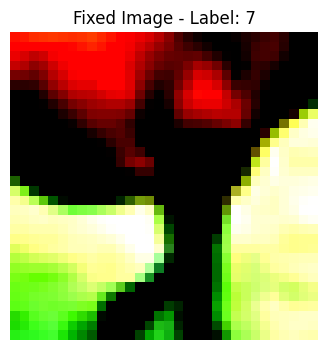

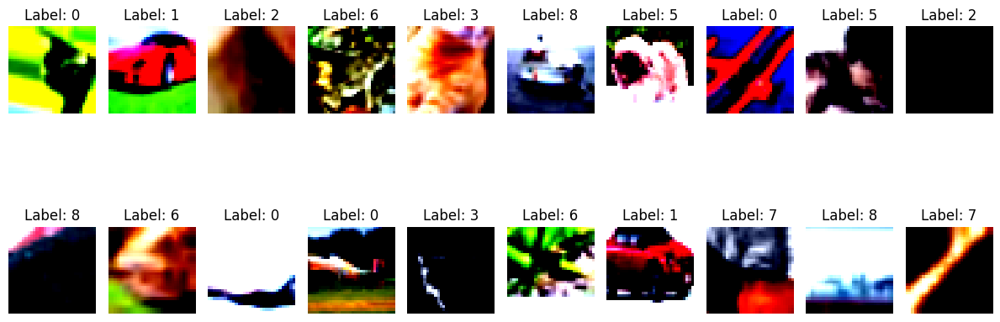

Epoch [66/100], Loss: 0.0227
Epoch [66/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


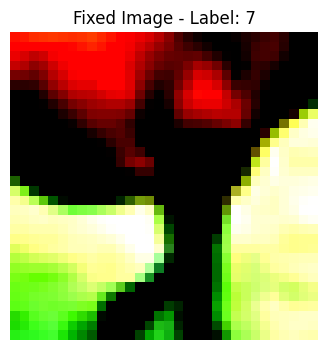

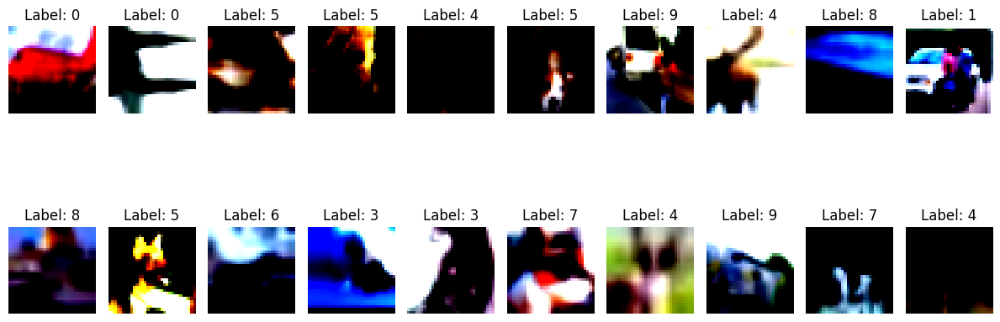

Epoch [67/100], Loss: 0.0227
Epoch [67/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


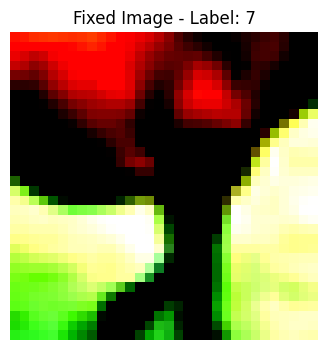

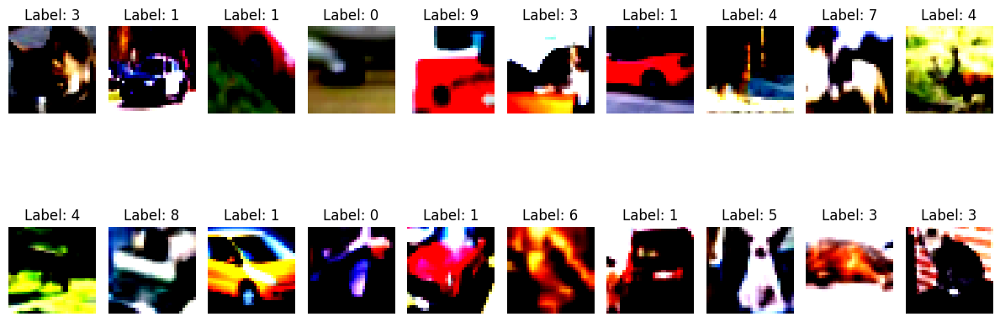

Epoch [68/100], Loss: 0.0227
Epoch [68/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


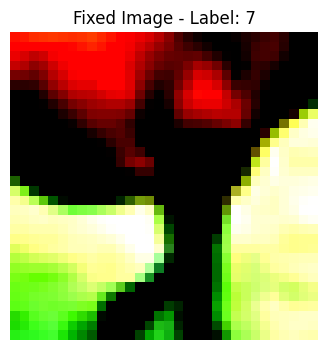

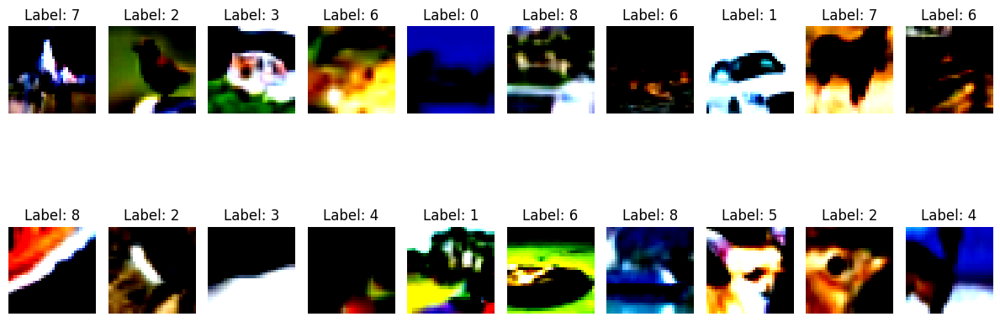

Epoch [69/100], Loss: 0.0228
Epoch [69/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.47it/s]


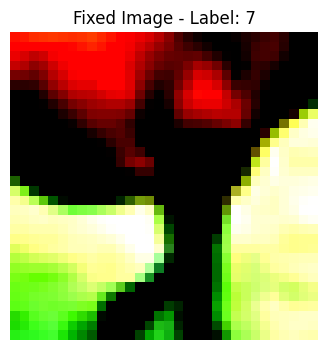

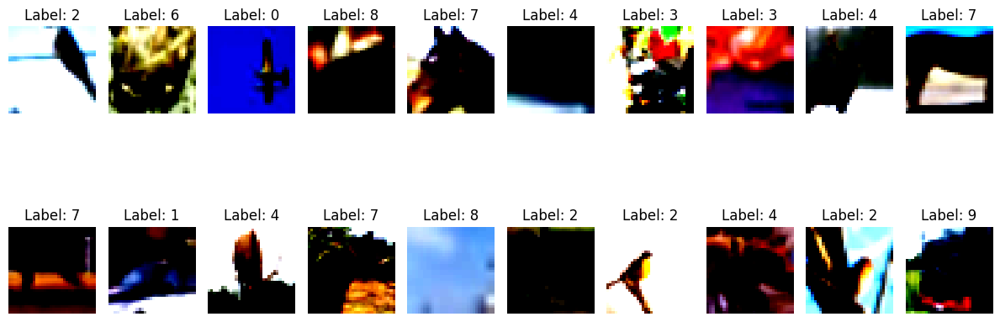

Epoch [70/100], Loss: 0.0228
Epoch [70/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.46it/s]


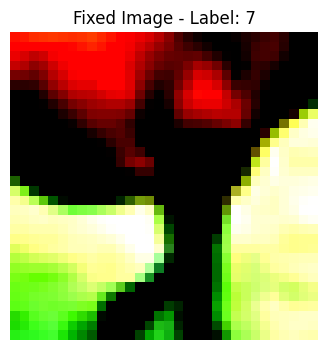

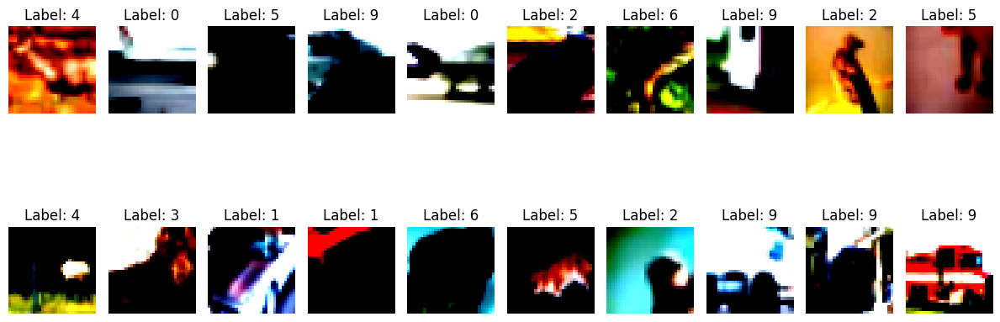

Epoch [71/100], Loss: 0.0227
Epoch [71/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.47it/s]


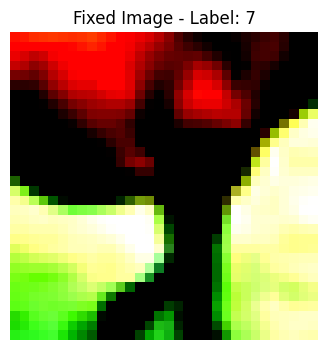

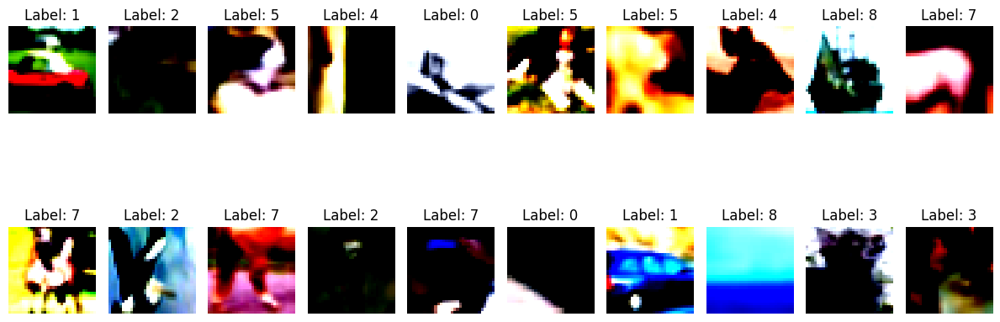

Epoch [72/100], Loss: 0.0227
Epoch [72/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.46it/s]


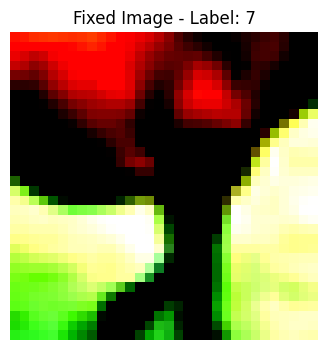

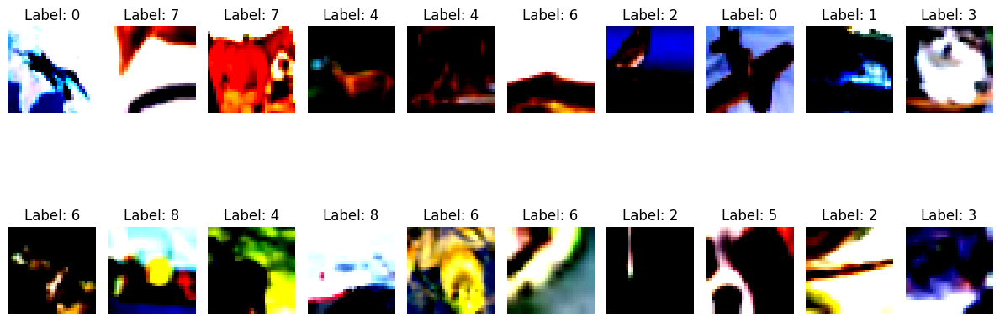

Epoch [73/100], Loss: 0.0227
Epoch [73/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


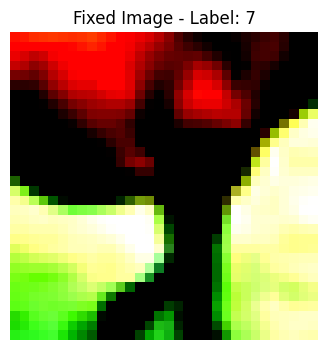

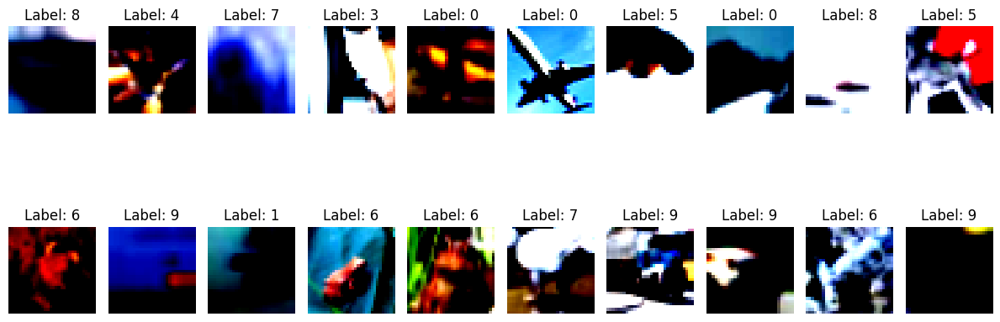

Epoch [74/100], Loss: 0.0226
Epoch [74/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.46it/s]


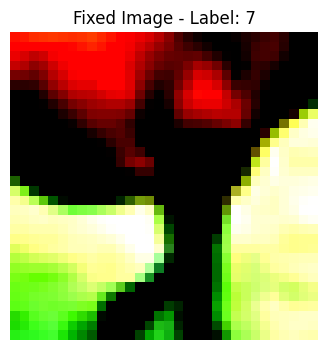

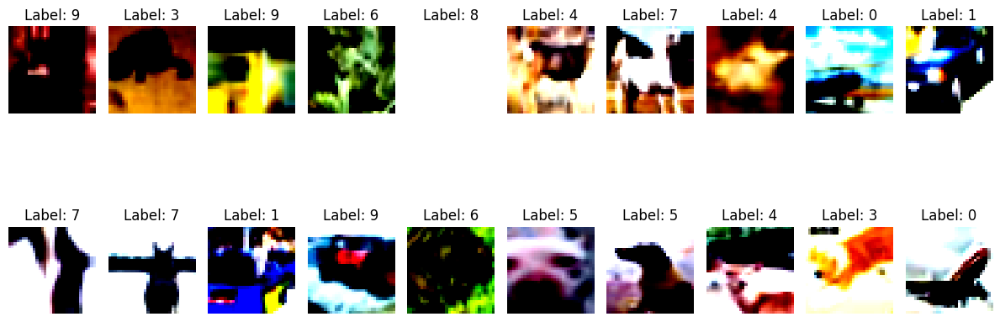

Epoch [75/100], Loss: 0.0226
Epoch [75/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.46it/s]


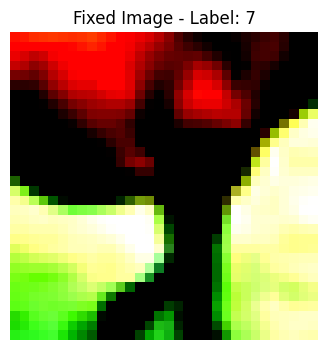

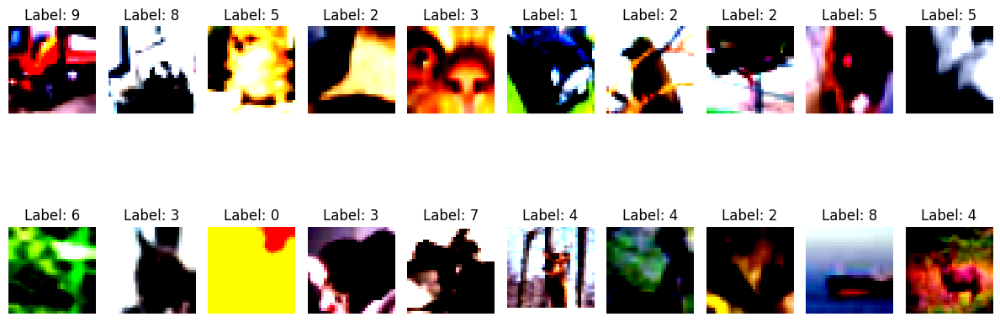

Epoch [76/100], Loss: 0.0227
Epoch [76/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.48it/s]


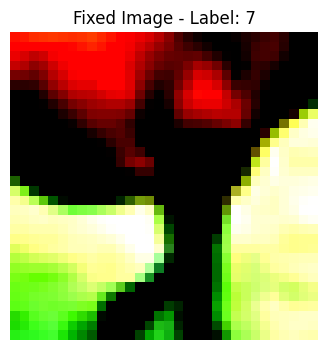

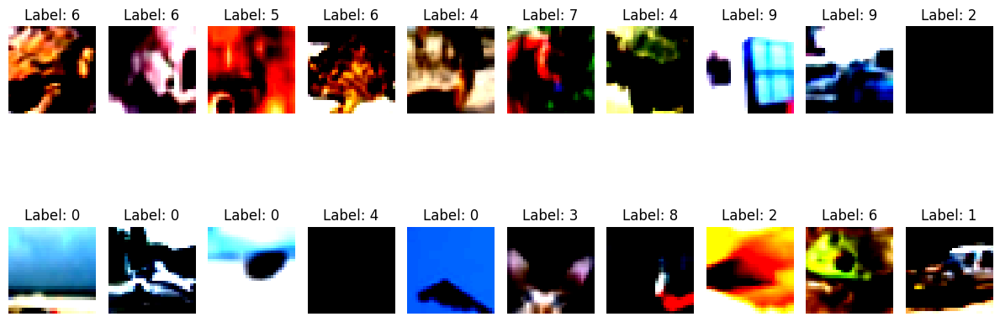

Epoch [77/100], Loss: 0.0226
Epoch [77/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.45it/s]


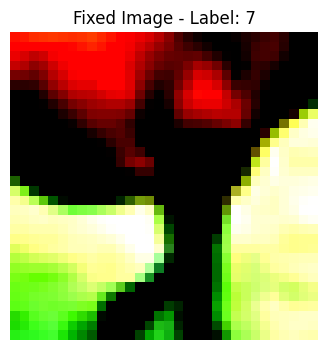

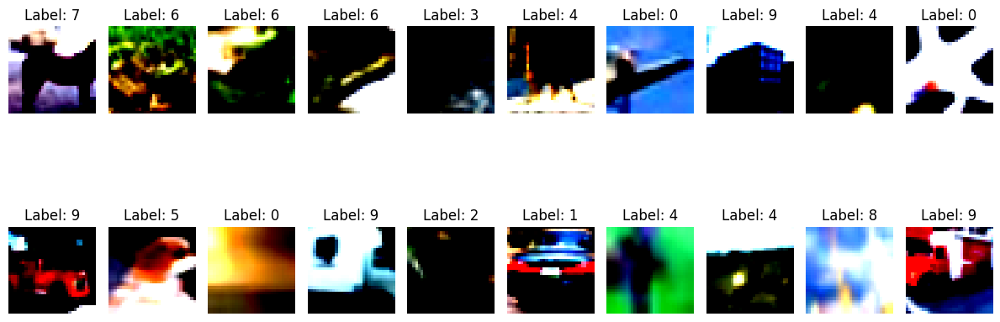

Epoch [78/100], Loss: 0.0226
Epoch [78/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.46it/s]


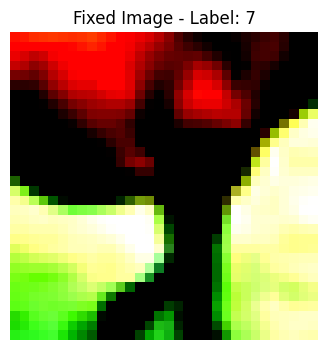

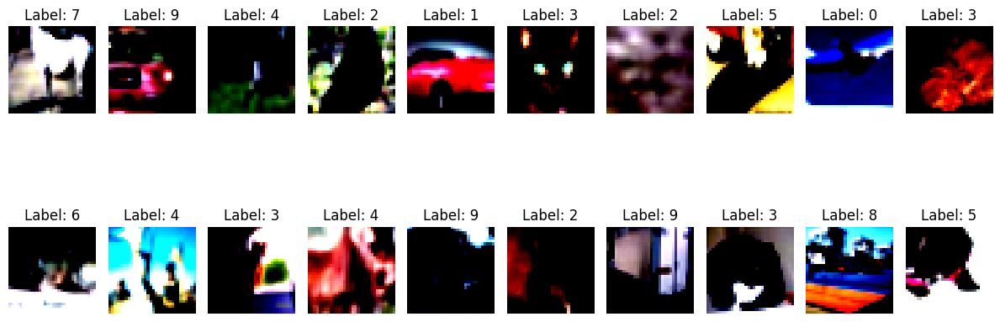

Epoch [79/100], Loss: 0.0226
Epoch [79/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.47it/s]


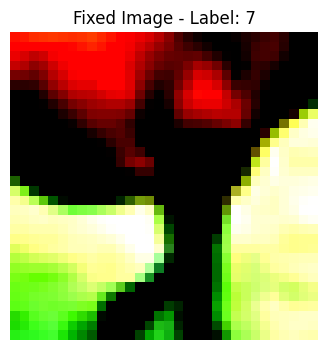

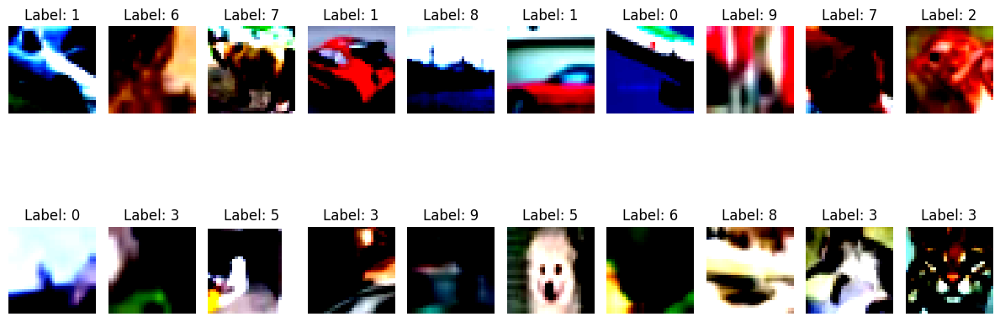

Epoch [80/100], Loss: 0.0226
Epoch [80/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.48it/s]


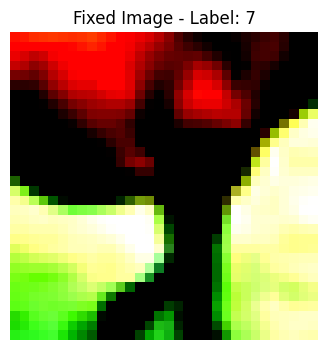

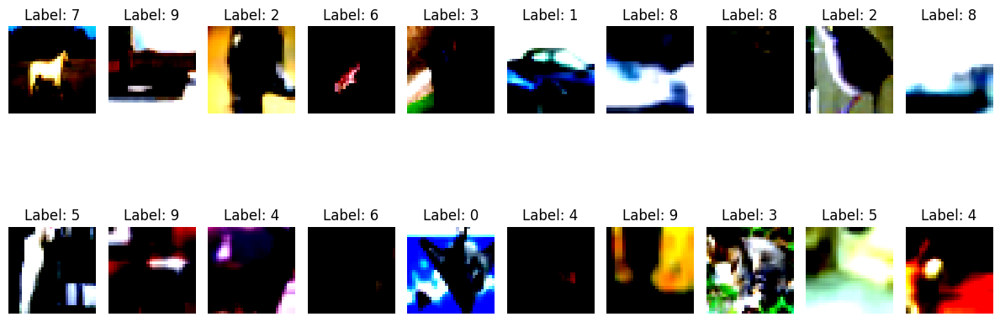

Epoch [81/100], Loss: 0.0226
Epoch [81/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


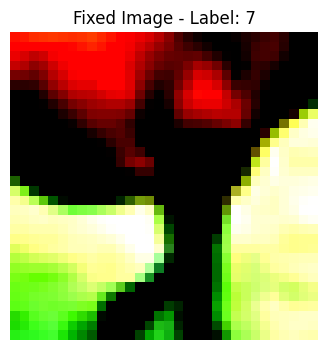

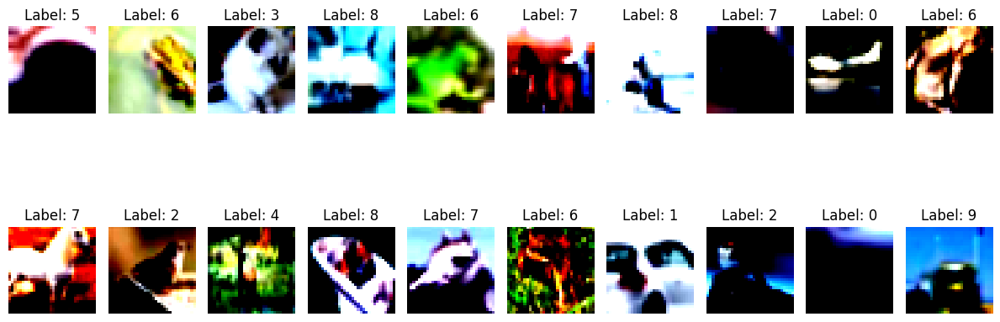

Epoch [82/100], Loss: 0.0226
Epoch [82/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


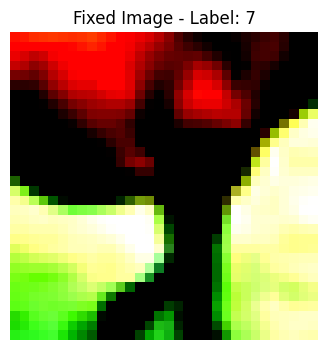

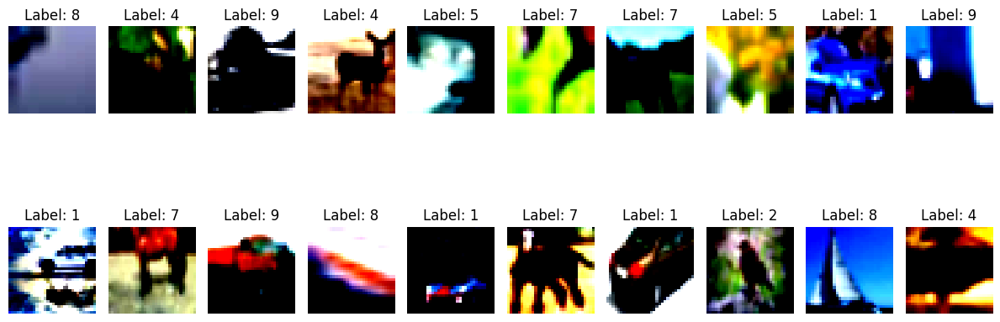

Epoch [83/100], Loss: 0.0226
Epoch [83/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.45it/s]


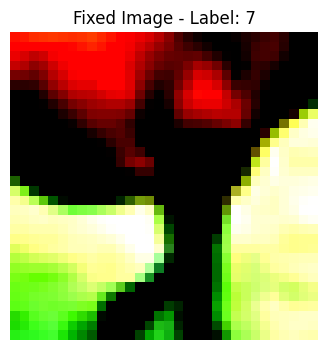

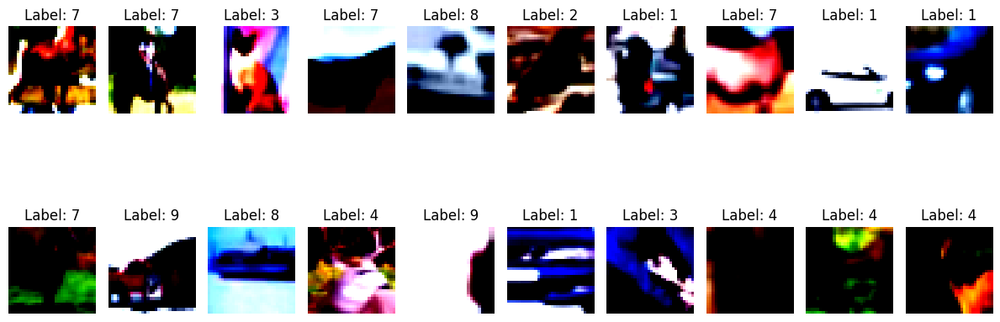

Epoch [84/100], Loss: 0.0226
Epoch [84/100], How simialr?: 5 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


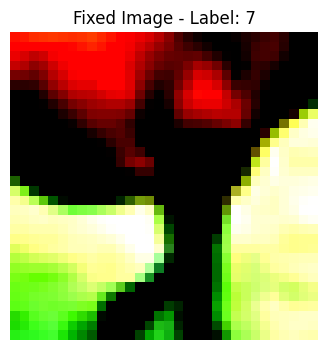

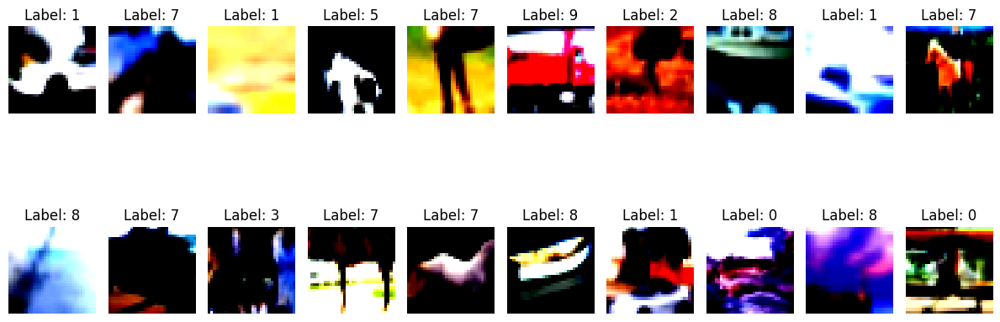

Epoch [85/100], Loss: 0.0225
Epoch [85/100], How simialr?: 6 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


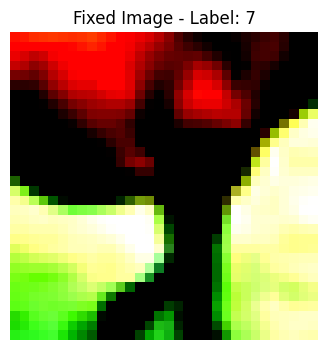

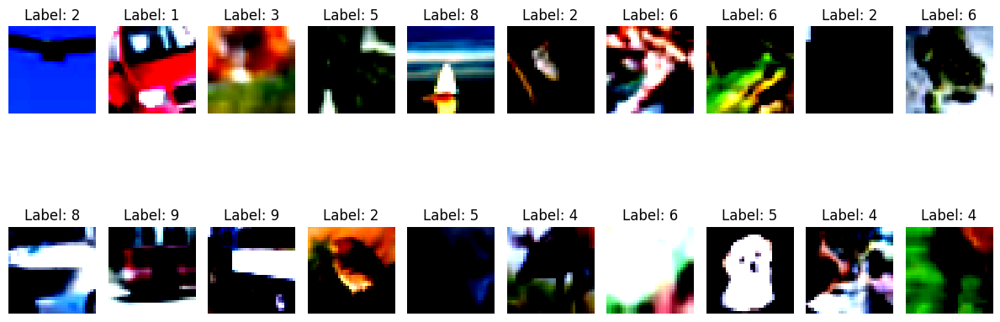

Epoch [86/100], Loss: 0.0226
Epoch [86/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.45it/s]


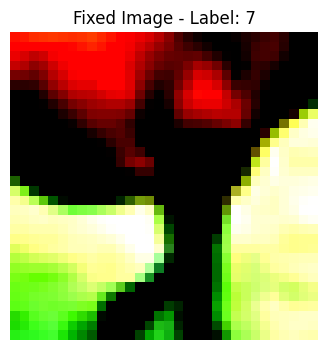

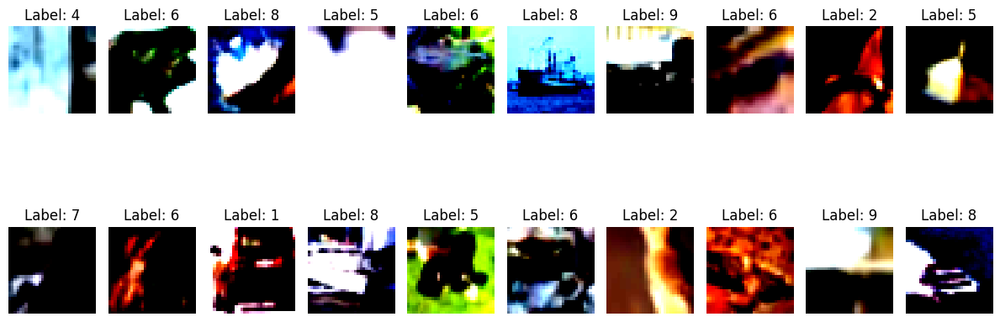

Epoch [87/100], Loss: 0.0225
Epoch [87/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


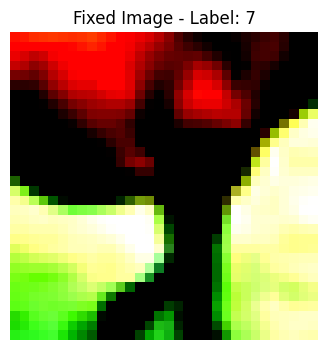

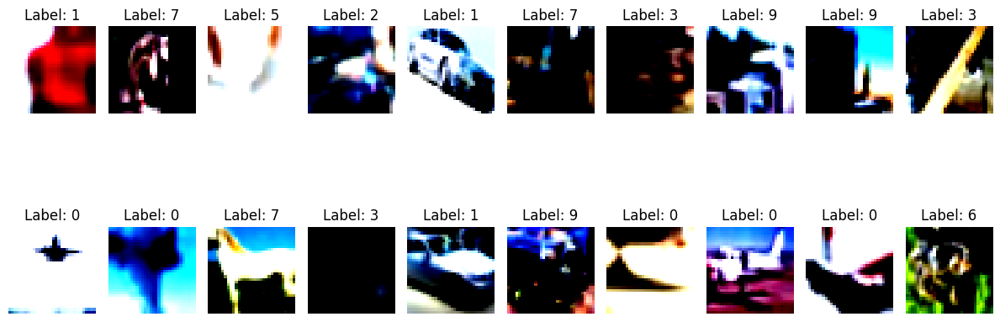

Epoch [88/100], Loss: 0.0226
Epoch [88/100], How simialr?: 3 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


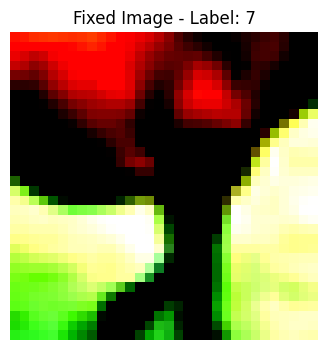

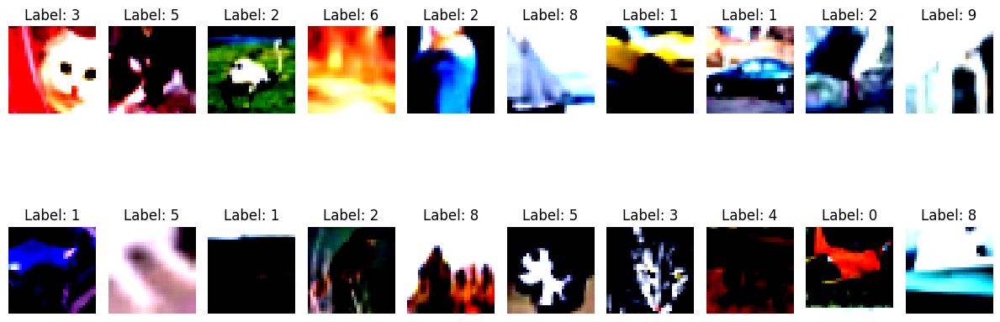

Epoch [89/100], Loss: 0.0226
Epoch [89/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


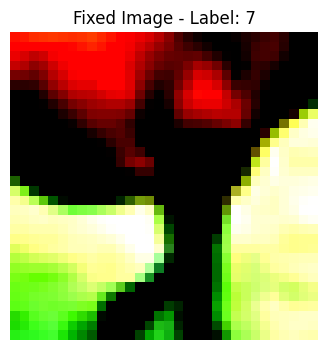

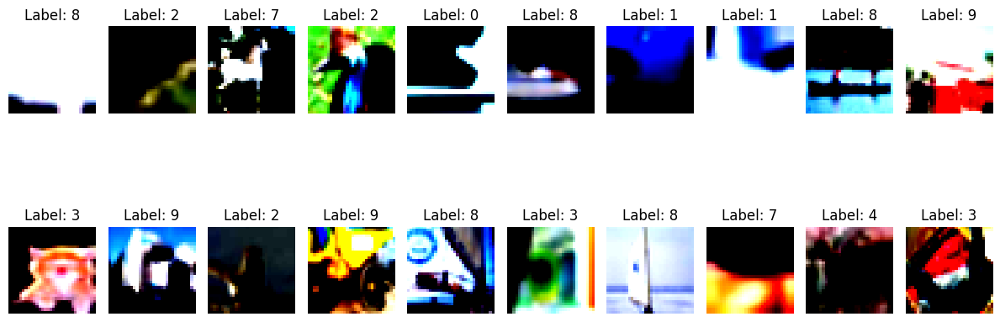

Epoch [90/100], Loss: 0.0226
Epoch [90/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


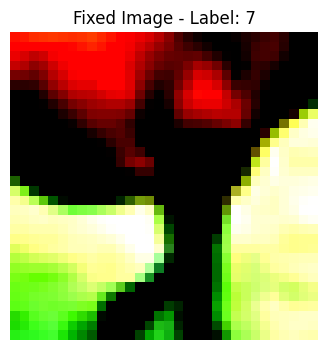

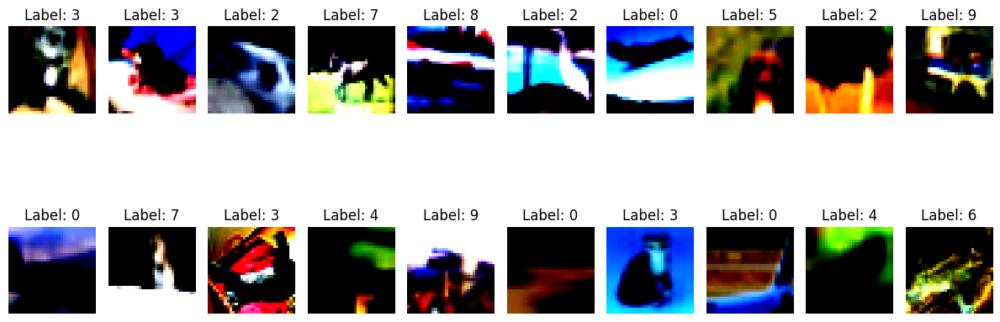

Epoch [91/100], Loss: 0.0225
Epoch [91/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.41it/s]


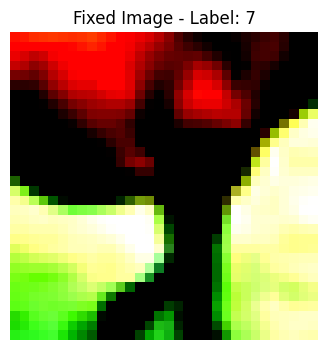

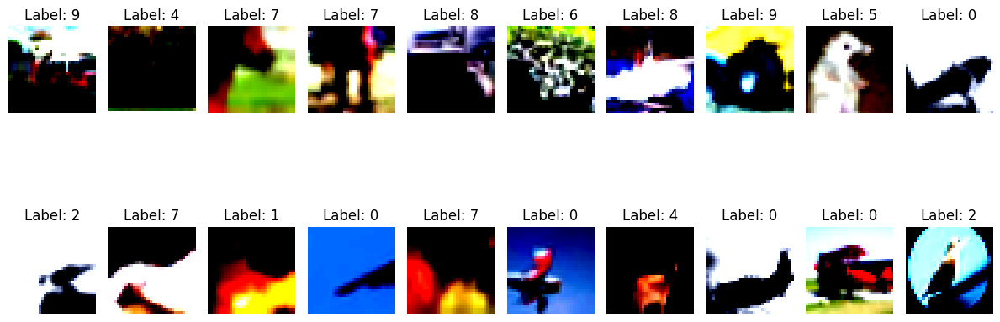

Epoch [92/100], Loss: 0.0226
Epoch [92/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.43it/s]


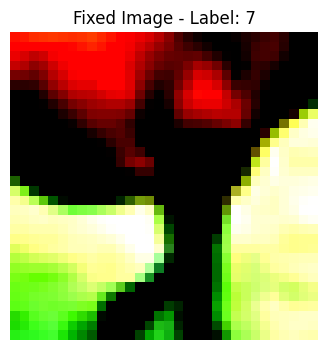

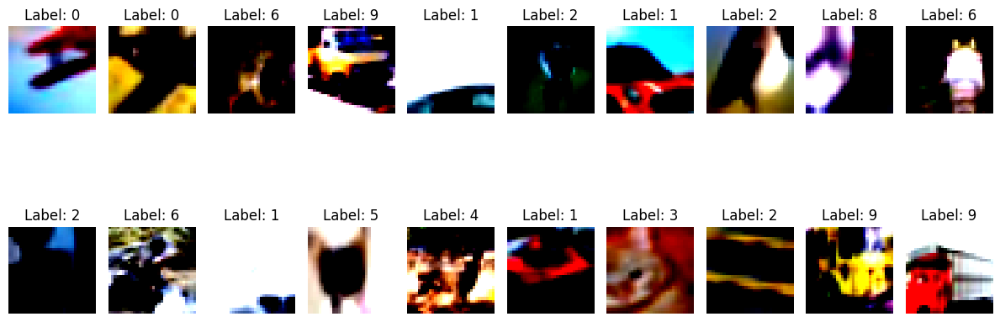

Epoch [93/100], Loss: 0.0226
Epoch [93/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


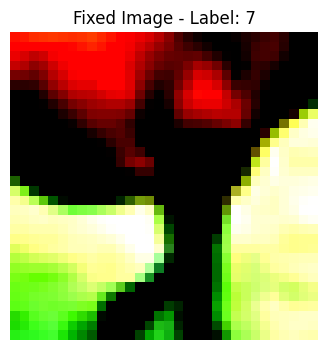

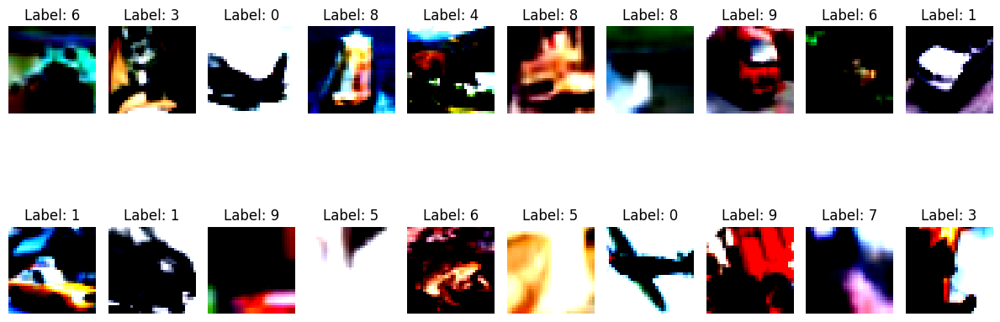

Epoch [94/100], Loss: 0.0225
Epoch [94/100], How simialr?: 1 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.40it/s]


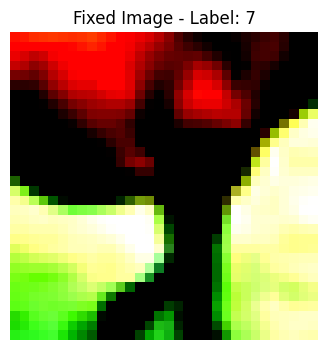

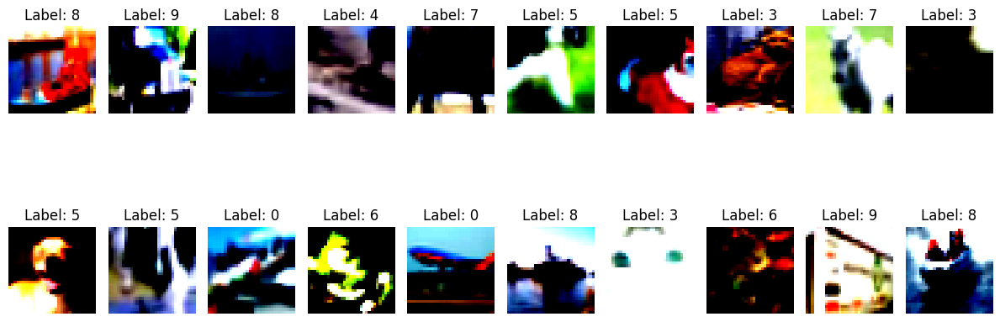

Epoch [95/100], Loss: 0.0226
Epoch [95/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


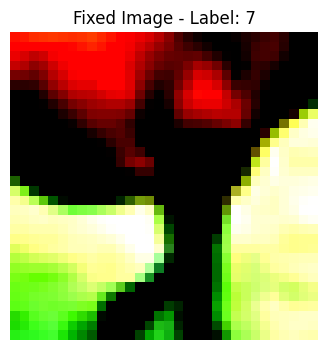

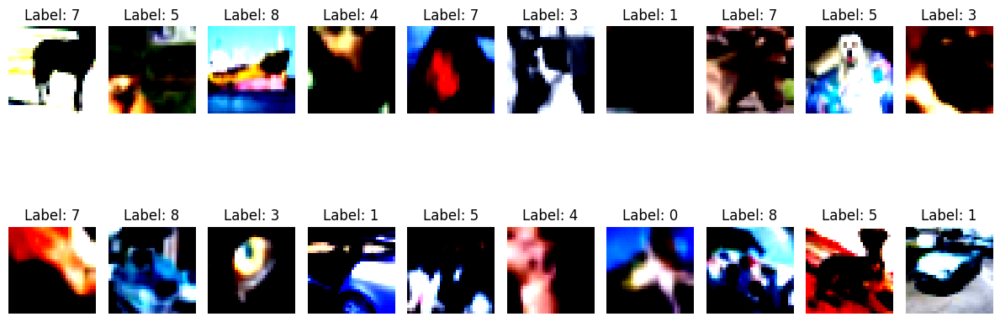

Epoch [96/100], Loss: 0.0226
Epoch [96/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.45it/s]


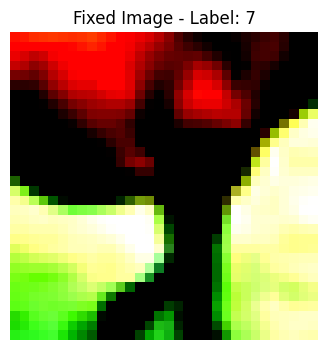

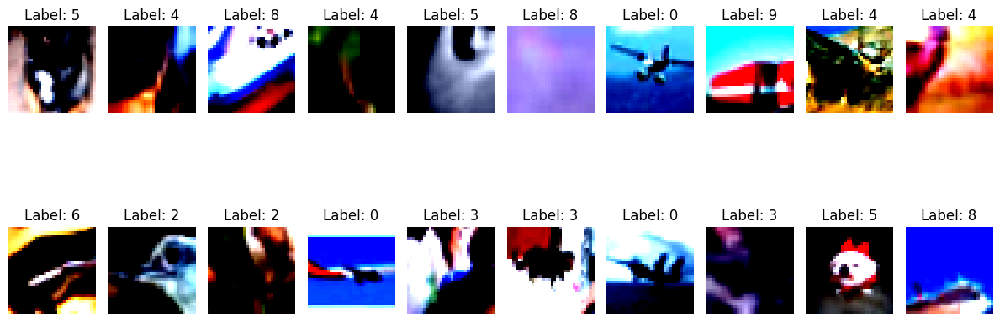

Epoch [97/100], Loss: 0.0225
Epoch [97/100], How simialr?: 0 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.44it/s]


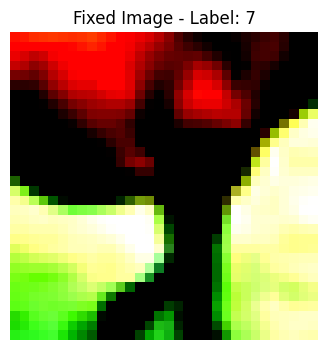

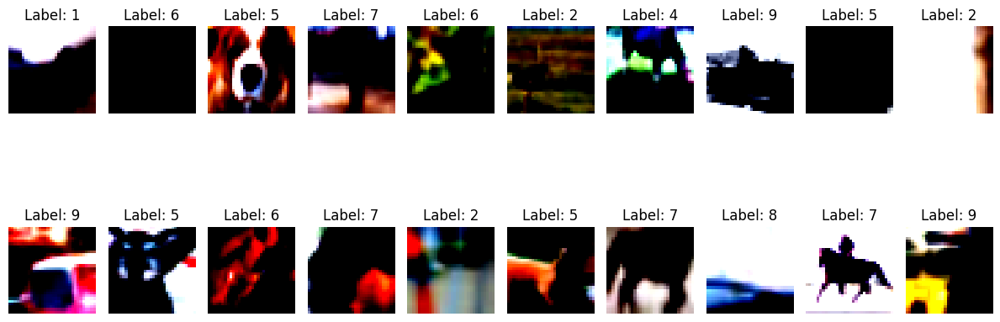

Epoch [98/100], Loss: 0.0226
Epoch [98/100], How simialr?: 4 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


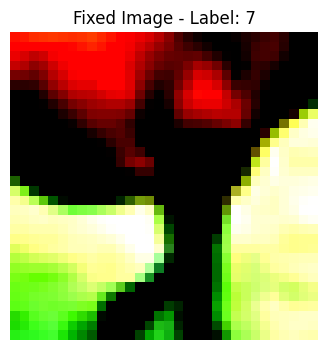

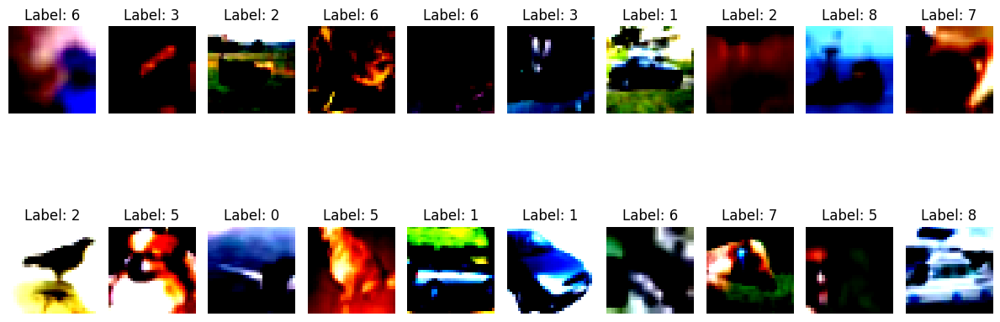

Epoch [99/100], Loss: 0.0226
Epoch [99/100], How simialr?: 2 out of 20


100%|██████████| 391/391 [00:52<00:00,  7.42it/s]


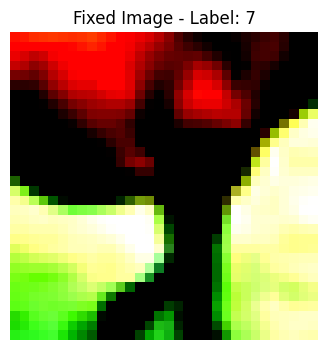

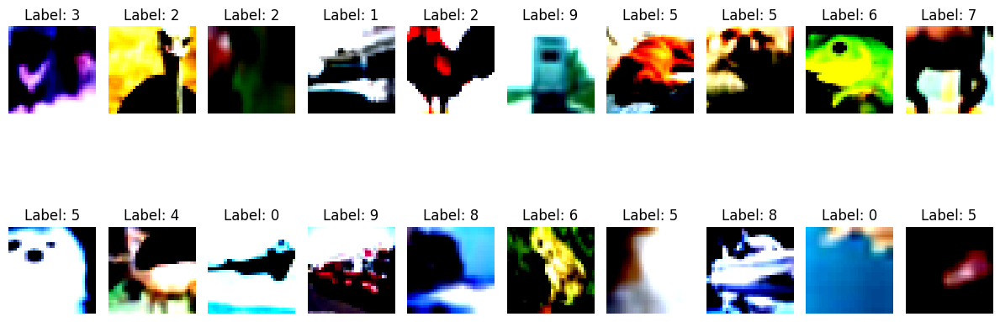

Epoch [100/100], Loss: 0.0226
Epoch [100/100], How simialr?: 1 out of 20


In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter
from torchlars import LARS
import matplotlib.pyplot as plt
import numpy as np

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyperparameters
batch_size = 128
num_epochs = 100
learning_rate = 1e-3
temperature = 0.1

# Data transforms
transform = transforms.Compose([
    transforms.RandomResizedCrop(32, antialias=True),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])

# CIFAR10 dataset
train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

# Select a specific image and its label from the dataset
fixed_image, fixed_label = train_dataset[7]  # Select the third image (index 2)
fixed_image = fixed_image.unsqueeze(0).to(device)  # Add batch dimension and move to device

# SimCLR model
class SimCLRModel(nn.Module):
    def __init__(self):
        super(SimCLRModel, self).__init__()
        self.encoder = torchvision.models.resnet18(pretrained=False)
        self.encoder.fc = nn.Identity()
        self.projector = nn.Sequential(
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Linear(128, 128)
        )

    def forward(self, x):
        z = self.encoder(x)
        p = self.projector(z)
        return z, F.normalize(p, dim=1)

model = SimCLRModel().to(device)
base_optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9, weight_decay=1e-6)
optimizer = LARS(optimizer=base_optimizer, eps=1e-8, trust_coef=0.001)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

# TensorBoard setup
writer = SummaryWriter()

# Loss function
def nt_xent_loss(p1, p2, temperature):
    batch_size = p1.shape[0]
    labels = torch.cat([torch.arange(batch_size) for _ in range(2)], dim=0)
    labels = (labels.unsqueeze(0) == labels.unsqueeze(1)).float().to(device)

    features = torch.cat([p1, p2], dim=0)
    similarity_matrix = F.cosine_similarity(features.unsqueeze(1), features.unsqueeze(0), dim=2)

    mask = torch.eye(labels.shape[0], dtype=torch.bool).to(device)
    labels = labels[~mask].view(labels.shape[0], -1)
    similarity_matrix = similarity_matrix[~mask].view(similarity_matrix.shape[0], -1)

    positives = similarity_matrix[labels.bool()].view(labels.shape[0], -1)
    negatives = similarity_matrix[~labels.bool()].view(labels.shape[0], -1)

    logits = torch.cat([positives, negatives], dim=1)
    labels = torch.zeros(logits.shape[0], dtype=torch.long).to(device)

    logits = logits / temperature
    return F.cross_entropy(logits, labels)

# Initialize a variable to hold the closest indices for the third image
closest_indices = None

# Training loop
for epoch in range(num_epochs):
    total_loss = 0
    all_embeddings = []
    all_labels = []
    all_images = []  # Store images
    
    for images, labels in tqdm(train_loader):
        # Get two augmented views of the same image
        img1, img2 = images.to(device), images.to(device)

        # Forward pass
        z1, p1 = model(img1)
        z2, p2 = model(img2)

        # Compute the loss
        loss = nt_xent_loss(p1, p2, temperature)

        # Backpropagation and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        all_embeddings.append(z1)
        all_labels.append(labels)
        all_images.append(img1)

    # Concatenate all embeddings, labels, and images
    embeddings = torch.cat(all_embeddings, dim=0)
    labels = torch.cat(all_labels, dim=0)
    images = torch.cat(all_images, dim=0)

    # Compute the embedding of the fixed image in evaluation mode
    model.eval()
    with torch.no_grad():
        fixed_embedding, _ = model(fixed_image)
        fixed_embedding = fixed_embedding.squeeze(0)
    model.train()

    # Compute the closest indices for the fixed image during the first epoch
    if epoch == 0:
        similarities = F.cosine_similarity(fixed_embedding.unsqueeze(0), embeddings, dim=1)
        _, closest_indices = torch.topk(similarities, k=21, largest=True)
        closest_indices = closest_indices[1:]  # Remove the first index, which is the fixed image itself

    # Log the loss to TensorBoard
    writer.add_scalar('Loss', total_loss / len(train_loader), epoch)

    # Step the scheduler
    scheduler.step()

    # Visualize the fixed image
    with torch.no_grad():
        fixed_image_np = fixed_image.squeeze(0).cpu().numpy()

        plt.figure(figsize=(4, 4))
        plt.imshow(np.transpose(fixed_image_np, (1, 2, 0)))
        plt.title(f"Fixed Image - Label: {fixed_label}")
        plt.axis('off')
        plt.show()

    # Visualize the 10 closest images to the fixed image
    with torch.no_grad():
        plt.figure(figsize=(12, 6))
        how_many=0

        # Plot the 10 closest images and their labels in two rows
        for i, idx in enumerate(closest_indices[:5]):
            image = images[idx].cpu().numpy()
            label = labels[idx].item()
            if label == 7:
                how_many+=1
            plt.subplot(2, 10, i + 1)
            plt.imshow(np.transpose(image, (1, 2, 0)))
            plt.title(f"Label: {label}")
            plt.axis('off')
            
        for i, idx in enumerate(closest_indices[5:]):
            image = images[idx].cpu().numpy()
            label = labels[idx].item()
            if label == 7:
                how_many+=1

            plt.subplot(2, 10, i + 6)
            plt.imshow(np.transpose(image, (1, 2, 0)))
            plt.title(f"Label: {label}")
            plt.axis('off')

        plt.tight_layout()
        plt.show()

    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {total_loss / len(train_loader):.4f}')
    print(f'Epoch [{epoch + 1}/{num_epochs}], How simialr?: {how_many} out of 20')

writer.close()


In [ ]:
print("uyyjk")